##Importing libraries

In [ ]:
import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
import warnings
warnings.filterwarnings("ignore")
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

In [ ]:
!unzip /content/drive/MyDrive/100-Datasets.zip

In [ ]:
!unzip /content/drive/MyDrive/GRU_models.zip

In [ ]:
!unzip /content/drive/MyDrive/LSTM_models.zip

##Predictions for single Time series

In [ ]:
columts = ['Time', 'a1','a2','a3','a4','a5','a6','a7','a8','a9']

In [ ]:
df=pd.read_csv("/content/Time_evolution_of_Moehlis_coefficients_a4_0p02_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
df.head()

,Time,a1,a2,a3,a4,a5,a6,a7,a8,a9
0,0.0,1.000000,0.070660,-0.070760,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1.0,0.992277,0.141792,-0.070150,0.019445,0.004016,-0.001898,0.000024,-0.000110,-0.007556
2,2.0,0.979650,0.210057,-0.069549,0.018287,0.007809,-0.004641,0.000749,0.000036,-0.019534
3,3.0,0.962461,0.274880,-0.068959,0.016795,0.011282,-0.007513,0.002364,0.000572,-0.035392
4,4.0,0.941083,0.335789,-0.068380,0.015211,0.014396,-0.009736,0.004855,0.001594,-0.054582


In [ ]:
df=df[1::]

In [ ]:
data1=df.iloc[:,1:].values
data1

array([[ 9.92277e-01,  1.41792e-01, -7.01500e-02, ...,  2.40000e-05,
        -1.10000e-04, -7.55600e-03],
       [ 9.79650e-01,  2.10057e-01, -6.95490e-02, ...,  7.49000e-04,
         3.60000e-05, -1.95340e-02],
       [ 9.62461e-01,  2.74880e-01, -6.89590e-02, ...,  2.36400e-03,
         5.72000e-04, -3.53920e-02],
       ...,
       [ 9.98010e-02, -2.35060e-02, -1.74749e-01, ..., -1.21790e-02,
        -4.02900e-03, -2.64283e-01],
       [ 1.12173e-01, -5.51890e-02, -1.78868e-01, ..., -1.85470e-02,
        -7.86700e-03, -2.43317e-01],
       [ 1.29543e-01, -7.73810e-02, -1.81324e-01, ..., -2.52130e-02,
        -1.34250e-02, -2.18538e-01]])

In [ ]:
data1.shape

(4000, 9)

Mathematics of Mean squared error:

The Mean Squared Error (MSE) for each output feature m can be calculated as:

MSE_m = (1 / N) * Σ(y_true_m - y_pred_m)^2

where Σ denotes the summation over all N samples.

To obtain the overall loss value across all output features, we average the MSE values for each feature:

Loss = (1 / M) * Σ(MSE_m)

###Multistep-Model

In [ ]:
from sklearn.model_selection import train_test_split
x_train_nonorm,x_test_nonorm,y_train_nonorm,y_test_nonorm=train_test_split(data1,data1,shuffle=False,test_size=0.2,random_state=123)

In [ ]:
x_train_nonorm.shape,y_train_nonorm.shape

In [ ]:
window_length=500
batch_size=32
num_features=9
train_generator_nonorm=TimeseriesGenerator(x_train_nonorm,y_train_nonorm,length=window_length, sampling_rate=1, batch_size=batch_size)
test_generator_nonorm=TimeseriesGenerator(x_test_nonorm,y_test_nonorm,length=window_length, sampling_rate=1, batch_size=batch_size)

In [ ]:
train_generator_nonorm[0]

In [ ]:
test_generator_nonorm[0]

##**Model Architecture**

In [ ]:
model=Sequential()
model.add(LSTM(90,input_shape=(window_length,num_features),return_sequences=False))
model.add(Dense(9))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 90)                36000     
                                                                 
 dense (Dense)               (None, 9)                 819       
                                                                 
Total params: 36819 (143.82 KB)
Trainable params: 36819 (143.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


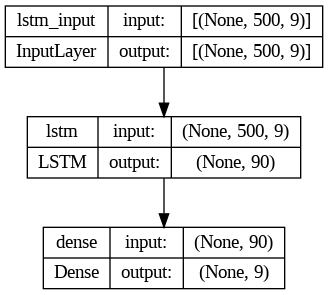

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

history_nonorm = model.fit(train_generator_nonorm, epochs=50,
                      validation_data=test_generator_nonorm,shuffle=False,
                      callbacks=[early_stopping])

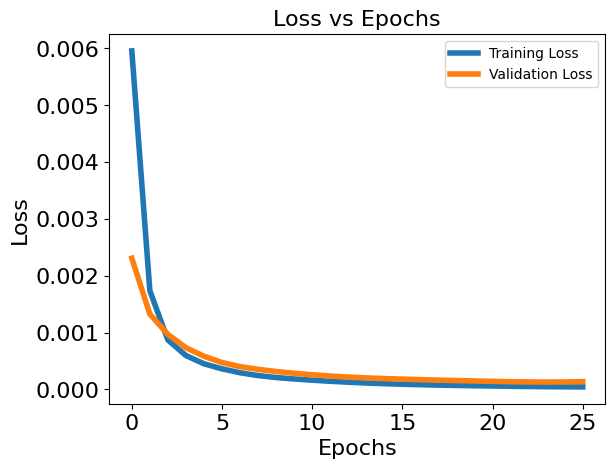

In [ ]:
#Plot the loss curve
plt.plot(history_nonorm.history['loss'],label='Training Loss',linewidth=4)
plt.plot(history_nonorm.history['val_loss'], label='Validation Loss',linewidth=4)
plt.title('Loss vs Epochs',fontsize=16)
plt.xlabel('Epochs',fontsize=16)
plt.ylabel('Loss',fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend()
plt.savefig(f'loss_vs_epoch_ms.png',bbox_inches='tight')

plt.show()

In [ ]:
model.save('Multistep_nonorm.h5')

In [ ]:
multistep_nonorm_model=tf.keras.models.load_model('Multistep_nonorm.h5')

In [ ]:
multistep_nonorm_model.evaluate_generator(test_generator_nonorm,verbose=0)

[0.00013507631956599653, 0.008099222555756569]

In [ ]:
predictions_nonorm=multistep_nonorm_model.predict_generator(test_generator_nonorm)

In [ ]:
predictions_nonorm[0]

array([ 0.19269264,  0.0160724 , -0.01285905, -0.02337965, -0.05350217,
        0.10423572, -0.07390909,  0.02200738, -0.07017967], dtype=float32)

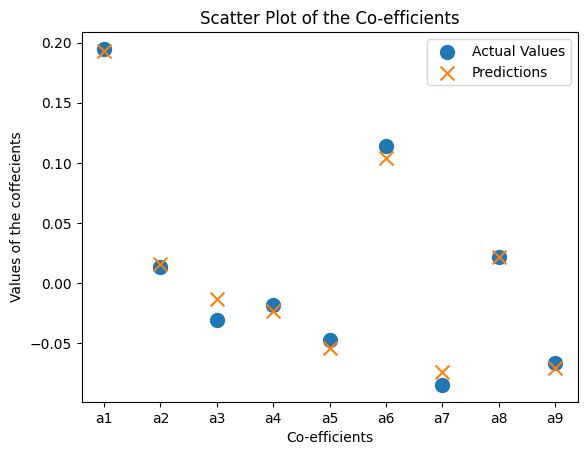

In [ ]:
Target_values=[[ 1.94701e-01,  1.38360e-02, -3.07870e-02, -1.81260e-02,-4.68810e-02,  1.14123e-01, -8.45170e-02,  2.19440e-02,-6.64770e-02]]
coeff=['a1','a2','a3','a4','a5','a6','a7','a8','a9']
plt.scatter(coeff,Target_values,label='Actual Values', s=100)
plt.scatter(coeff,predictions_nonorm[0],label='Predictions',marker='x', s=100)
plt.title('Scatter Plot of the Co-efficients')
plt.xlabel('Co-efficients')
plt.ylabel('Values of the coffecients')
plt.legend()

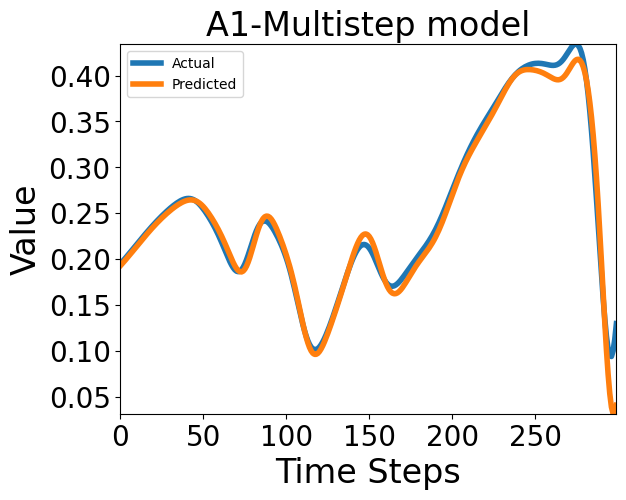

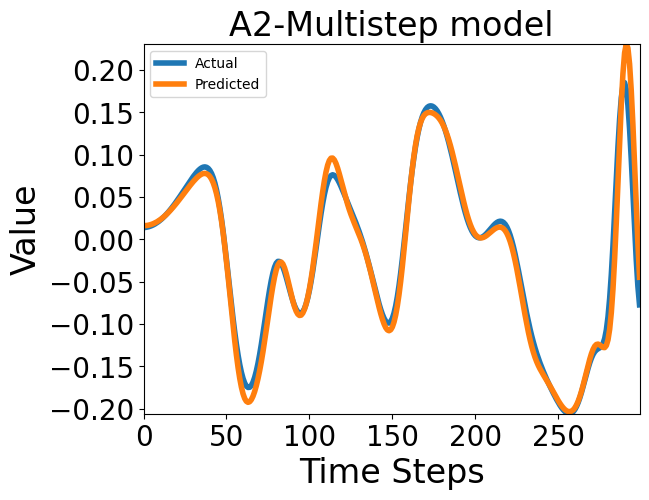

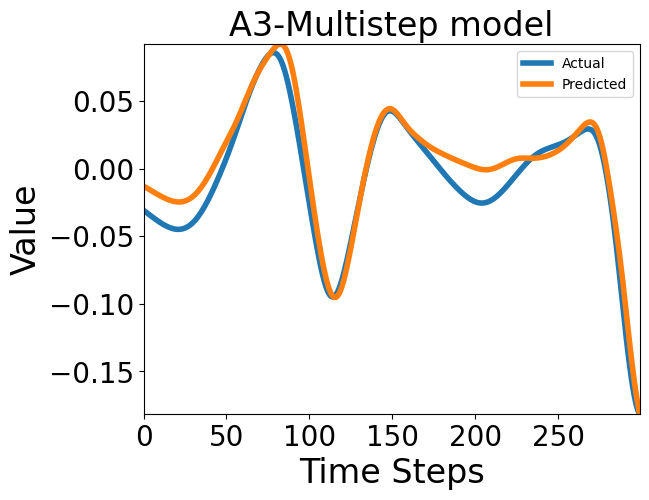

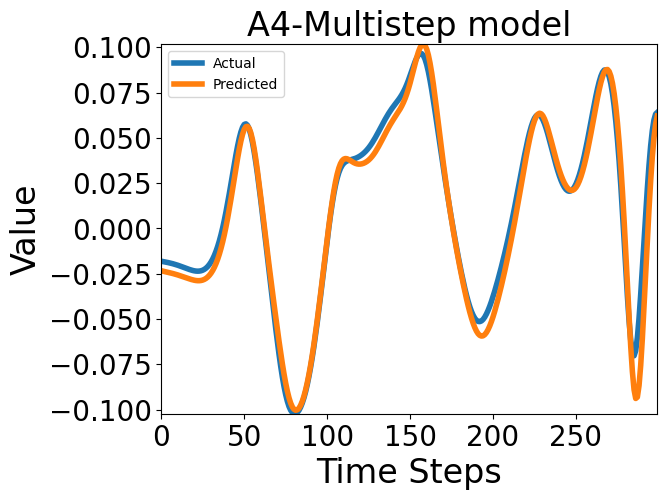

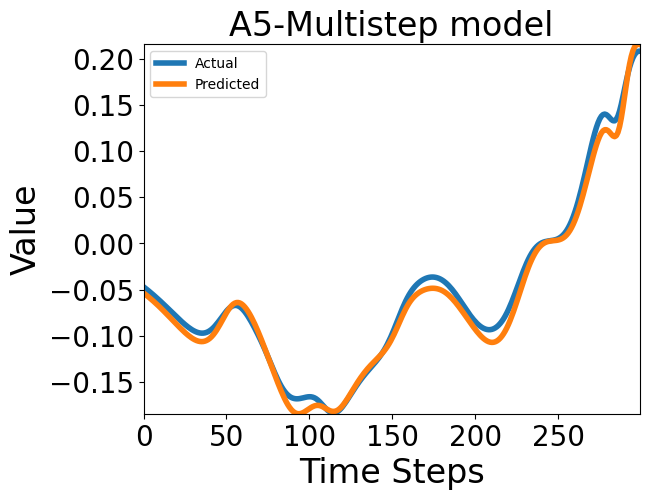

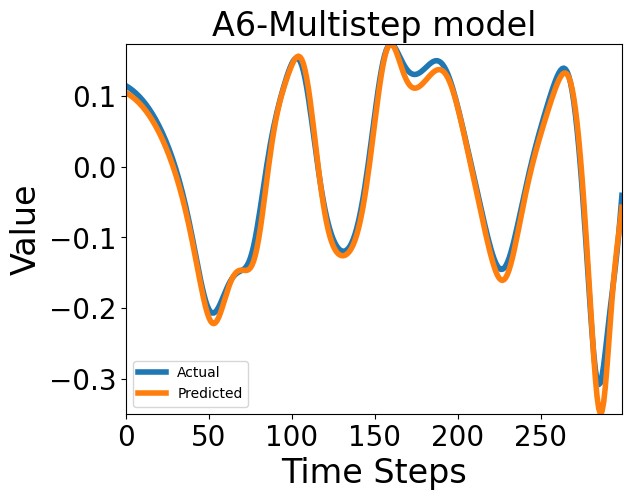

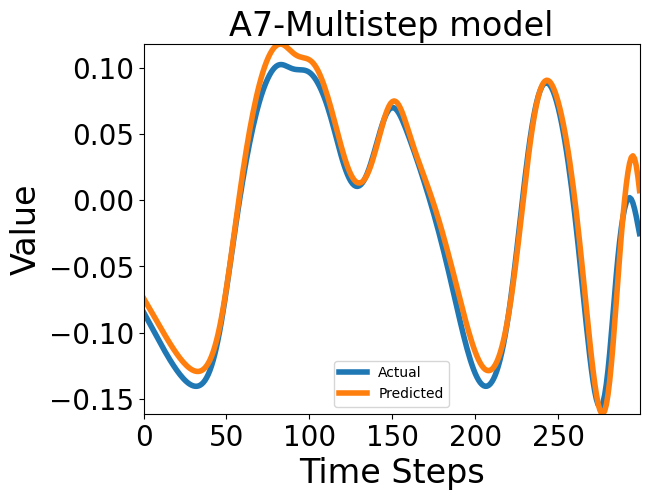

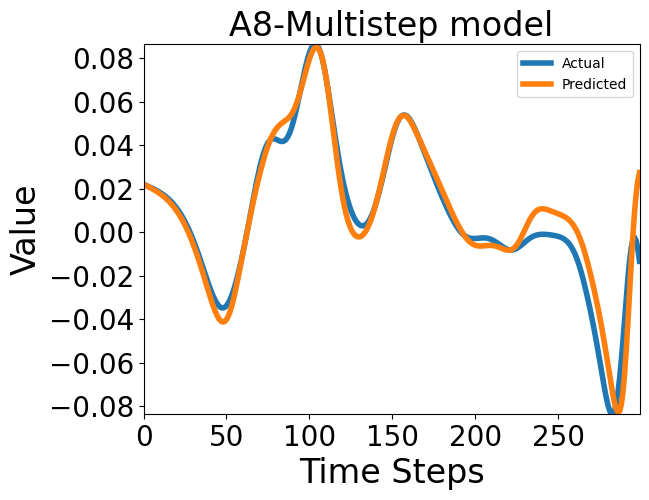

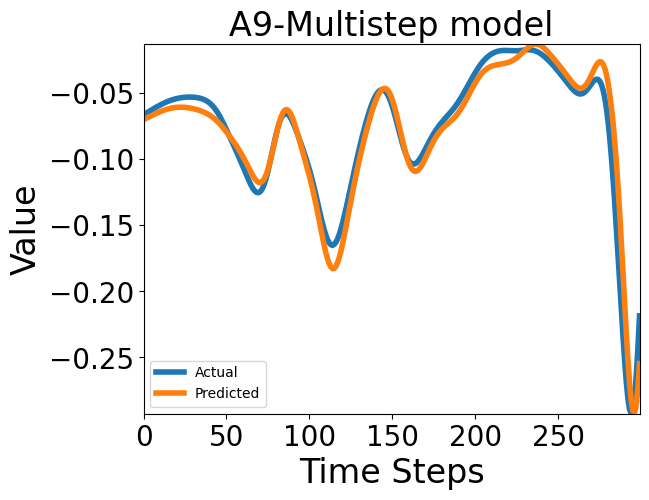

In [ ]:
for j in range(9):
  predicted_values = predictions_nonorm[:,j]
  feature_values = []
  for i in range(len(test_generator_nonorm)):
    _,batch_data = test_generator_nonorm[i] # Get the input sequence batch
    feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
  time_steps = range(len(feature_values))

# Plot the first feature values
  plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
  plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
  plt.xlabel('Time Steps',fontsize=24)
  plt.ylabel('Value',fontsize=24)
  plt.margins(0, 0)
  plt.title(f'A{j+1}-Multistep model',fontsize=24)
  plt.legend()
  plt.xticks(fontsize=20)
  plt.yticks(fontsize=20)
  plt.savefig(f'A{j+1}_multi.png', bbox_inches='tight')
  plt.show()

###Singlestep model

In [ ]:
train_generator_nonorm_singlestep=TimeseriesGenerator(x_train_nonorm,y_train_nonorm,length=500, sampling_rate=1, batch_size=1)
test_generator_nonorm_singlestep=TimeseriesGenerator(x_test_nonorm,y_test_nonorm,length=500, sampling_rate=1, batch_size=1)

In [ ]:
train_generator_nonorm_singlestep[0]

(array([[[ 9.92277e-01,  1.41792e-01, -7.01500e-02, ...,  2.40000e-05,
          -1.10000e-04, -7.55600e-03],
         [ 9.79650e-01,  2.10057e-01, -6.95490e-02, ...,  7.49000e-04,
           3.60000e-05, -1.95340e-02],
         [ 9.62461e-01,  2.74880e-01, -6.89590e-02, ...,  2.36400e-03,
           5.72000e-04, -3.53920e-02],
         ...,
         [ 1.43075e-01,  1.55420e-02, -1.02297e-01, ..., -8.38140e-02,
           7.93950e-02, -1.01662e-01],
         [ 1.42362e-01,  1.70400e-02, -1.02653e-01, ..., -8.36810e-02,
           7.84000e-02, -1.02008e-01],
         [ 1.41846e-01,  1.83590e-02, -1.02885e-01, ..., -8.35220e-02,
           7.73940e-02, -1.02148e-01]]]),
 array([[ 0.141543,  0.019559, -0.102984, -0.018453, -0.095617,  0.044717,
         -0.083338,  0.076379, -0.102076]]))

In [ ]:
test_generator_nonorm_singlestep[0]

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

history_nonorm_singlestep= model.fit(train_generator_nonorm_singlestep, epochs=50,
                      validation_data=test_generator_nonorm_singlestep,shuffle=False,
                      callbacks=[early_stopping])

In [ ]:
#Plot the loss curve
plt.plot(history_nonorm_singlestep.history['loss'],label='Training Loss',linewidth=4)
plt.plot(history_nonorm_singlestep.history['val_loss'], label='Validation Loss',linewidth=4)
plt.title('Loss vs Epochs',fontsize=16)
plt.xlabel('Epochs',fontsize=16)
plt.ylabel('Loss',fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(0,0.04)
plt.legend()
plt.savefig(f'loss_vs_epoch_ss.png',bbox_inches='tight')
plt.show()

In [ ]:
#Plot the loss curve
plt.plot(history_nonorm_singlestep.history['loss'],label='Training loss')
plt.plot(history_nonorm_singlestep.history['val_loss'],label='Validation loss')
plt.title('Loss vs Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
#plt.ylim(0,0.005)
plt.show()

In [ ]:
model.save('singlestep_model_nonorm.h5')

In [ ]:
singlestep_nonorm_model=tf.keras.models.load_model('singlestep_model_nonorm.h5')

In [ ]:
singlestep_nonorm_model.evaluate_generator(test_generator_nonorm_singlestep)

[0.04506257176399231, 0.16761519014835358]

In [ ]:
singlestep_nonorm_predictions=singlestep_nonorm_model.predict_generator(test_generator_nonorm_singlestep)

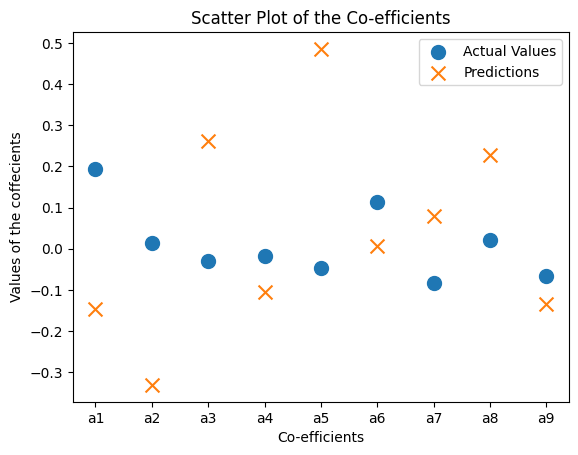

In [ ]:
Target_values=[[ 0.194701,  0.013836, -0.030787, -0.018126, -0.046881,  0.114123,-0.084517,  0.021944, -0.066477]]
coeff=['a1','a2','a3','a4','a5','a6','a7','a8','a9']
plt.scatter(coeff,Target_values,label='Actual Values', s=100)
plt.scatter(coeff,singlestep_nonorm_predictions[0],label='Predictions',marker='x', s=100)
plt.title('Scatter Plot of the Co-efficients')
plt.xlabel('Co-efficients')
plt.ylabel('Values of the coffecients')
plt.legend()

In [ ]:
singlestep_nonorm_predictions

array([[-0.14592497, -0.33082882,  0.26181957, ...,  0.07990178,
         0.22815694, -0.1351738 ],
       [-0.14506085, -0.3303091 ,  0.26154405, ...,  0.07799958,
         0.22770843, -0.13530493],
       [-0.14416479, -0.3296481 ,  0.26124218, ...,  0.07616454,
         0.22726905, -0.13549542],
       ...,
       [ 0.24764875,  0.15167071, -0.03043462, ...,  0.26639795,
         0.13516366, -0.18187824],
       [ 0.24971078,  0.12203754, -0.0258872 , ...,  0.25790012,
         0.1396325 , -0.17142326],
       [ 0.2567971 ,  0.09321921, -0.02244435, ...,  0.2451466 ,
         0.14261387, -0.15791135]], dtype=float32)

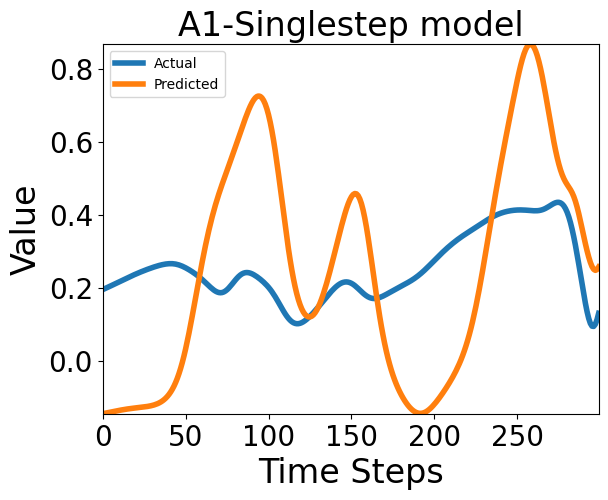

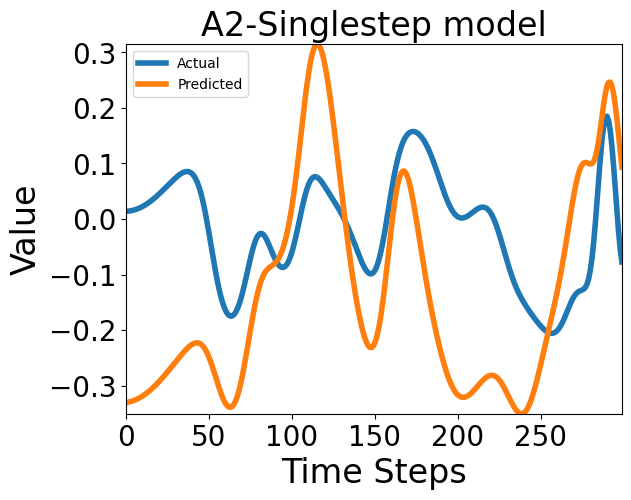

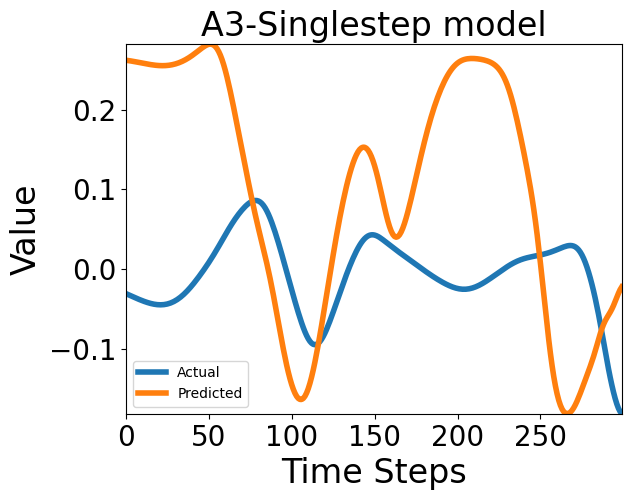

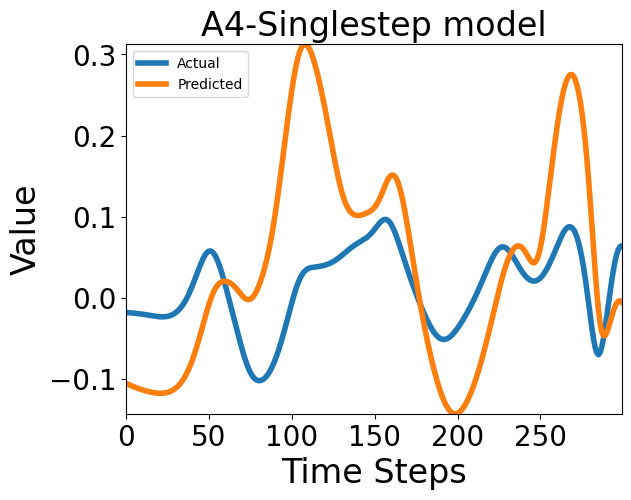

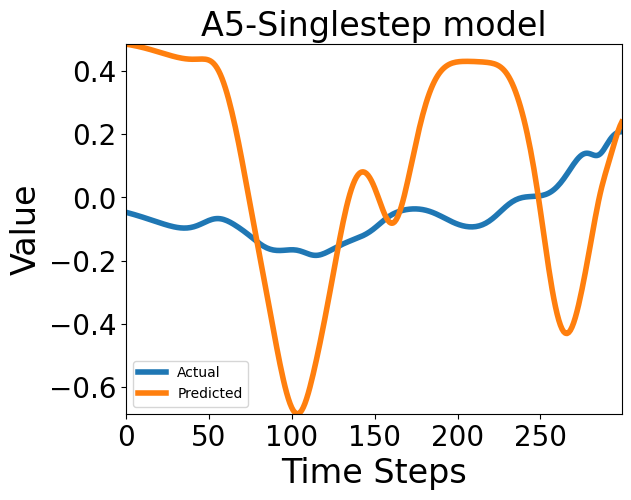

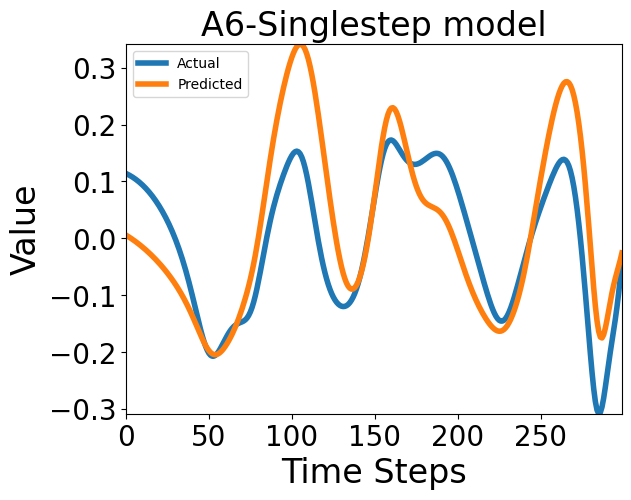

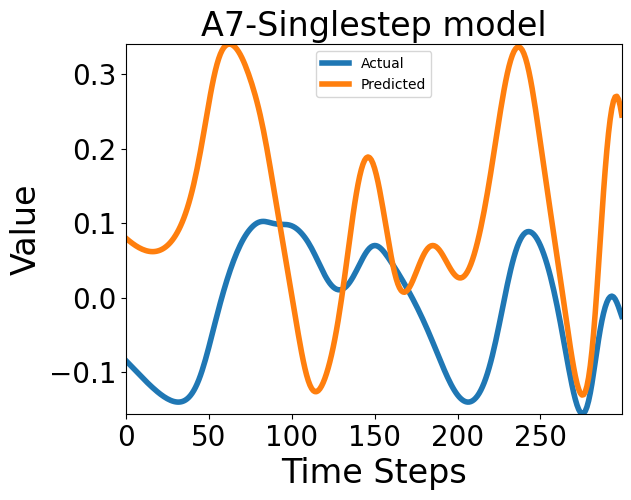

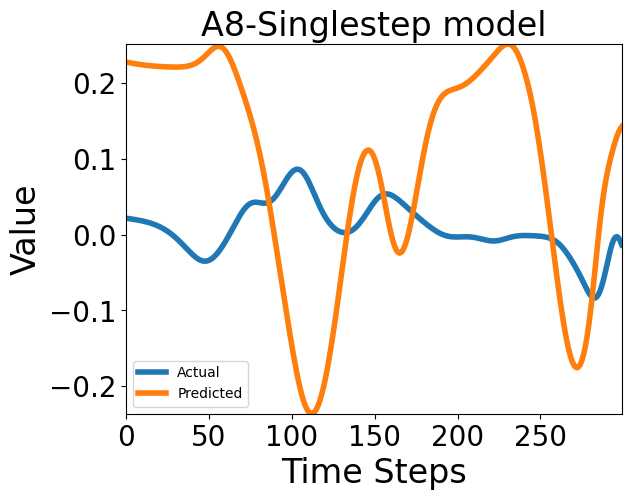

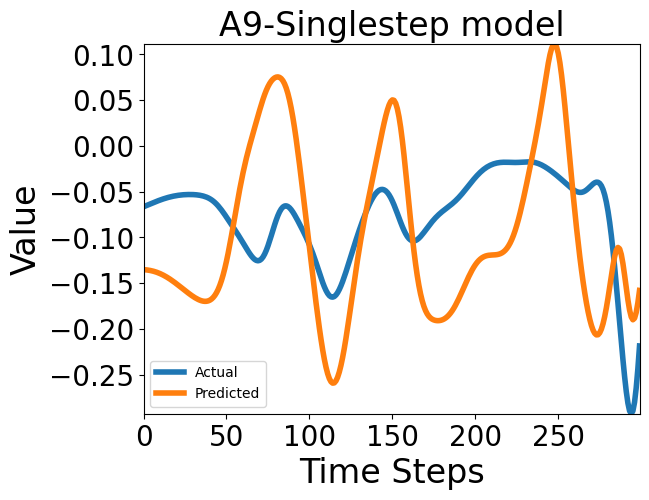

In [ ]:
for k in range(9):
  predicted_values = singlestep_nonorm_predictions[:,k]
  feature_values = []
  for i in range(len(test_generator_nonorm_singlestep)):
    _,batch_data = test_generator_nonorm_singlestep[i] # Get the input sequence batch
    feature_values.extend(batch_data[:, k])  # Extract the first feature values from the batch

# Get the time steps
  time_steps = range(len(feature_values))

  # Plot the first feature values
  plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
  plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
  plt.xlabel('Time Steps',fontsize=24)
  plt.ylabel('Value',fontsize=24)
  plt.margins(0,0)
  plt.title(f'A{k+1}-Singlestep model',fontsize=24)
  plt.legend()
  plt.xticks(fontsize=20)
  plt.yticks(fontsize=20)
  plt.savefig(f'A{k+1}_Single.png', bbox_inches='tight')
  plt.show()

##Multiple Time series input

In [ ]:
import numpy as np
import os
from scipy.integrate import odeint
# Function defining nine ODEs
def Moehlis(y, t, p):
    a1, a2, a3, a4, a5, a6, a7, a8, a9 = y
    p = [a, b, g, Re]
    k_ag = np.sqrt(a**2 + g**2)
    k_ab = np.sqrt(a**2 + b**2)
    k_bg = np.sqrt(b**2 + g**2)
    k_abg = np.sqrt(a**2 + b**2 + g**2)
    da1dt = (b**2)/Re - (b**2/Re)*a1 - np.sqrt(3/2)*(b*g/k_abg)*a6*a8 + np.sqrt(3/2)*(b*g/k_bg)*a2*a3
    da2dt = -(4*b**2/3+g**2)*(a2/Re) + ((5*np.sqrt(2)*g**2)/(3*np.sqrt(3)*k_ag))*a4*a6 - (g**2/(np.sqrt(6)*k_ag))*a5*a7 - ((a*b*g)/(np.sqrt(6)*k_ag*k_abg))*a5*a8 - np.sqrt(3/2)*((b*g)/(k_bg))*a1*a3 - np.sqrt(3/2)*((b*g)/(k_bg))*a3*a9
    da3dt = -(k_bg**2/Re)*a3 + ((2.*a*b*g)/(np.sqrt(6)*k_ag*k_bg))*(a4*a7+a5*a6) + ((b**2*(3*a**2+g**2)-3*g**2*k_ag**2)/(np.sqrt(6)*k_ag*k_bg*k_abg))*a4*a8
    da4dt = -((3*a**2+4*b**2)/(3*Re))*a4 - (a/np.sqrt(6))*a1*a5 - ((10*a**2)/(3*np.sqrt(6)*k_ag))*a2*a6 - np.sqrt(3/2)*((a*b*g)/(k_ag*k_bg))*a3*a7 - np.sqrt(3/2)*((a**2*b**2)/(k_ag*k_bg*k_abg))*a3*a8 -(a/np.sqrt(6))*a5*a9
    da5dt = -(k_ab**2/Re)*a5 + (a/np.sqrt(6))*a1*a4 + (a**2/(np.sqrt(6)*k_ag))*a2*a7 - (a*b*g/(np.sqrt(6)*k_ag*k_abg))*a2*a8 + (a/np.sqrt(6))*a4*a9 + ((2*a*b*g)/(np.sqrt(6)*k_ag*k_bg))*a3*a6
    da6dt = -((3*a**2+4*b**2+3*g**2)/(3*Re))*a6 + (a/np.sqrt(6))*a1*a7 + (np.sqrt(3/2)*b*g/(k_abg))*a1*a8 + (10*(a**2-g**2)/(3*np.sqrt(6)*k_ag))*a2*a4 - (2*np.sqrt(2/3)*a*b*g/(k_ag*k_bg))*a3*a5 + (a/np.sqrt(6))*a7*a9 + (np.sqrt(3/2)*b*g/k_abg)*a8*a9
    da7dt = -(k_abg**2/Re)*a7 - a*(a1*a6+a6*a9)/np.sqrt(6) + ((g**2-a**2)/(np.sqrt(6)*k_ag))*a2*a5 + ((a*b*g)/(np.sqrt(6)*k_ag*k_bg))*a3*a4
    da8dt = -(k_abg**2/Re)*a8 + ((2*a*b*g)/(np.sqrt(6)*k_ag*k_abg))*a2*a5 + (g**2*(3*a**2-b**2+3*g**2)/(np.sqrt(6)*k_ag*k_bg*k_abg))*a3*a4
    da9dt = -(9*b**2/Re)*a9 + (np.sqrt(3/2)*b*g/k_bg)*a2*a3 - (np.sqrt(3/2)*b*g/k_abg)*a6*a8
    func = [da1dt, da2dt, da3dt, da4dt, da5dt, da6dt, da7dt, da8dt, da9dt]
    return func

# Input parameters
Re = 400
Lx = 4 * np.pi
Ly = 2
Lz = 2 * np.pi
a = 2 * np.pi / Lx  # alpha
b = np.pi / 2.  # beta
g = 2 * np.pi / Lz  # gamma
p = [a, b, g, Re]

# Create a directory to store the dataset files
output_directory = "datasets"
os.makedirs(output_directory, exist_ok=True)

# Generate 100 datasets with varied values in the 4th position of y0
num_datasets = 141
for dataset_num in range(num_datasets):
    # Generate a random value between -1 and 1 and scale it to be close to zero
    random_value = np.random.uniform(-0.1, 0.1)

    # Modify the 4th position in the y0 array
    y0 = [1, 0.07066, -0.07076, random_value, 0, 0, 0, 0, 0]

    # Create time array
    time = np.linspace(0, 4000, 4001)    #time array
    sol = odeint(Moehlis, y0, time, args = (p,))  # Gives solution of nine ODEs

    y = np.linspace(-1, 1, 50)
    x = np.linspace(0, Lx, 60)
    z = np.linspace(0, Lz, 60)


    u1x = np.zeros((len(y),len(z)))
    u2x = np.zeros((len(y),len(z)))
    u3y = np.zeros((len(y),len(z)))
    u3z = np.zeros((len(y),len(z)))
    u4z = np.zeros((len(y),len(z)))
    u5z = np.zeros((len(y),len(z)))
    u6x = np.zeros((len(y),len(z)))
    u6z = np.zeros((len(y),len(z)))
    u7x = np.zeros((len(y),len(z)))
    u7z = np.zeros((len(y),len(z)))
    u8x = np.zeros((len(y),len(z)))
    u8y = np.zeros((len(y),len(z)))
    u8z = np.zeros((len(y),len(z)))
    u9x = np.zeros((len(y),len(z)))


    #The following part of code stores x, y and z components of velocities ( U_X(time, y, z), U_Y(time, y, z), Y_Z(time, y, z) ) averaged over x
    for k in range(len(z)):
      for j in range(len(y)):
        #n = j + len(y)*k
        for i in range(len(x)):
          u1x[j,k] += (np.sqrt(2)*np.sin(np.pi*y[j]/2.))
          u2x[j,k] += (4/np.sqrt(3))*(np.cos(np.pi*y[j]/2))**2*np.cos(g*z[k])
          u3y[j,k] += (2./np.sqrt(4*g**2+np.pi**2))*2*g*np.cos(np.pi*y[j]/2)*np.cos(g*z[k])
          u3z[j,k] += (2./np.sqrt(4*g**2+np.pi**2))*np.pi*np.sin(np.pi*y[j]/2)*np.sin(g*z[k])
          u4z[j,k] += (4/np.sqrt(3))*np.cos(a*x[i])*(np.cos(np.pi*y[j]/2))**2
          u5z[j,k] += 2*np.sin(a*x[i])*np.sin(np.pi*y[j]/2)
          u6x[j,k] += (4*np.sqrt(2)/np.sqrt(3*(a**2+g**2)))*(-g)*np.cos(a*x[i])*(np.cos(np.pi*y[j]/2))**2*np.sin(g*z[k])
          u6z[j,k] += (4*np.sqrt(2)/np.sqrt(3*(a**2+g**2)))*a*np.sin(a*x[i])*(np.cos(np.pi*y[j]/2))**2*np.cos(g*z[k])
          u7x[j,k] += (2*np.sqrt(2)/np.sqrt(a**2+g**2))*g*np.sin(a*x[i])*np.sin(np.pi*y[j]/2)*np.sin(g*z[k])
          u7z[j,k] += (2*np.sqrt(2)/np.sqrt(a**2+g**2))*a*np.cos(a*x[i])*np.sin(np.pi*y[j]/2)*np.cos(g*z[k])
          u8x[j,k] += ( 2*np.sqrt(2)/(np.sqrt((a**2+g**2)*(4*a**2+4*g**2+np.pi**2))) )*np.pi*a*np.sin(a*x[i])*np.sin(np.pi*y[j]/2)*np.sin(g*z[k])
          u8y[j,k] += ( 2*np.sqrt(2)/(np.sqrt((a**2+g**2)*(4*a**2+4*g**2+np.pi**2))) )*2*(a**2+g**2)*np.cos(a*x[i])*np.cos(np.pi*y[j]/2)*np.sin(g*z[k])
          u8z[j,k] += ( 2*np.sqrt(2)/(np.sqrt((a**2+g**2)*(4*a**2+4*g**2+np.pi**2))) )*(-np.pi*g)*np.cos(a*x[i])*np.sin(np.pi*y[j]/2)*np.cos(g*z[k])
          u9x[j,k] += np.sqrt(2)*np.sin(3*np.pi*y[j]/2)
        u1x[j,k] /= len(x)
        u2x[j,k] /= len(x)
        u3y[j,k] /= len(x)
        u3z[j,k] /= len(x)
        u4z[j,k] /= len(x)
        u5z[j,k] /= len(x)
        u6x[j,k] /= len(x)
        u6z[j,k] /= len(x)
        u7x[j,k] /= len(x)
        u7z[j,k] /= len(x)
        u8x[j,k] /= len(x)
        u8y[j,k] /= len(x)
        u8z[j,k] /= len(x)
        u9x[j,k] /= len(x)


    #print(len(u3y))
    #print(len(u5z))


    #print(U1)
    dimV = (len(time), len(y), len(z))
    U_X = np.zeros(dimV)
    U_Y = np.zeros(dimV)
    U_Z = np.zeros(dimV)

    #print(np.shape(U_X))
    #print(np.shape(U_Y))
    #print(np.shape(U_Z))


    for i in range(4001):
      #print(time[i])
      for k in range(len(z)):
        for j in range(len(y)):
          t1 = time[i]
          U_X[i, j, k] = sol[i,0]*u1x[j,k] + sol[i,1]*u2x[j,k] + sol[i,5]*u6x[j,k] + sol[i,6]*u7x[j,k] + sol[i,7]*u8x[j,k] + sol[i,8]*u9x[j,k]
          U_Y[i, j, k] = sol[i,2]*u3y[j,k] + sol[i,7]*u8y[j,k]
          U_Z[i, j, k] = sol[i,2]*u3z[j,k] + sol[i,3]*u4z[j,k] + sol[i,4]*u5z[j,k] + sol[i,5]*u6z[j,k] + sol[i,6]*u7z[j,k] + sol[i,7]*u8z[j,k]


    #print(U_X.shape)
    print("%.2f\n" %t1)

    #The following portion of code stores nine coefficients as a function of time
    f = open(f"Time_evolution_of_Moehlis_coefficients_a4_0p{dataset_num}_PA_Srinivasan.data", "w")
    #f = open("1.data", "w")

    for i in range(4001):
      f.write("%lf\t%lf\t%lf\t%lf\t%lf\t%lf\t%lf\t%lf\t%lf\t%lf\n" %(time[i], sol[i, 0], sol[i, 1], sol[i, 2], sol[i, 3], sol[i, 4], sol[i, 5], sol[i, 6], sol[i, 7], sol[i, 8]))

    f.close()

    df=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p{dataset_num}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
    #print(df.head())
    mpl.rcParams['figure.figsize'] = (8, 6)
    mpl.rcParams['axes.grid'] = False
    plot_cols = ['a1','a2','a3','a4','a5','a6','a7','a8','a9']
    #plt.suptitle(f'Dataset - {dataset_num}', fontsize=24)
    plot_features = df[plot_cols]
    plot_features.index = df['Time']
    _ = plot_features.plot(subplots=True)
    plt.suptitle(f'Dataset- {dataset_num}', fontsize=16)
    plt.show()

    t = 20 #time at which instantaneous plots will be obtained
    #Uncomment the following to plot instantaneous in-plane velocity quiver plot and out-of-plane contour plot at particular time value
    fig2, ax = plt.subplots()
    Y, Z = np.meshgrid(y, z)
    plt.xlabel("$z$")
    plt.ylabel("$y$")

    plt.contourf(Z, Y, np.transpose(U_X[t, :, :]), levels = 50, cmap = 'jet')
    plt.colorbar()
    plt.quiver(Z, Y, np.transpose(U_Z[t, :, :]), np.transpose(U_Y[t, :, :]), color = 'k')
    plt.title(r"$t = {0}$".format(t), fontsize = 15)
    #plt.savefig("Instantaneous_velocities_t_{0}_Moehlis_Lx_4pi_Lz_2pi_Re_400_a1_1000.png".format(t))
    plt.show()


    #Uncomment the following commands to plot instantaneous mean velocity(x-averaged) along x-direction(u_x) as a function of y(bounded direction) at a fix time value
    fig3 = plt.figure()
    U_mean = np.mean(U_X[t,:,:], -1)
    plt.xlabel(r"$y$")
    plt.ylabel(r"$\bar{u}_x$")
    plt.title(r"$t = {0}$".format(t), fontsize = 15)
    plt.plot(y, U_mean, '-r')
    #plt.savefig("Mean_profile_t_{0}_Moehlis_Lx_4pi_Lz_2pi_Re_400_a1_1000.png".format(t))
    plt.show()



###Multitimeseries multistep model training

In [ ]:
for i in range(0,10):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p0{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
  print(df_.head())

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=32
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model.save(f'multistep{i}.h5')

#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_multi{i}.png', bbox_inches='tight')
  plt.show()


In [ ]:
for i in range(11,19):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
  print(df_.head())

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=32
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model.save(f'multistep{i}.h5')

#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_multi{i}.png', bbox_inches='tight')
  plt.show()


###Multitimeseries Singlestep model training

In [ ]:
for i in range(1,10):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p0{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
  print(df_.head())

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=1
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model.save(f'singlestep{i}.h5')

#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_single{i}.png', bbox_inches='tight')
  plt.show()


In [ ]:
for i in range(10,19):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
  print(df_.head())

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=1
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model.save(f'singlestep{i}.h5')

#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_single{i}.png', bbox_inches='tight')
  plt.show()


###Multistep ensembled prediction

In [ ]:
#Load models
multistep=[]
for j in range(1, 19):
  multistep.append(tf.keras.models.load_model(f'multistep{j}.h5'))

In [ ]:
#Evaluate the predictions
pred=[]
for k in range(18):
  pred.append(multistep[k].predict_generator(test_generator_nonorm))
  print(f'Evaluation of Multistep Model-{k+1} , MSE : {multistep[k].evaluate_generator(test_generator_nonorm)[0]}, MAE : {multistep[k].evaluate_generator(test_generator_nonorm)[1]} ')


test1=x_test_nonorm[-300:]


ensemble_prediction = np.mean(pred, axis=0)
from sklearn.metrics import mean_squared_error, mean_absolute_error
mse = mean_squared_error(test1, ensemble_prediction)
mae = mean_absolute_error(test1, ensemble_prediction)

print(f"Ensembled predictions evaluation - MSE: {mse}, MAE: {mae}")

Evaluation of Multistep Model-1 , MSE : 0.0001382068294333294, MAE : 0.008327099494636059 
Evaluation of Multistep Model-2 , MSE : 0.00031260086689144373, MAE : 0.013523774221539497 
Evaluation of Multistep Model-3 , MSE : 0.00011743051436496899, MAE : 0.008171680383384228 
Evaluation of Multistep Model-4 , MSE : 0.00025079562328755856, MAE : 0.012092558667063713 
Evaluation of Multistep Model-5 , MSE : 5.039677853346802e-05, MAE : 0.005320028401911259 
Evaluation of Multistep Model-6 , MSE : 7.146058487705886e-05, MAE : 0.005551424343138933 
Evaluation of Multistep Model-7 , MSE : 0.0006690883310511708, MAE : 0.01893972046673298 
Evaluation of Multistep Model-8 , MSE : 0.00021974196715746075, MAE : 0.009274741634726524 
Evaluation of Multistep Model-9 , MSE : 0.0007367705693468451, MAE : 0.020577745512127876 
Evaluation of Multistep Model-10 , MSE : 0.000745452824048698, MAE : 0.020358115434646606 
Evaluation of Multistep Model-11 , MSE : 7.89147088653408e-05, MAE : 0.0063114860095083

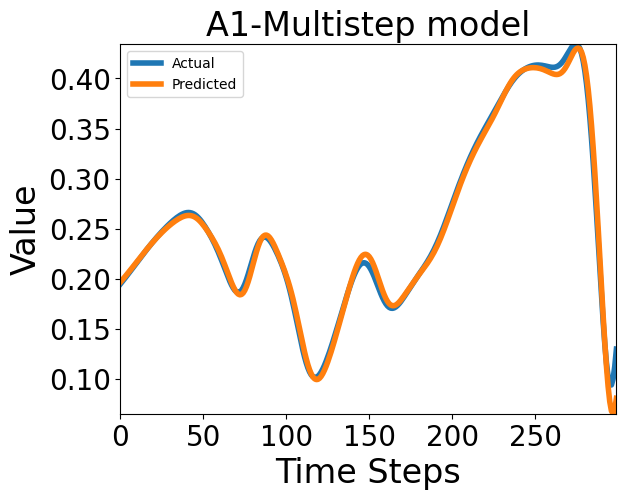

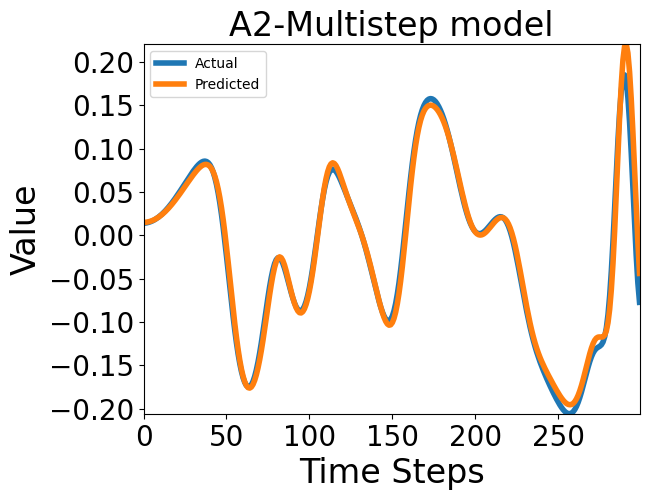

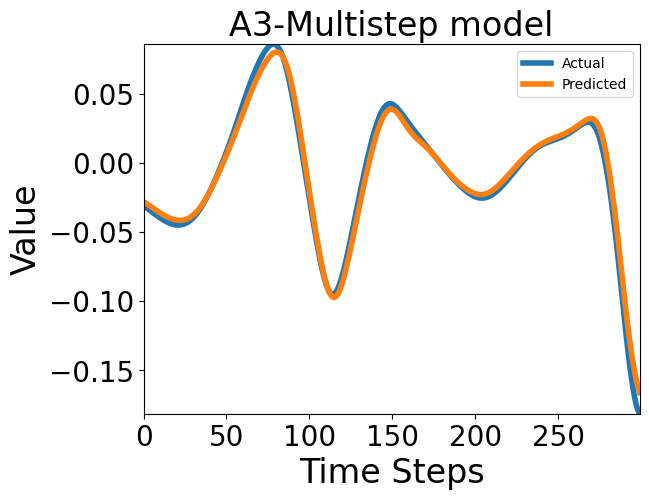

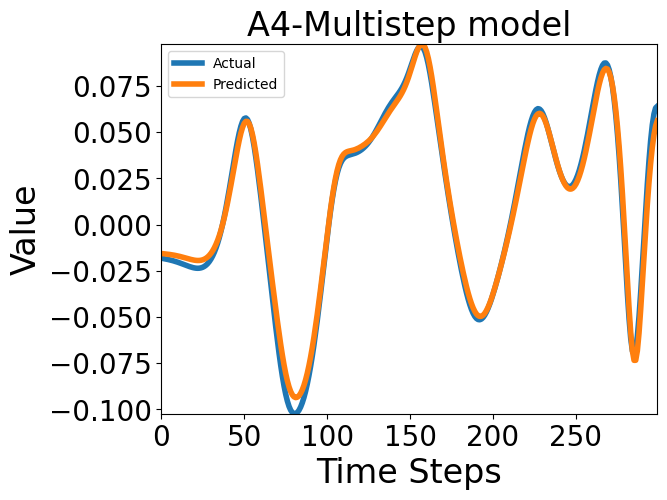

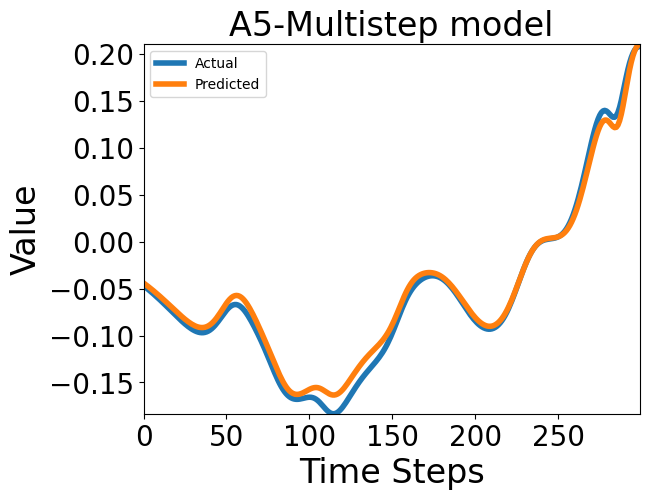

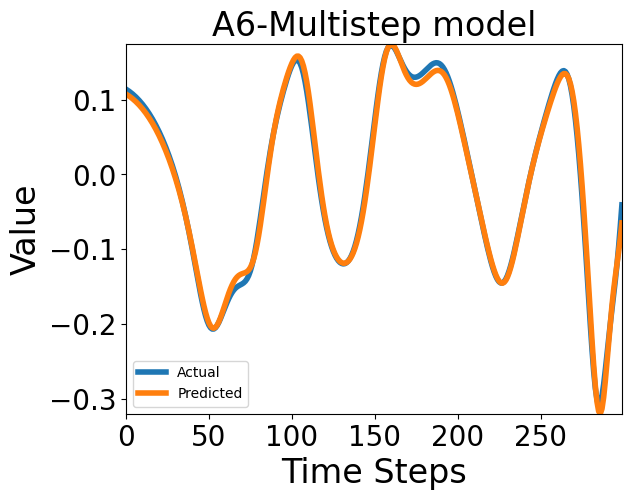

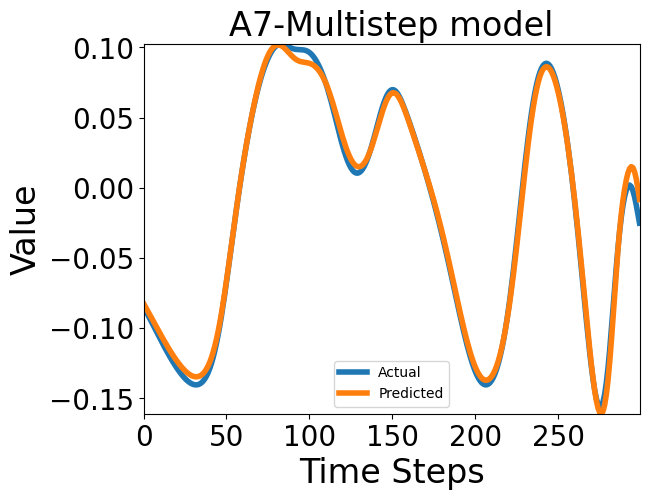

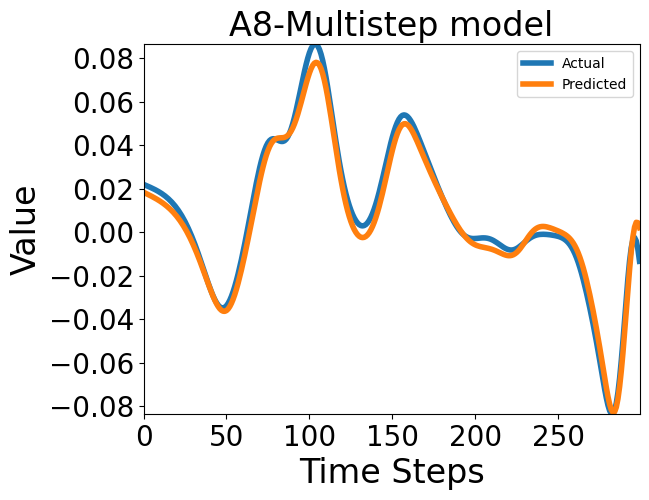

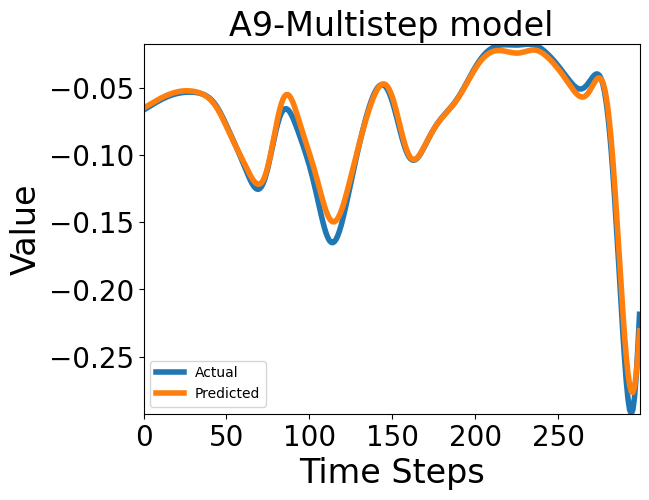

In [ ]:
for j in range(9):
    predicted_values = ensemble_prediction[:,j]
    feature_values = []
    for i in range(len(test_generator_nonorm)):
      _,batch_data = test_generator_nonorm[i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Multistep model',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'A{j+1}_multi.png', bbox_inches='tight')
    plt.show()


In [ ]:
test_data=[]
test_generator_=[]
for i in range(10,19):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)
  test_data.append(y_test[-300:])
  window_length=500
  batch_size=32
  num_features=9
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator_.append(test_generator)

for i in range(1,10):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p0{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)
  test_data.append(y_test[-300:])
  window_length=500
  batch_size=32
  num_features=9
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator_.append(test_generator)


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
ensemble_pred=[]
for a in range(18):
  print(f'Evaluation with respect to Test data - {a+1}')
  #Evaluate the predictions
  pred=[]
  for k in range(18):
    pred.append(multistep[k].predict_generator(test_generator_[a]))

    print(f'Evaluation of Multistep Model-{k+1} , MSE : {multistep[k].evaluate_generator(test_generator_[a])[0]}, MAE : {multistep[k].evaluate_generator(test_generator_[a])[1]} ')




  ensemble_prediction=np.mean(pred, axis=0)
  ensemble_pred.append( ensemble_prediction)

  mse = mean_squared_error(test_data[a], ensemble_prediction)
  mae = mean_absolute_error(test_data[a], ensemble_prediction)

  print(f"Ensembled predictions evaluation for TestData-{a+1} - MSE: {mse}, MAE: {mae}")

In [ ]:

for r in range(18):
  print(f'Predictions for Test Data - {r+1}')
  for j in range(9):
    predicted_values = ensemble_pred[r][:,j]
    feature_values = []
    for i in range(len(test_generator_[r])):
      _,batch_data = test_generator_[r][i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Multistep model prediction(Test Data -{r+1})',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'Testdata-{r+1}_A{j+1}_multi.png', bbox_inches='tight')
    plt.show()


###Singlestep ensembled predictions

In [ ]:
#Load models
singlestep=[]
for j in range(1, 19):
  singlestep.append(tf.keras.models.load_model(f'singlestep{j}.h5'))

In [ ]:
#Evaluate the predictions
pred_ss=[]
for k in range(18):
  pred_ss.append(singlestep[k].predict_generator(test_generator_nonorm))
  print(f'Evaluation of Singlestep Model-{k+1} , MSE : {singlestep[k].evaluate_generator(test_generator_nonorm)[0]}, MAE : {singlestep[k].evaluate_generator(test_generator_nonorm)[1]} ')


test1=y_test_nonorm[-300:]


ensemble_prediction_ss = np.mean(pred_ss, axis=0)
from sklearn.metrics import mean_squared_error, mean_absolute_error
mse = mean_squared_error(test1, ensemble_prediction_ss)
mae = mean_absolute_error(test1, ensemble_prediction_ss)

print(f"Ensembled predictions evaluation - MSE: {mse}, MAE: {mae}")

Evaluation of Singlestep Model-1 , MSE : 0.06256868690252304, MAE : 0.19192014634609222 
Evaluation of Singlestep Model-2 , MSE : 0.0036809139419347048, MAE : 0.0441601499915123 
Evaluation of Singlestep Model-3 , MSE : 0.002768435049802065, MAE : 0.04216204211115837 
Evaluation of Singlestep Model-4 , MSE : 0.0031836789567023516, MAE : 0.04512310028076172 
Evaluation of Singlestep Model-5 , MSE : 0.0017529648030176759, MAE : 0.033733662217855453 
Evaluation of Singlestep Model-6 , MSE : 0.005939073394984007, MAE : 0.06054459884762764 
Evaluation of Singlestep Model-7 , MSE : 0.00724213058128953, MAE : 0.0637904703617096 
Evaluation of Singlestep Model-8 , MSE : 0.011175531893968582, MAE : 0.07109615951776505 
Evaluation of Singlestep Model-9 , MSE : 0.022798951715230942, MAE : 0.10930320620536804 
Evaluation of Singlestep Model-10 , MSE : 0.004836475942283869, MAE : 0.05242721736431122 
Evaluation of Singlestep Model-11 , MSE : 0.029701849445700645, MAE : 0.1420610547065735 
Evaluatio

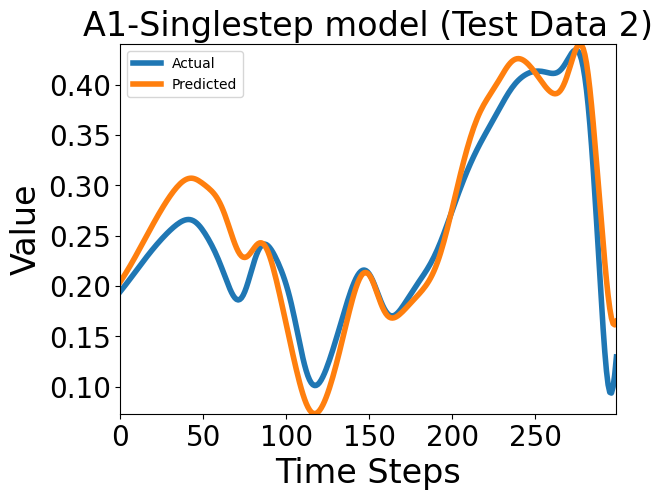

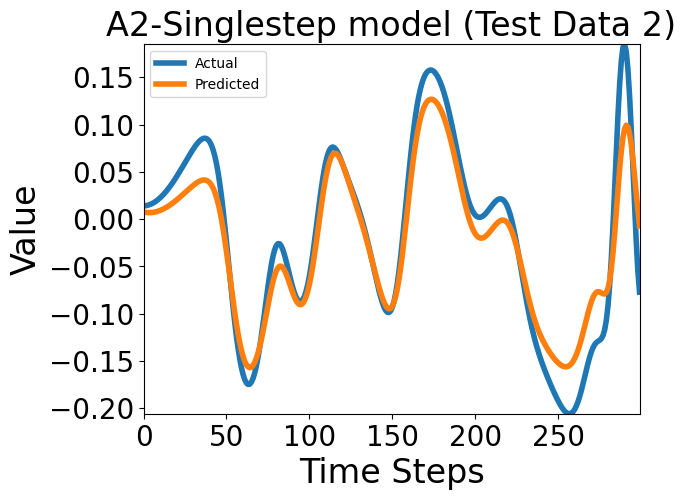

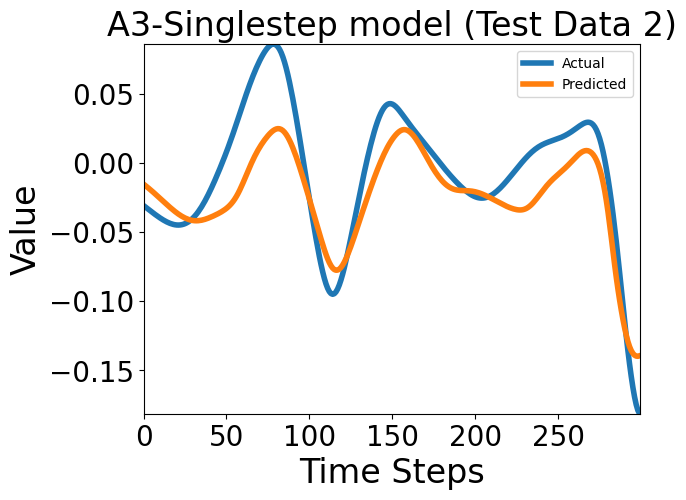

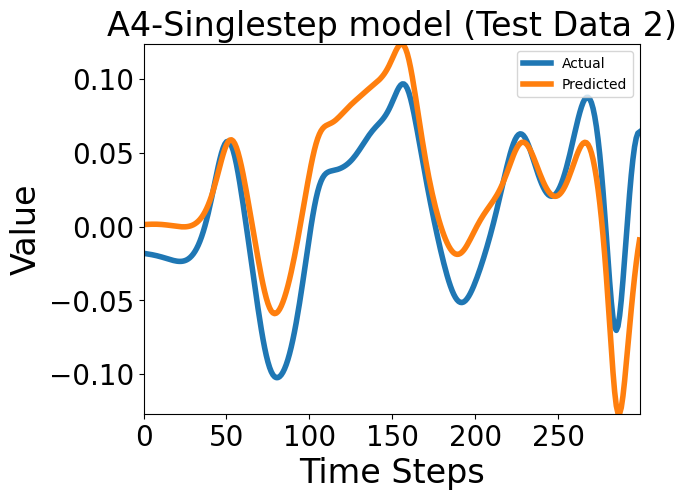

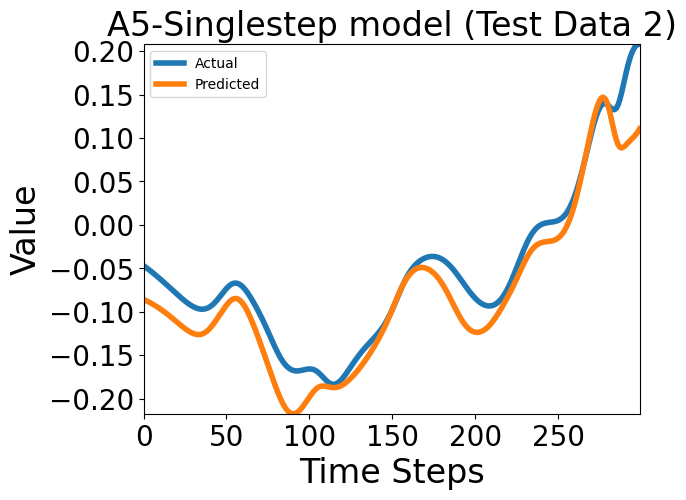

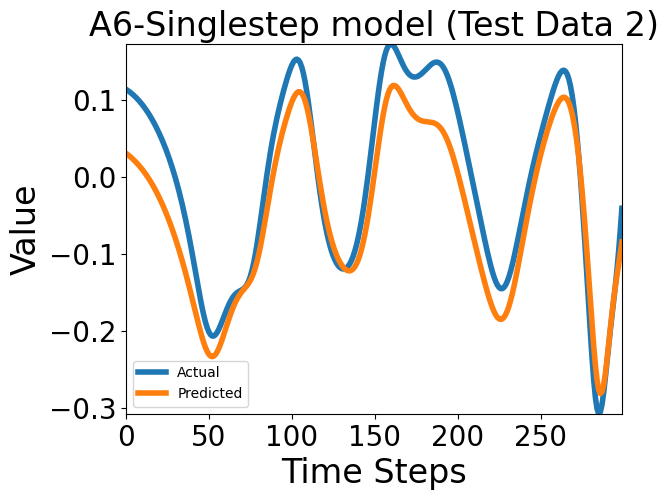

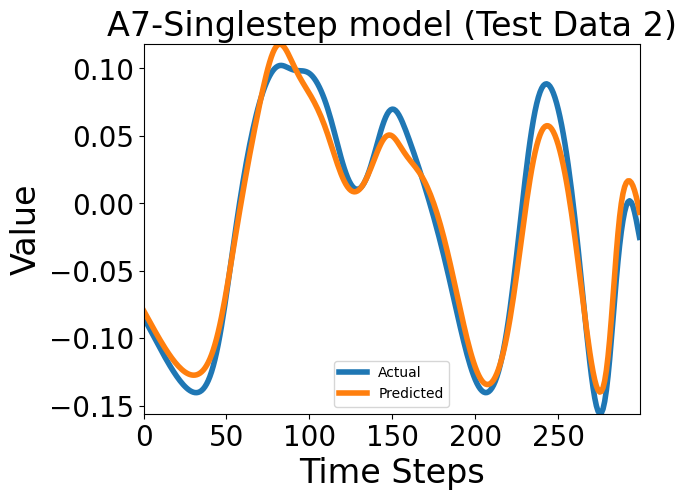

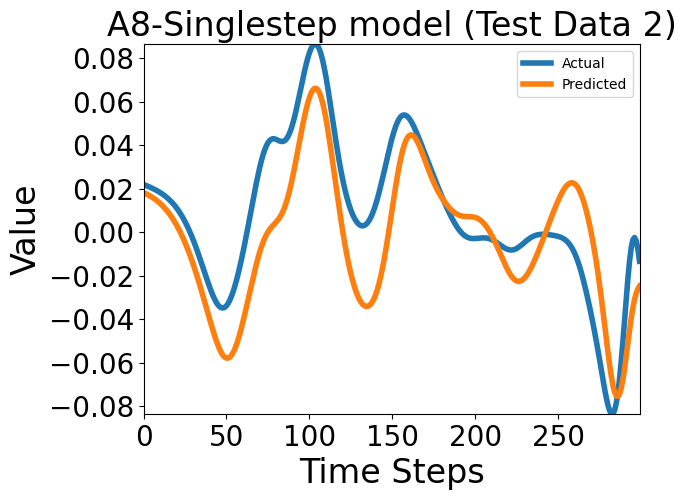

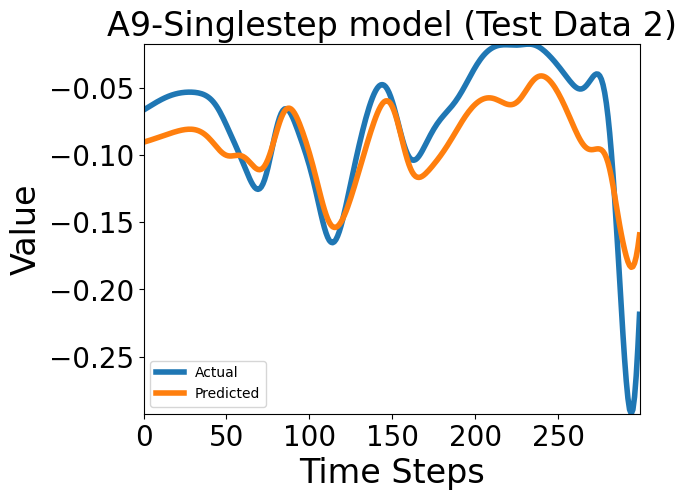

In [ ]:
for j in range(9):
    predicted_values = ensemble_prediction_ss[:,j]
    feature_values = []
    for i in range(len(test_generator_nonorm)):
      _,batch_data = test_generator_nonorm[i]
      feature_values.extend(batch_data[:, j])

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Singlestep model (Test Data 2)',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'A{j+1}_Singlestep.png', bbox_inches='tight')
    plt.show()


In [ ]:
test_data_ss=[]
test_generator_ss=[]
for i in range(10,19):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)
  test_data_ss.append(y_test[-300:])
  window_length=500
  batch_size=32
  num_features=9
  test_generator_s=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator_ss.append(test_generator_s)

for i in range(1,10):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p0{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)
  test_data_ss.append(y_test[-300:])
  window_length=500
  batch_size=32
  num_features=9
  test_generator_s=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator_ss.append(test_generator_s)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
ensemble_pred_ss=[]
for a in range(18):
  print(f'Evaluation with respect to Test data - {a+1}')
  #Evaluate the predictions
  pred_ss=[]
  for k in range(18):
    pred_ss.append(singlestep[k].predict_generator(test_generator_ss[a]))

    print(f'Evaluation of Singlestep Model-{k+1} , MSE : {singlestep[k].evaluate_generator(test_generator_ss[a])[0]}, MAE : {singlestep[k].evaluate_generator(test_generator_ss[a])[1]} ')




  ensemble_prediction_ss=np.mean(pred_ss, axis=0)
  ensemble_pred_ss.append( ensemble_prediction_ss)

  mse = mean_squared_error(test_data_ss[a], ensemble_prediction_ss)
  mae = mean_absolute_error(test_data_ss[a], ensemble_prediction_ss)

  print(f"Ensembled predictions evaluation for TestData-{a+1} - MSE: {mse}, MAE: {mae}")

In [ ]:

for r in range(18):
  print(f'Predictions for Test Data - {r+1}')
  for j in range(9):
    predicted_values = ensemble_pred_ss[r][:,j]
    feature_values = []
    for i in range(len(test_generator_ss[r])):
      _,batch_data = test_generator_ss[r][i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Singlestep model prediction(Test Data -{r+1})',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'Testdata-{r+1}_A{j+1}_Single.png', bbox_inches='tight')
    plt.show()


##GRU Model

In [ ]:
from keras.layers import GRU
model_gru=Sequential()
model_gru.add(GRU(90,input_shape=(window_length,num_features),return_sequences=False))
model_gru.add(Dense(9))

In [ ]:
model_gru.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 90)                27270     
                                                                 
 dense_1 (Dense)             (None, 9)                 819       
                                                                 
Total params: 28089 (109.72 KB)
Trainable params: 28089 (109.72 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


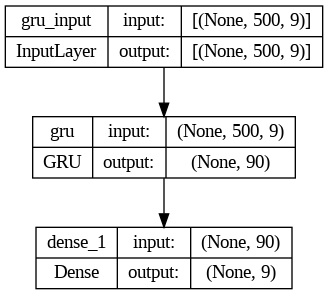

In [ ]:
tf.keras.utils.plot_model(model_gru, show_shapes=True)

In [ ]:
for i in range(1,10):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p0{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
  print(df_.head())

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=32
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model_gru.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model_gru.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model_gru.save(f'multistep{i}_gru.h5')

#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_multi{i}_gru.png', bbox_inches='tight')
  plt.show()


In [ ]:
for i in range(10,19):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
  print(df_.head())

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=32
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model_gru.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model_gru.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model_gru.save(f'multistep{i}_gru.h5')

#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_multi{i}_gru.png', bbox_inches='tight')
  plt.show()


In [ ]:
for i in range(8,10):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p0{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
  print(df_.head())

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=1
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model_gru.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model_gru.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model_gru.save(f'Singlestep{i}_gru.h5')

#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_Single{i}_gru.png', bbox_inches='tight')
  plt.show()


In [ ]:
for i in range(10,19):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
  print(df_.head())

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=1
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model_gru.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model_gru.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model_gru.save(f'singlestep{i}_gru.h5')

#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_single{i}_gru.png', bbox_inches='tight')
  plt.show()


In [ ]:
for i in range(18,19):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
  print(df_.head())

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=1
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model_gru.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model_gru.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model_gru.save(f'singlestep{i}_gru.h5')

#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_single{i}_gru.png', bbox_inches='tight')
  plt.show()


####Multistep GRU model predictions


In [ ]:
#Load models
multistep_gru=[]
for j in range(1, 19):
  multistep_gru.append(tf.keras.models.load_model(f'multistep{j}_gru.h5'))

In [ ]:
#Evaluate the predictions
pred_gru=[]
for k in range(18):
  pred_gru.append(multistep_gru[k].predict_generator(test_generator_nonorm))
  print(f'Evaluation of Multistep Model-{k+1} , MSE : {multistep_gru[k].evaluate_generator(test_generator_nonorm)[0]}, MAE : {multistep_gru[k].evaluate_generator(test_generator_nonorm)[1]} ')


test1=y_test_nonorm[-300:]


ensemble_prediction_gru = np.mean(pred_gru, axis=0)
from sklearn.metrics import mean_squared_error, mean_absolute_error
mse = mean_squared_error(test1, ensemble_prediction_gru)
mae = mean_absolute_error(test1, ensemble_prediction_gru)

print(f"Ensembled predictions evaluation - MSE: {mse}, MAE: {mae}")

Evaluation of Multistep Model-1 , MSE : 0.0014047170989215374, MAE : 0.02884216047823429 
Evaluation of Multistep Model-2 , MSE : 0.00033592936233617365, MAE : 0.013827886432409286 
Evaluation of Multistep Model-3 , MSE : 7.569884473923594e-05, MAE : 0.006546894554048777 
Evaluation of Multistep Model-4 , MSE : 6.516319990623742e-05, MAE : 0.00634551839902997 
Evaluation of Multistep Model-5 , MSE : 7.802170875947922e-05, MAE : 0.007297059521079063 
Evaluation of Multistep Model-6 , MSE : 0.00014890177408233285, MAE : 0.00911196693778038 
Evaluation of Multistep Model-7 , MSE : 7.552832539658993e-05, MAE : 0.006131583359092474 
Evaluation of Multistep Model-8 , MSE : 7.823409396223724e-05, MAE : 0.007624971214681864 
Evaluation of Multistep Model-9 , MSE : 9.736292849993333e-05, MAE : 0.0075011104345321655 
Evaluation of Multistep Model-10 , MSE : 0.0028854107949882746, MAE : 0.04062243551015854 
Evaluation of Multistep Model-11 , MSE : 8.199783769669011e-05, MAE : 0.00670585548505187 

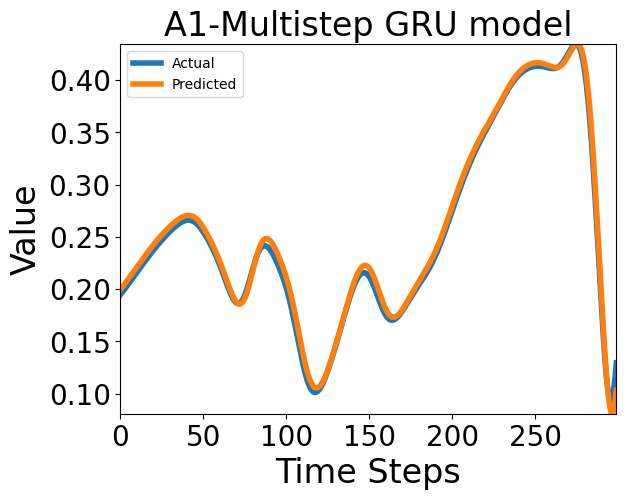

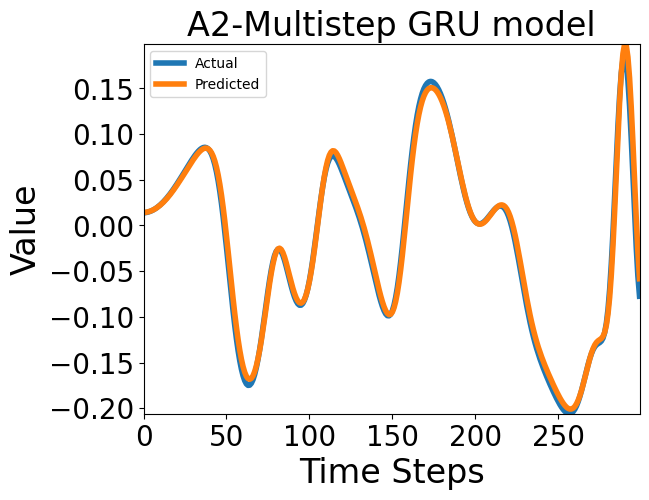

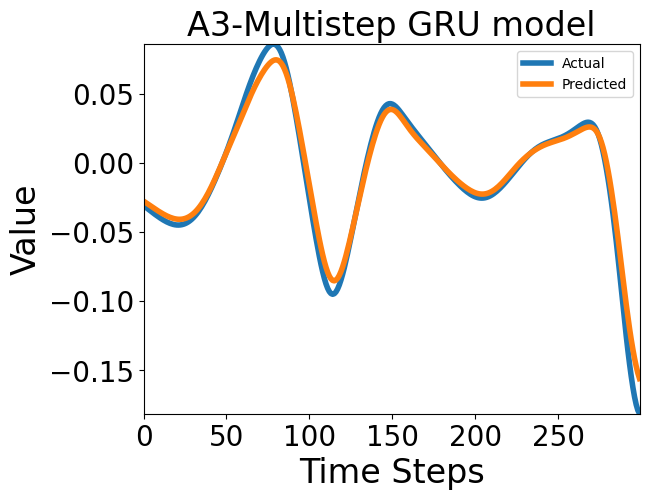

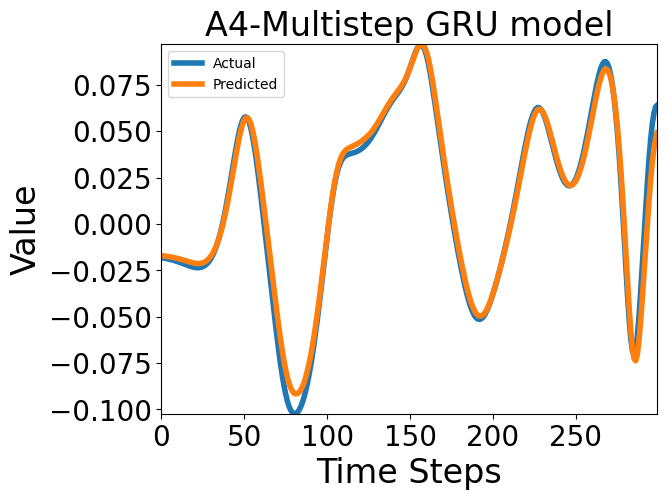

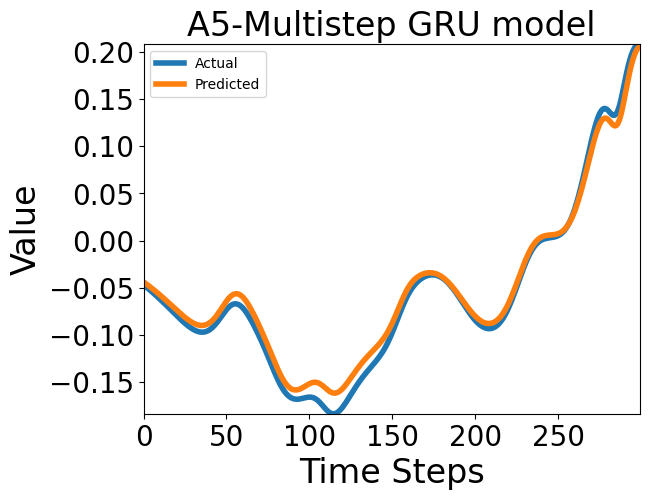

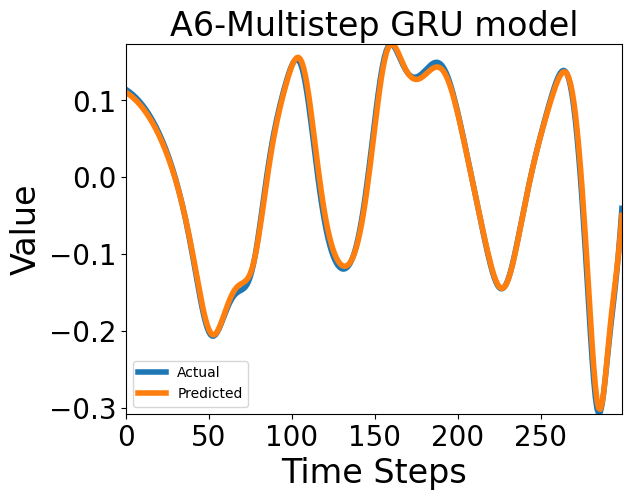

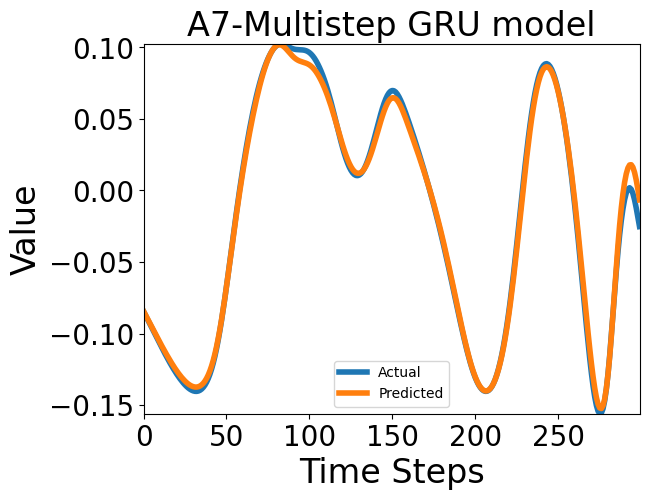

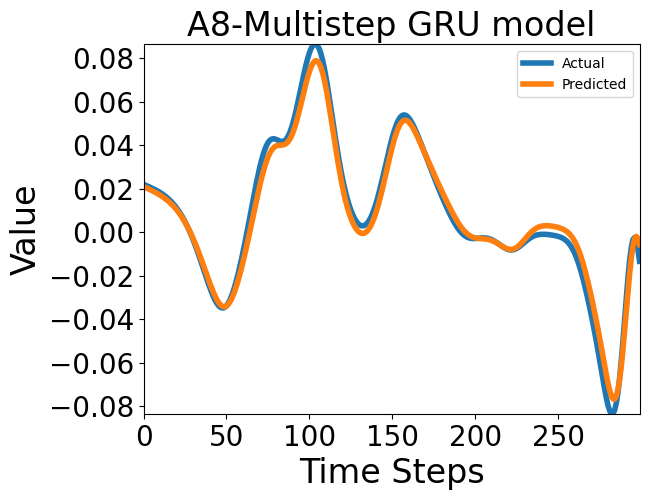

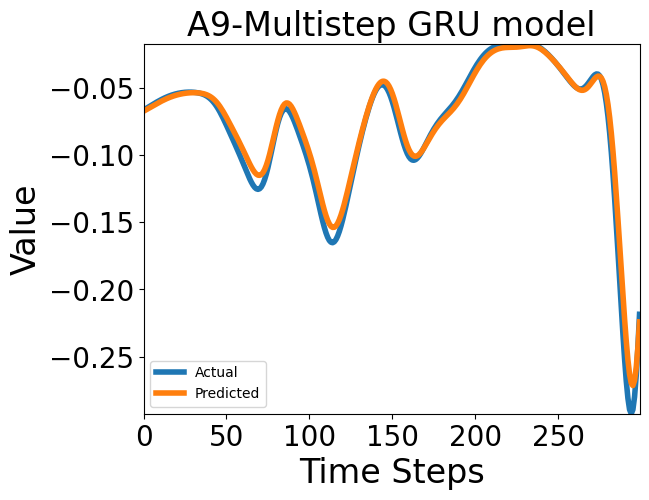

In [ ]:
for j in range(9):
    predicted_values = ensemble_prediction_gru[:,j]
    feature_values = []
    for i in range(len(test_generator_nonorm)):
      _,batch_data = test_generator_nonorm[i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Multistep GRU model',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'A{j+1}_multi_gru.png', bbox_inches='tight')
    plt.show()

###Singlestep GRU model ppredictions

In [ ]:
#Load models
singlestep_gru=[]
for j in range(1, 19):
  singlestep_gru.append(tf.keras.models.load_model(f'singlestep{j}_gru.h5'))

In [ ]:
#Evaluate the predictions
pred_gru_ss=[]
for k in range(18):
  pred_gru_ss.append(singlestep_gru[k].predict_generator(test_generator_nonorm))
  print(f'Evaluation of Singlestep Model-{k+1} , MSE : {singlestep_gru[k].evaluate_generator(test_generator_nonorm)[0]}, MAE : {singlestep_gru[k].evaluate_generator(test_generator_nonorm)[1]} ')


test1=y_test_nonorm[-300:]


ensemble_prediction_gru_ss = np.mean(pred_gru_ss, axis=0)
from sklearn.metrics import mean_squared_error, mean_absolute_error
mse = mean_squared_error(test1, ensemble_prediction_gru_ss)
mae = mean_absolute_error(test1, ensemble_prediction_gru_ss)

print(f"Ensembled predictions evaluation - MSE: {mse}, MAE: {mae}")

Evaluation of Singlestep Model-1 , MSE : 0.032330941408872604, MAE : 0.1352410763502121 
Evaluation of Singlestep Model-2 , MSE : 0.0144509207457304, MAE : 0.09433989971876144 
Evaluation of Singlestep Model-3 , MSE : 0.07114703953266144, MAE : 0.2135210484266281 
Evaluation of Singlestep Model-4 , MSE : 0.027675556018948555, MAE : 0.12588606774806976 
Evaluation of Singlestep Model-5 , MSE : 0.02020770125091076, MAE : 0.1134674996137619 
Evaluation of Singlestep Model-6 , MSE : 0.07612594962120056, MAE : 0.23077619075775146 
Evaluation of Singlestep Model-7 , MSE : 0.15074798464775085, MAE : 0.3272154629230499 
Evaluation of Singlestep Model-8 , MSE : 0.014275487512350082, MAE : 0.09631726890802383 
Evaluation of Singlestep Model-9 , MSE : 0.021324271336197853, MAE : 0.11142097413539886 
Evaluation of Singlestep Model-10 , MSE : 0.01257865410298109, MAE : 0.08619505167007446 
Evaluation of Singlestep Model-11 , MSE : 0.04347820207476616, MAE : 0.14243152737617493 
Evaluation of Single

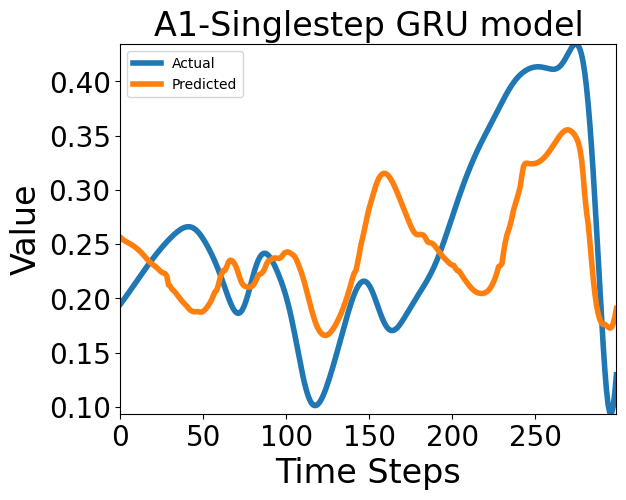

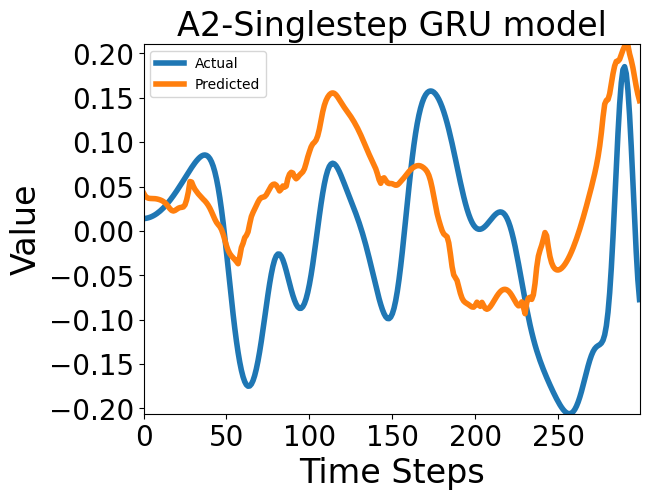

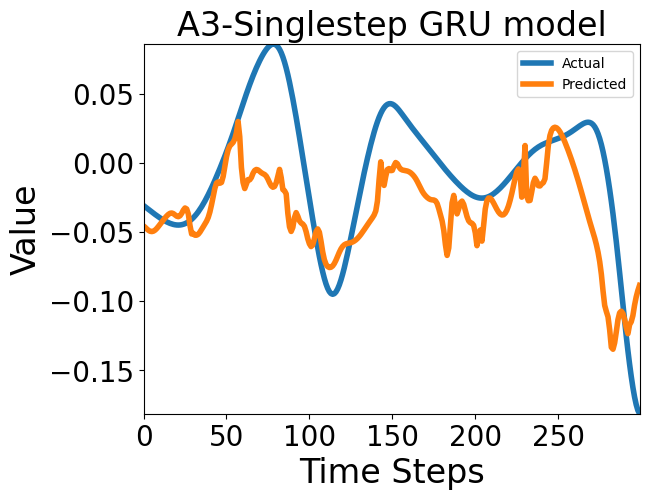

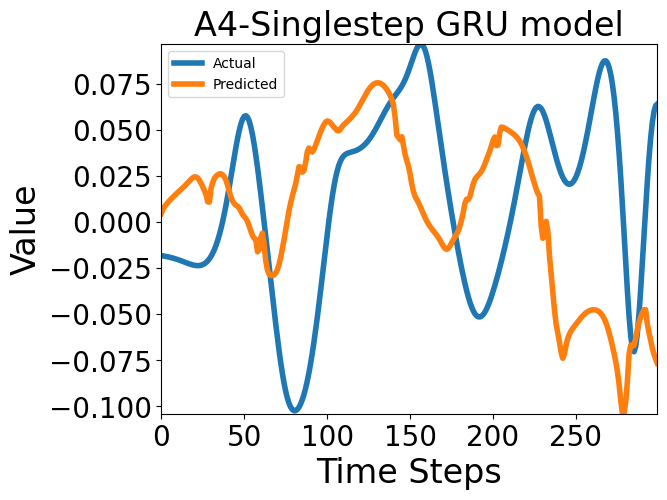

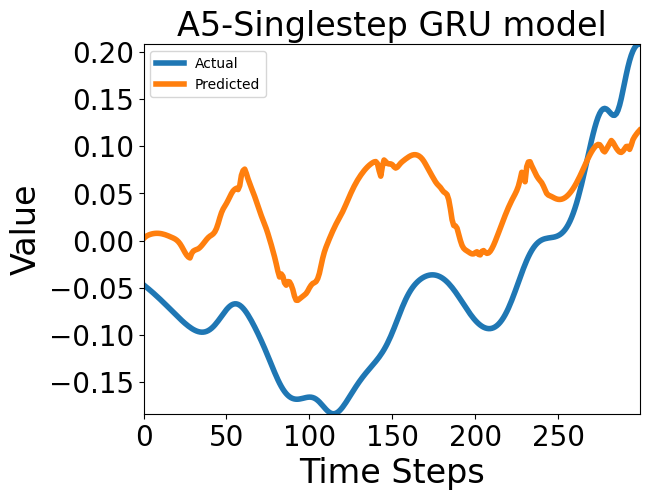

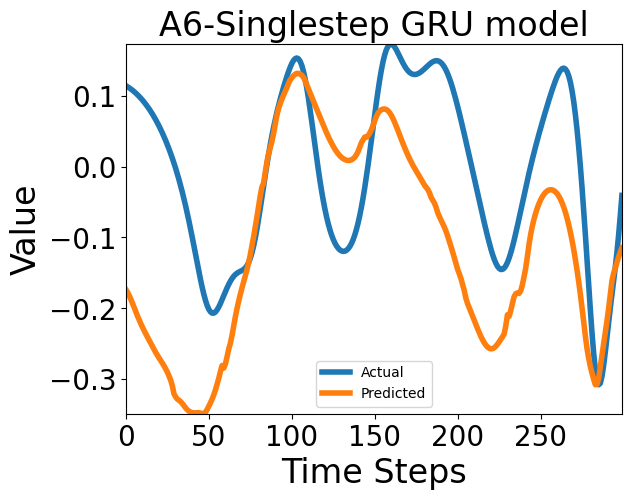

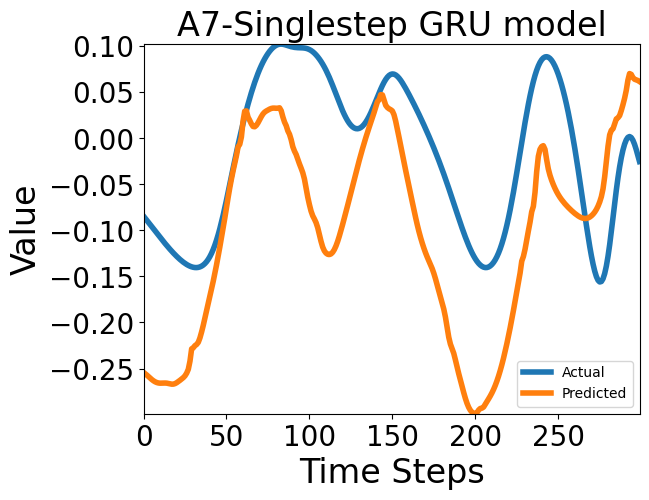

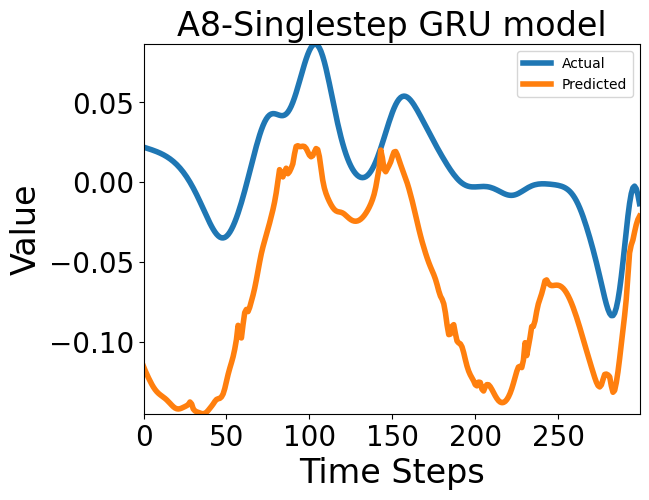

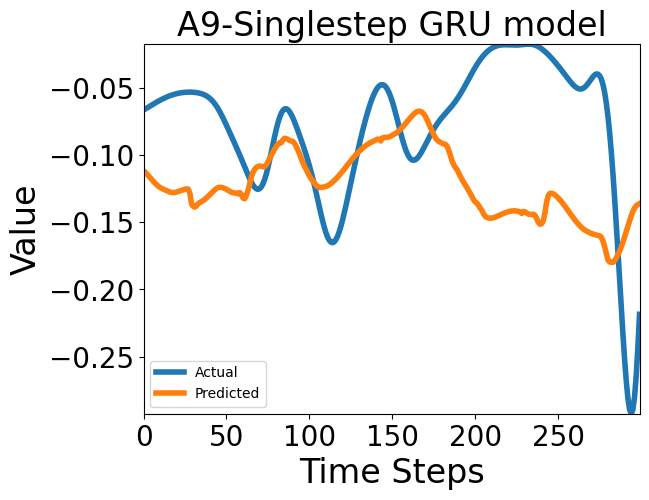

In [ ]:
for j in range(9):
    predicted_values = ensemble_prediction_gru_ss[:,j]
    feature_values = []
    for i in range(len(test_generator_nonorm)):
      _,batch_data = test_generator_nonorm[i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Singlestep GRU model',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'A{j+1}_single_gru.png', bbox_inches='tight')
    plt.show()

In [ ]:
test_data_ss=[]
test_generator_ss=[]
for i in range(1,10):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p0{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)
  test_data_ss.append(y_test[-300:])
  window_length=500
  batch_size=32
  num_features=9
  test_generator_s=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator_ss.append(test_generator_s)
for i in range(10,19):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)
  test_data_ss.append(y_test[-300:])
  window_length=500
  batch_size=32
  num_features=9
  test_generator_s=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator_ss.append(test_generator_s)


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
ensemble_pred_ss=[]
for a in range(18):
  print(f'Evaluation with respect to Test data - {a+1}')
  #Evaluate the predictions
  pred_ss=[]
  for k in range(18):
    pred_ss.append(singlestep_gru[k].predict_generator(test_generator_ss[a]))

    print(f'Evaluation of Singlestep GRU Model-{k+1} , MSE : {singlestep_gru[k].evaluate_generator(test_generator_ss[a])[0]}, MAE : {singlestep_gru[k].evaluate_generator(test_generator_ss[a])[1]} ')




  ensemble_prediction_ss=np.mean(pred_ss, axis=0)
  ensemble_pred_ss.append( ensemble_prediction_ss)

  mse = mean_squared_error(test_data_ss[a], ensemble_prediction_ss)
  mae = mean_absolute_error(test_data_ss[a], ensemble_prediction_ss)

  print(f"Ensembled predictions evaluation for TestData-{a+1} - MSE: {mse}, MAE: {mae}")

In [ ]:

for r in range(18):
  print(f'Predictions for Test Data - {r+1}')
  for j in range(9):
    predicted_values = ensemble_pred_ss[r][:,j]
    feature_values = []
    for i in range(len(test_generator_ss[r])):
      _,batch_data = test_generator_ss[r][i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Singlestep model prediction(Test Data -{r+1})',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'Testdata-{r+1}_A{j+1}_Single.png', bbox_inches='tight')
    plt.show()

##Multistep model training for 100 datasets


In [ ]:
for i in range(0,100):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
  #rint(df_.head())



  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=32
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model.save(f'multistep{i}.h5')

#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_multi{i}.png', bbox_inches='tight')
  plt.show()


In [ ]:
multistep_LSTM=[]
for j in range(0, 100):
  multistep_LSTM.append(tf.keras.models.load_model(f'/content/LSTM_models/multistep{j}.h5'))

In [ ]:
test_data=[]
test_generator_=[]
for i in range(100):
  df_=pd.read_csv(f"/content/100-Datasets/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)
  test_data.append(y_test[-300:])
  window_length=500
  batch_size=32
  num_features=9
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator_.append(test_generator)



###100 Multistep models ensembled predictions

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
ensemble_pred=[]
for a in range(2,3):
  print(f'Evaluation with respect to Test data - {a+1}')
  #Evaluate the predictions
  pred=[]
  for k in range(100):
    pred.append(multistep_LSTM[k].predict_generator(test_generator_[a]))

    print(f'Evaluation of Multistep Model-{k+1} , MSE : {multistep_LSTM[k].evaluate_generator(test_generator_[a])[0]}, MAE : {multistep_LSTM[k].evaluate_generator(test_generator_[a])[1]} ')




  ensemble_prediction=np.mean(pred, axis=0)
  ensemble_pred.append( ensemble_prediction)

  mse = mean_squared_error(test_data[a], ensemble_prediction)
  mae = mean_absolute_error(test_data[a], ensemble_prediction)

  print(f"Ensembled predictions evaluation for TestData-{a+1} - MSE: {mse}, MAE: {mae}")

Evaluation with respect to Test data - 3
Evaluation of Multistep Model-1 , MSE : 5.8313715271651745e-05, MAE : 0.005828379187732935 
Evaluation of Multistep Model-2 , MSE : 8.916006481740624e-05, MAE : 0.007201746106147766 
Evaluation of Multistep Model-3 , MSE : 0.00017278724408242851, MAE : 0.010692845098674297 
Evaluation of Multistep Model-4 , MSE : 4.0289211028721184e-05, MAE : 0.004726454149931669 
Evaluation of Multistep Model-5 , MSE : 5.372578380047344e-05, MAE : 0.005060521885752678 
Evaluation of Multistep Model-6 , MSE : 3.142423156532459e-05, MAE : 0.004138553515076637 
Evaluation of Multistep Model-7 , MSE : 0.00013882578059565276, MAE : 0.009026397950947285 
Evaluation of Multistep Model-8 , MSE : 3.101826223428361e-05, MAE : 0.004073828924447298 
Evaluation of Multistep Model-9 , MSE : 3.108213786617853e-05, MAE : 0.004440398886799812 
Evaluation of Multistep Model-10 , MSE : 3.8631929783150554e-05, MAE : 0.004658014513552189 
Evaluation of Multistep Model-11 , MSE : 0.

In [ ]:
ensemble_pred

[array([[ 0.12239423,  0.0727891 , -0.09718323, ...,  0.05008422,
          0.03075377, -0.13856313],
        [ 0.12332721,  0.06284375, -0.09818602, ...,  0.05071448,
          0.03221038, -0.13532674],
        [ 0.12514576,  0.05339016, -0.09896225, ...,  0.05103505,
          0.03326239, -0.13140605],
        ...,
        [ 0.2600335 , -0.00836198,  0.0292053 , ...,  0.10485572,
          0.01845415, -0.05551405],
        [ 0.26223695, -0.02303173,  0.03450925, ...,  0.09880656,
          0.01743128, -0.05485492],
        [ 0.26387566, -0.03938334,  0.03962355, ...,  0.09185597,
          0.0155421 , -0.05476891]], dtype=float32)]

Predictions for Test Data - 1


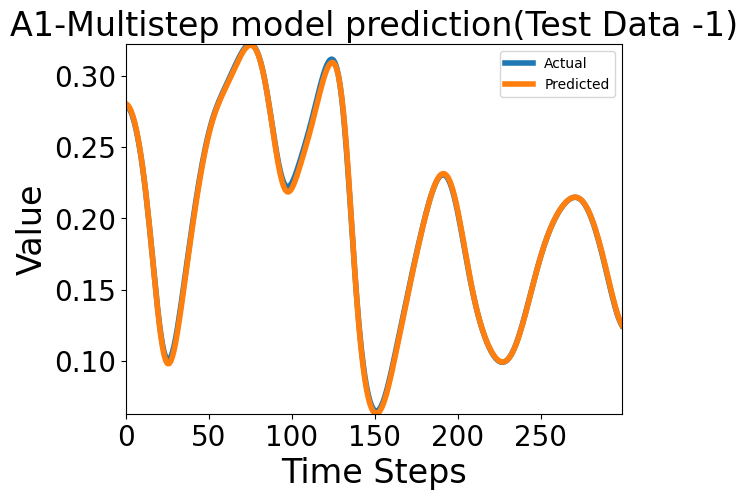

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

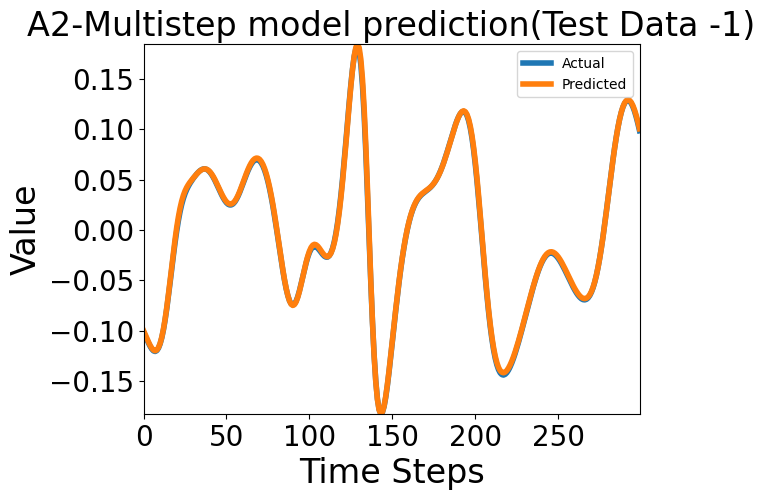

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

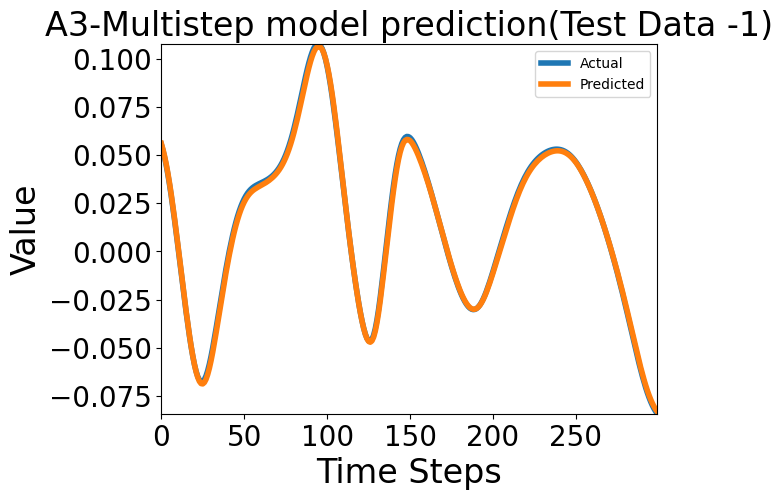

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

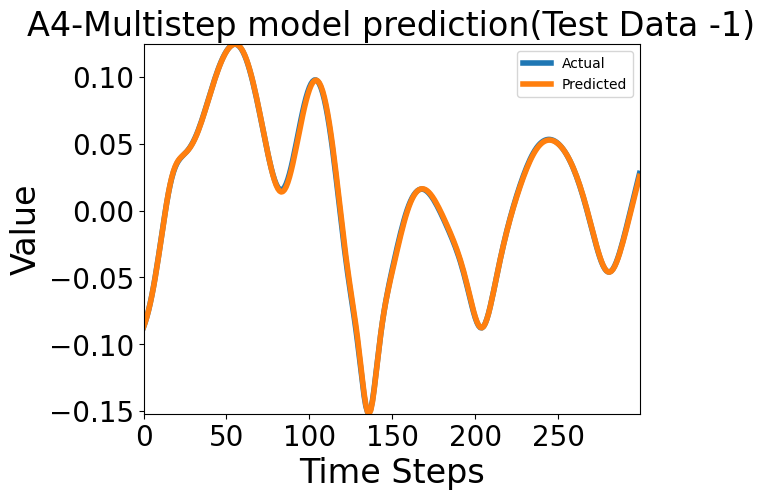

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

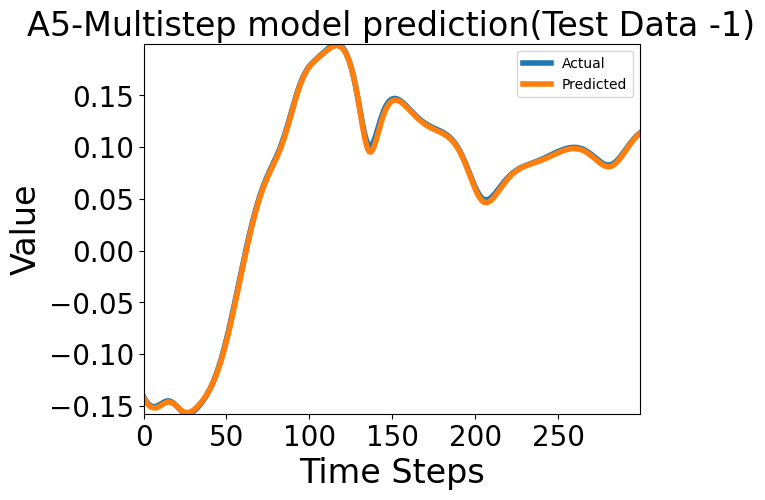

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

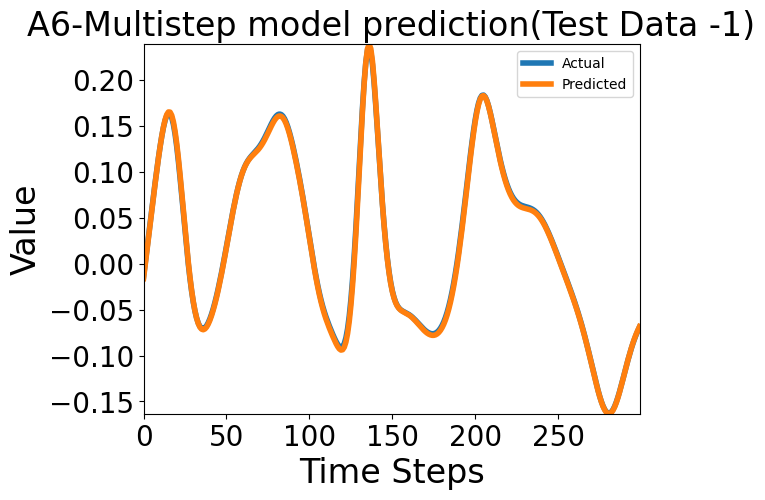

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

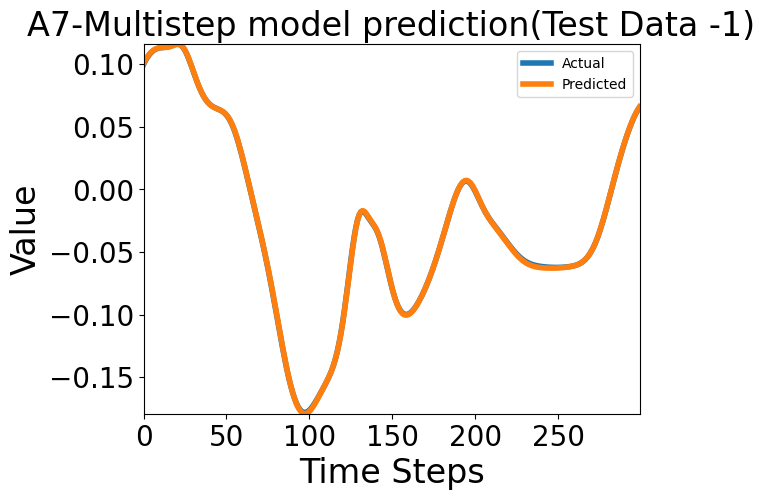

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

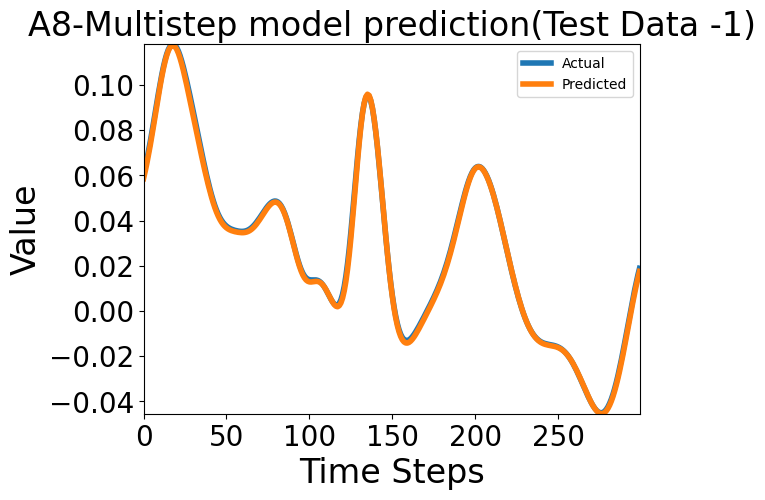

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

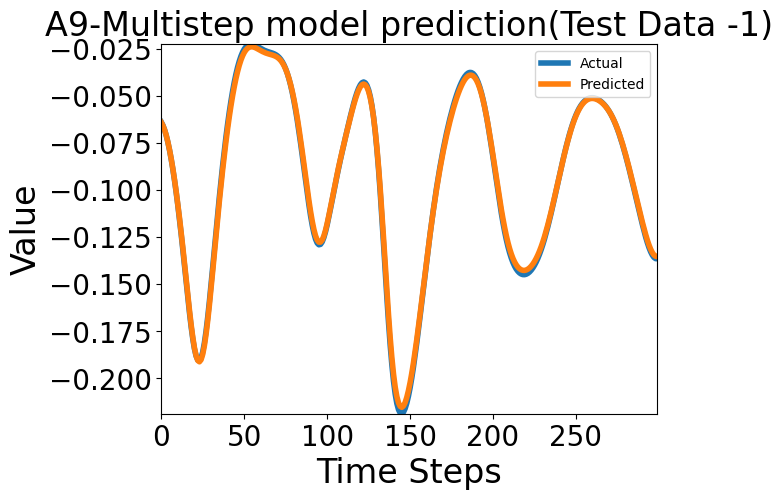

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Predictions for Test Data - 2


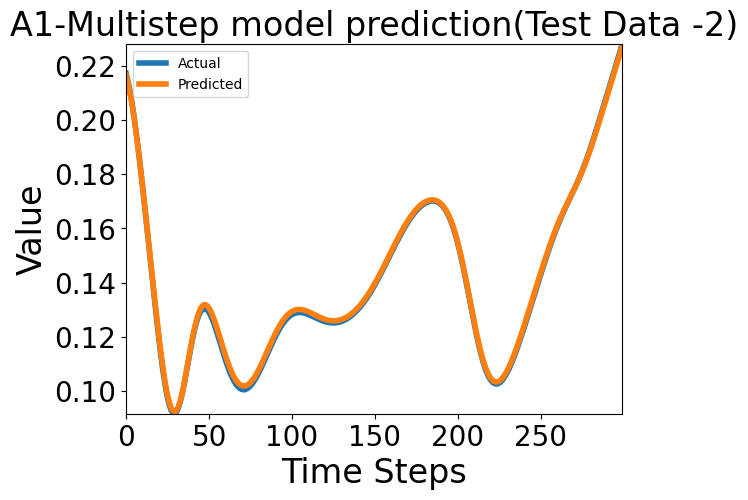

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

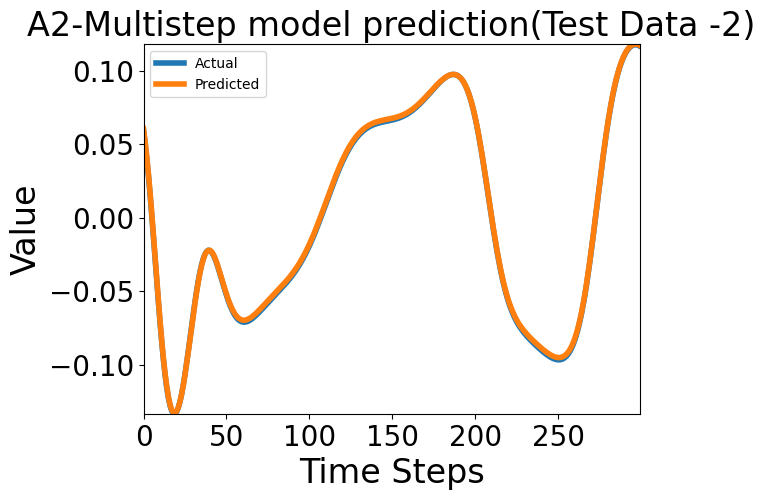

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

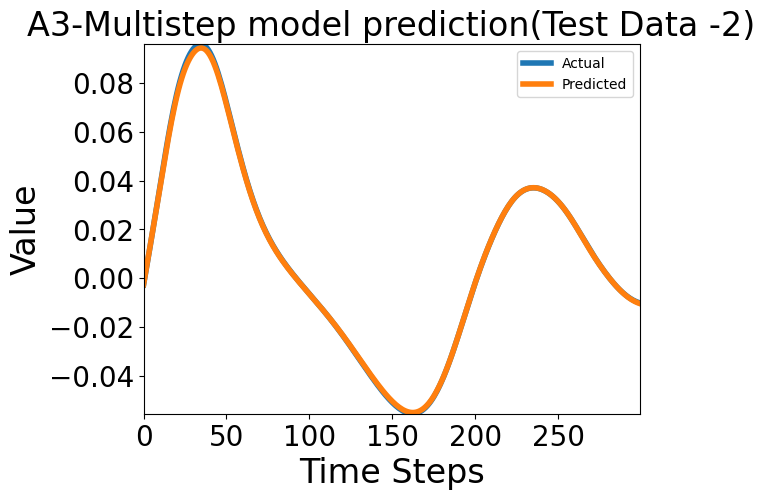

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

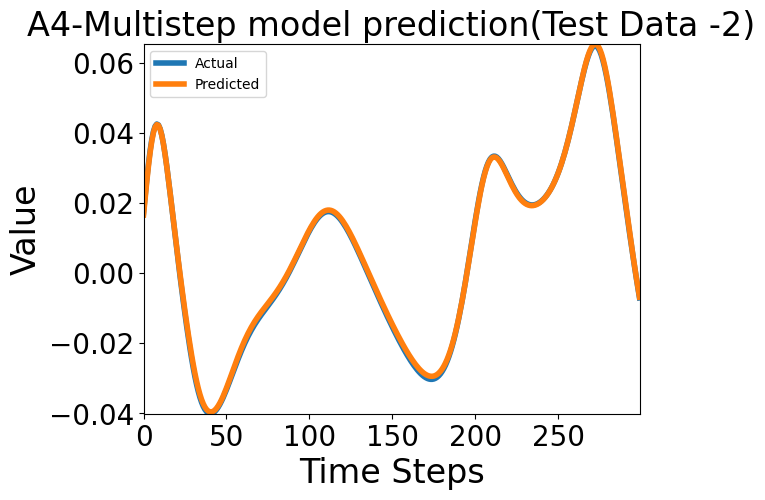

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

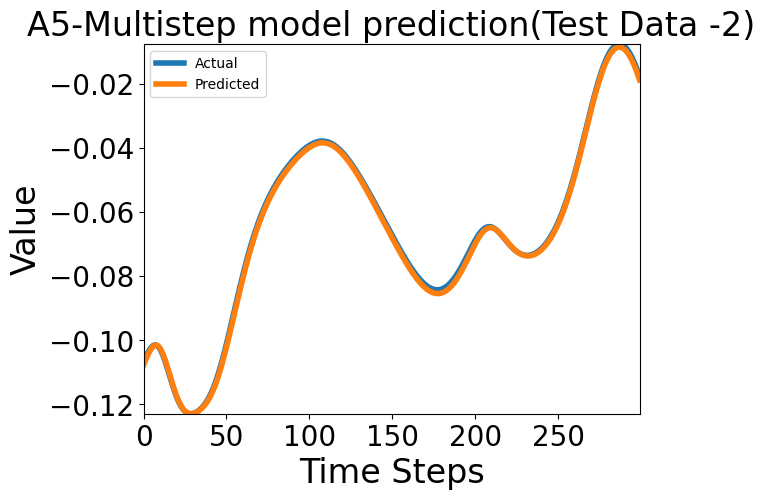

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

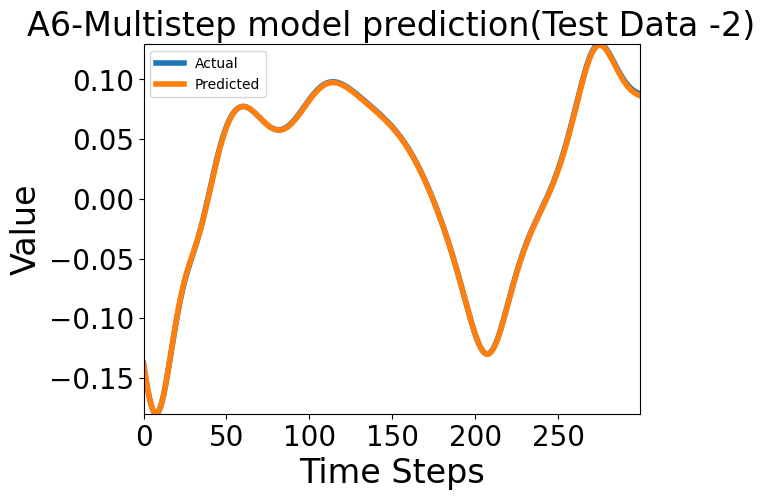

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

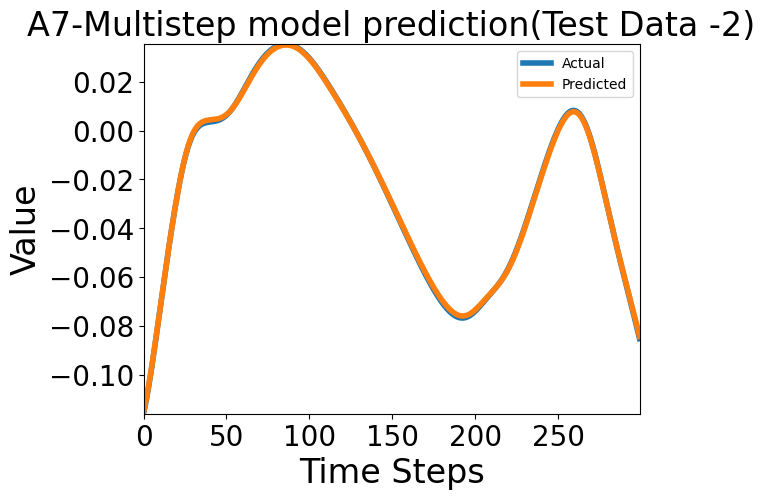

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

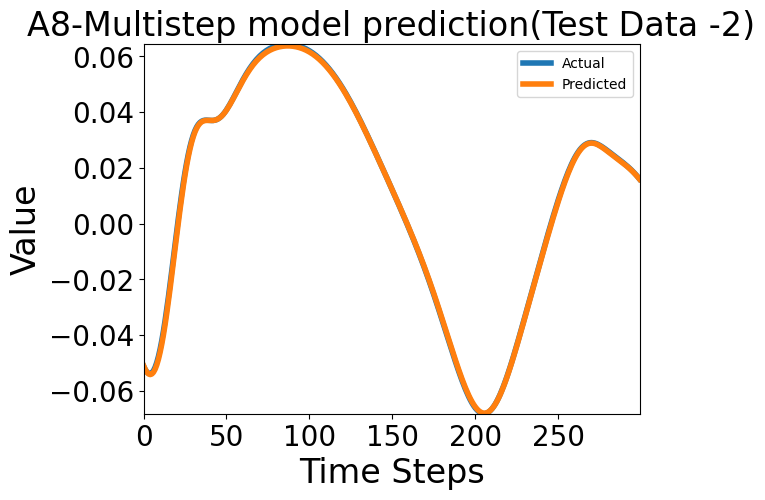

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

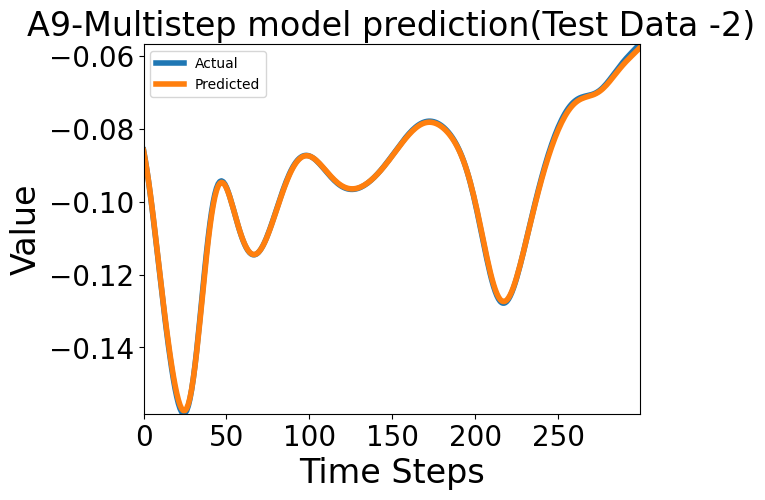

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
for r in range(2):
  print(f'Predictions for Test Data - {r+1}')
  for j in range(9):
    predicted_values = ensemble_pred[r][:,j]
    feature_values = []
    for i in range(len(test_generator_[r])):
      _,batch_data = test_generator_[r][i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Multistep model prediction(Test Data -{r+1})',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'100-ensembledpred_Testdata-{r+1}_A{j+1}_multistep_LSTM.png', bbox_inches='tight')
    plt.show()
    files.download(f'100-ensembledpred_Testdata-{r+1}_A{j+1}_multistep_LSTM.png')

###50 Multistep models ensembled predictions

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
ensemble_pred=[]
for a in range(2):
  print(f'Evaluation with respect to Test data - {a+1}')
  #Evaluate the predictions
  pred=[]
  for k in range(50):
    pred.append(multistep_LSTM[k].predict_generator(test_generator_[a]))

    print(f'Evaluation of Multistep Model-{k+1} , MSE : {multistep_LSTM[k].evaluate_generator(test_generator_[a])[0]}, MAE : {multistep_LSTM[k].evaluate_generator(test_generator_[a])[1]} ')




  ensemble_prediction=np.mean(pred, axis=0)
  ensemble_pred.append( ensemble_prediction)

  mse = mean_squared_error(test_data[a], ensemble_prediction)
  mae = mean_absolute_error(test_data[a], ensemble_prediction)

  print(f"Ensembled predictions evaluation for TestData-{a+1} - MSE: {mse}, MAE: {mae}")

Evaluation with respect to Test data - 1
Evaluation of Multistep Model-1 , MSE : 0.00013336683332454413, MAE : 0.008867725729942322 
Evaluation of Multistep Model-2 , MSE : 0.00014355416351463646, MAE : 0.008645247668027878 
Evaluation of Multistep Model-3 , MSE : 0.00017764650692697614, MAE : 0.010849475860595703 
Evaluation of Multistep Model-4 , MSE : 7.618968811584637e-05, MAE : 0.006196325179189444 
Evaluation of Multistep Model-5 , MSE : 6.38091514701955e-05, MAE : 0.005596511997282505 
Evaluation of Multistep Model-6 , MSE : 2.897340527852066e-05, MAE : 0.003949896432459354 
Evaluation of Multistep Model-7 , MSE : 0.00012513237015809864, MAE : 0.00871327891945839 
Evaluation of Multistep Model-8 , MSE : 1.9589147996157408e-05, MAE : 0.0034313953947275877 
Evaluation of Multistep Model-9 , MSE : 6.84202677803114e-05, MAE : 0.006104758474975824 
Evaluation of Multistep Model-10 , MSE : 3.0056429750402458e-05, MAE : 0.004123812075704336 
Evaluation of Multistep Model-11 , MSE : 0.0

Predictions for Test Data - 1


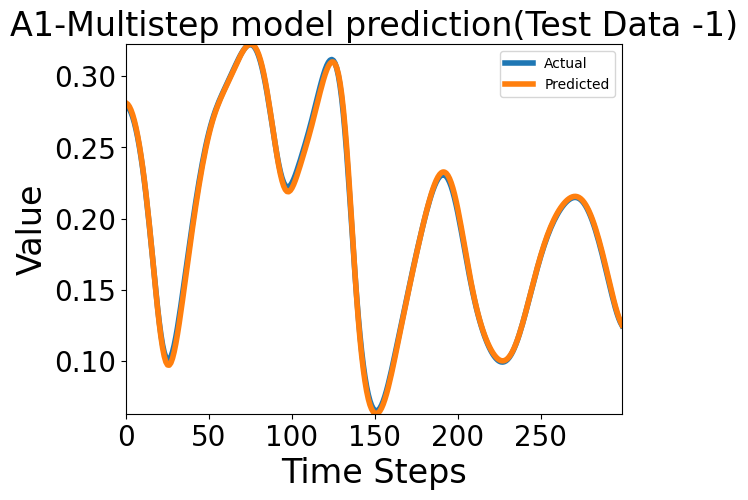

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

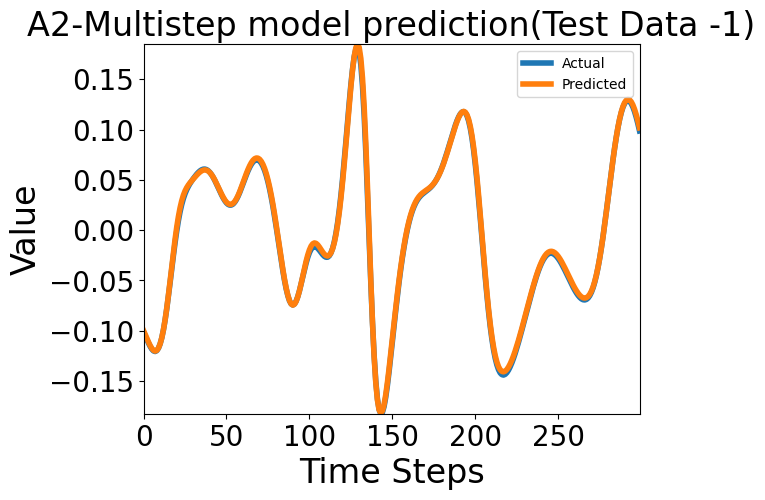

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

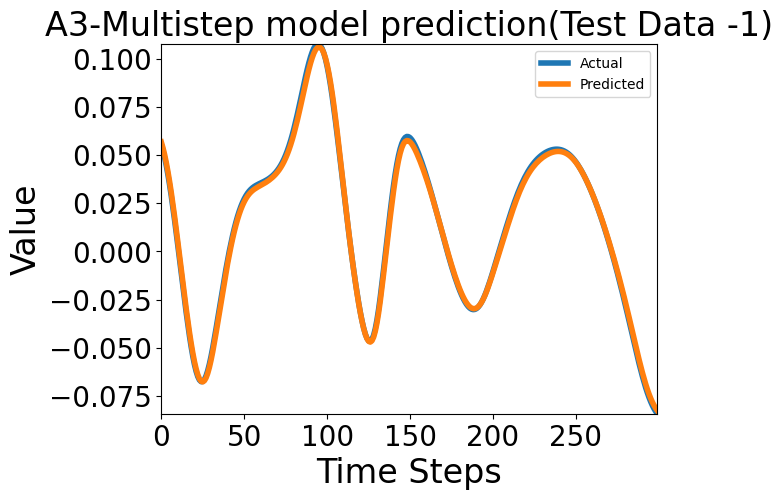

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

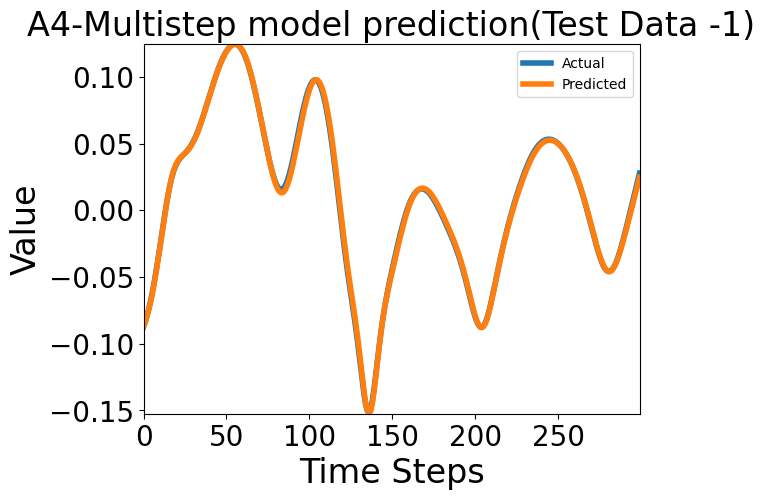

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

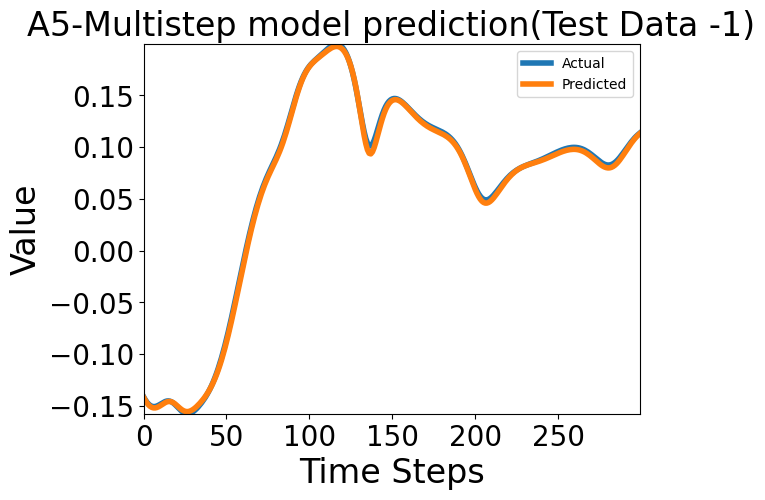

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

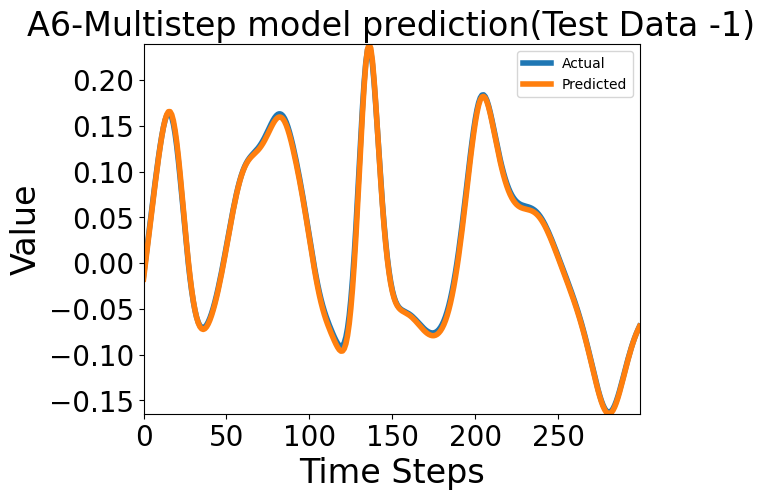

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

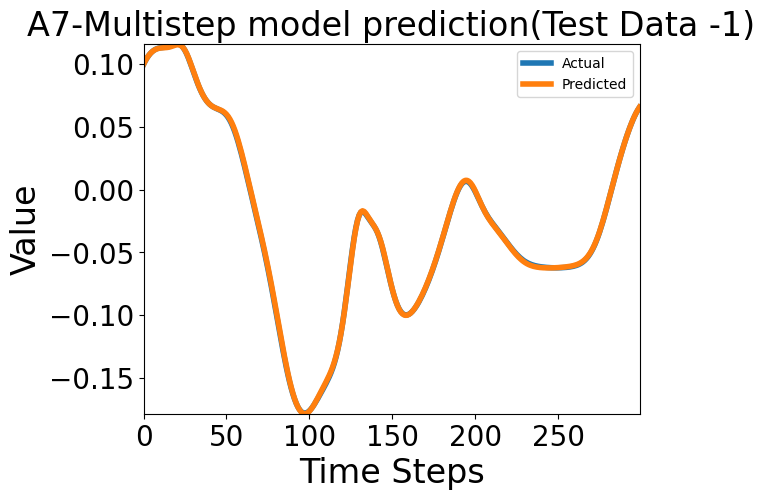

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

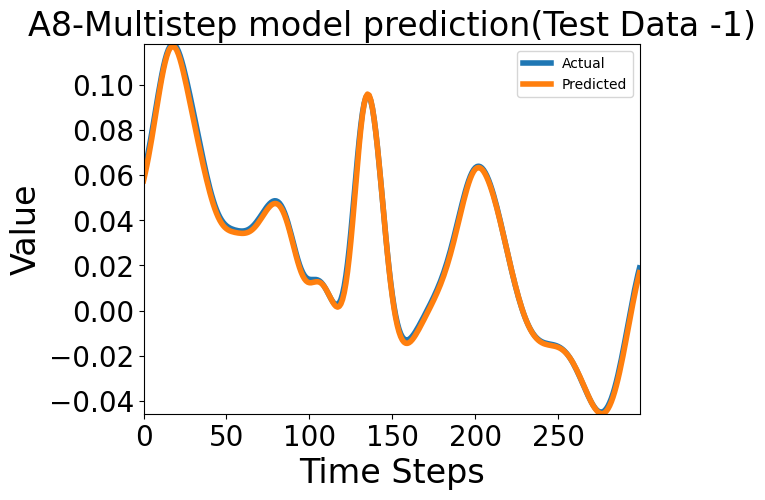

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

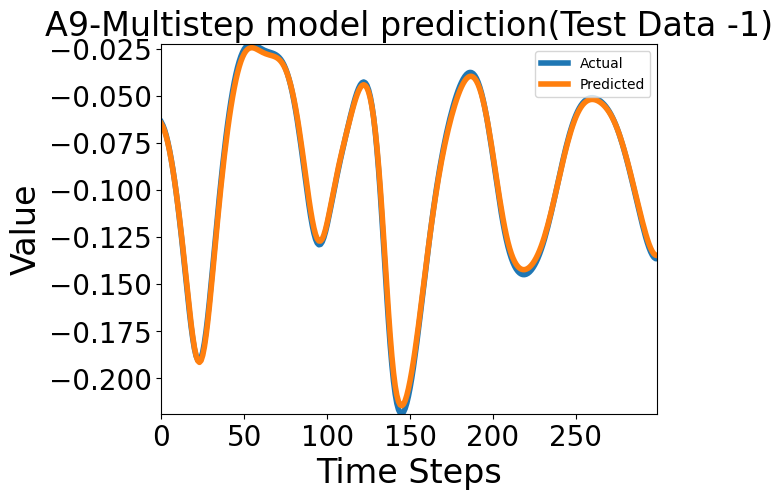

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Predictions for Test Data - 2


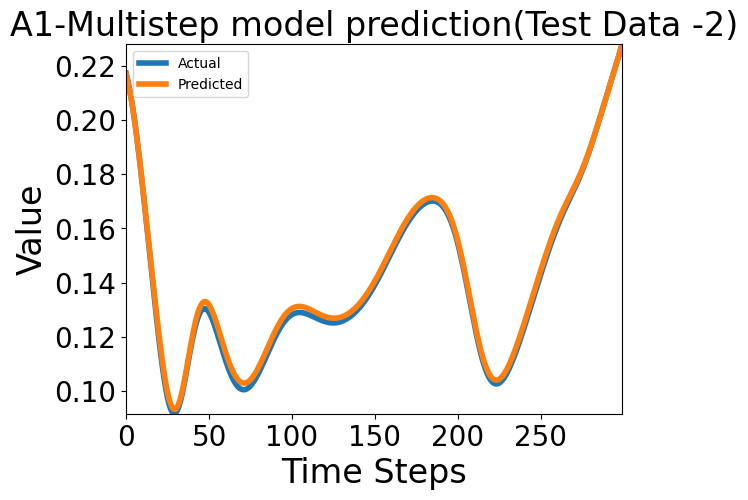

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

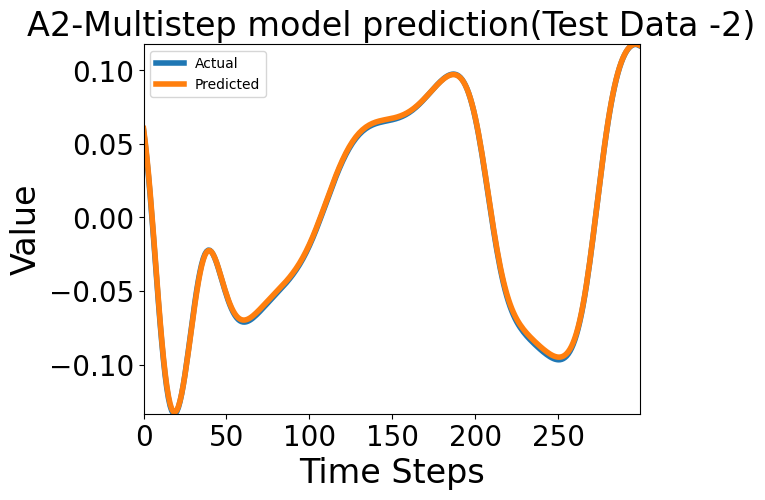

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

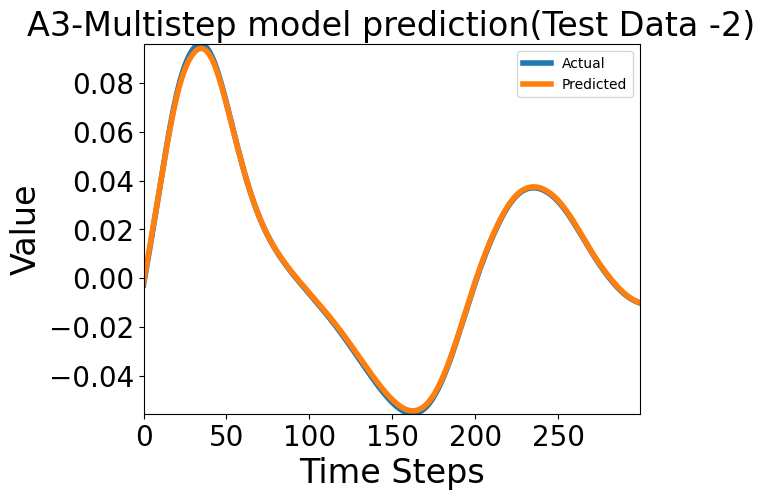

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

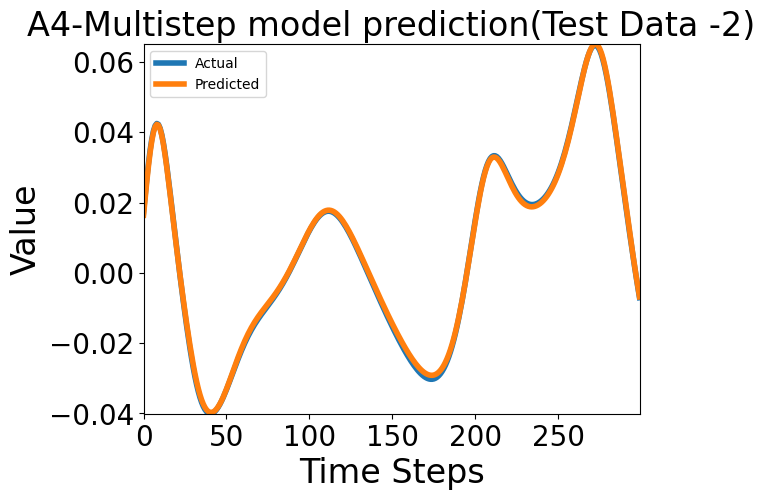

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

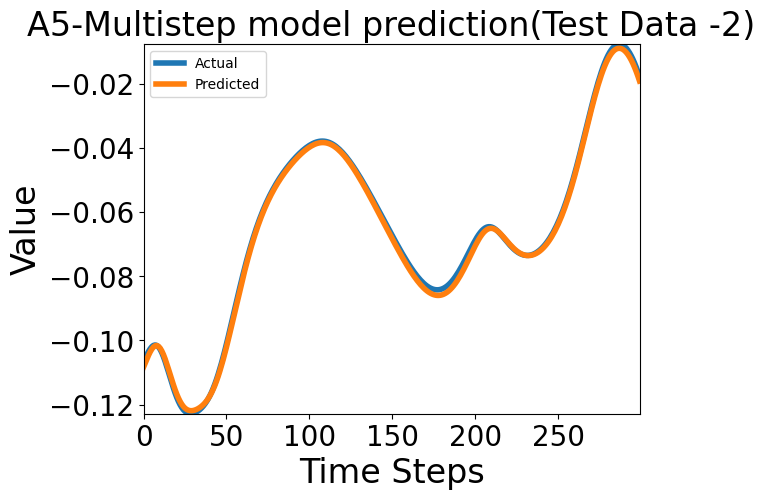

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

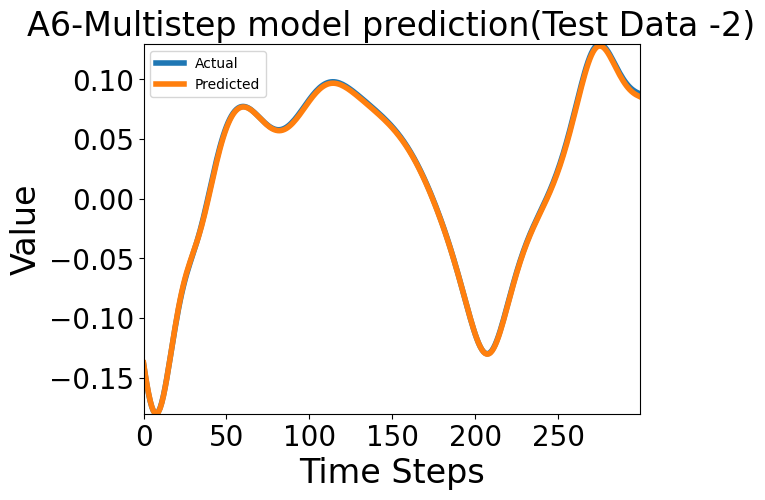

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

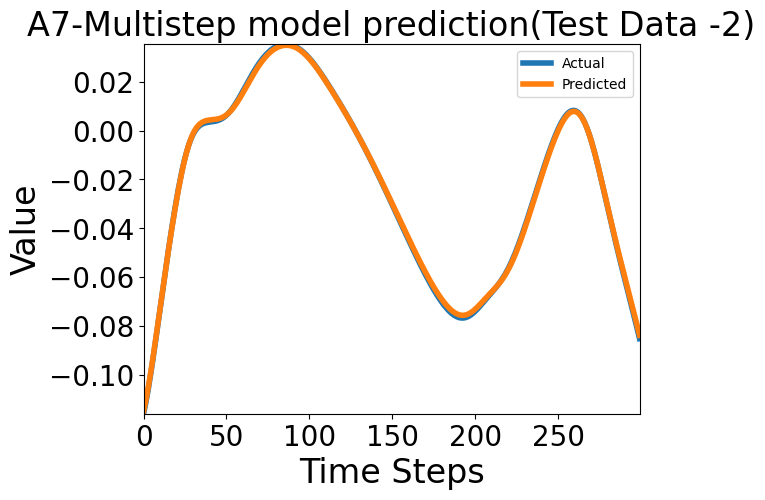

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

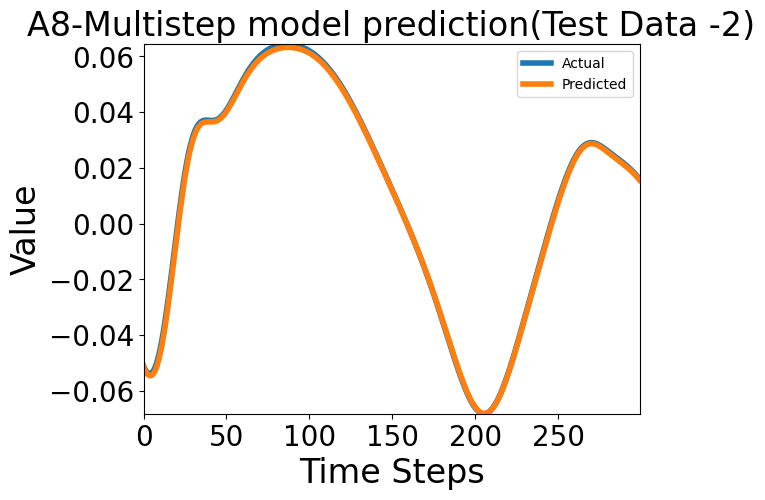

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

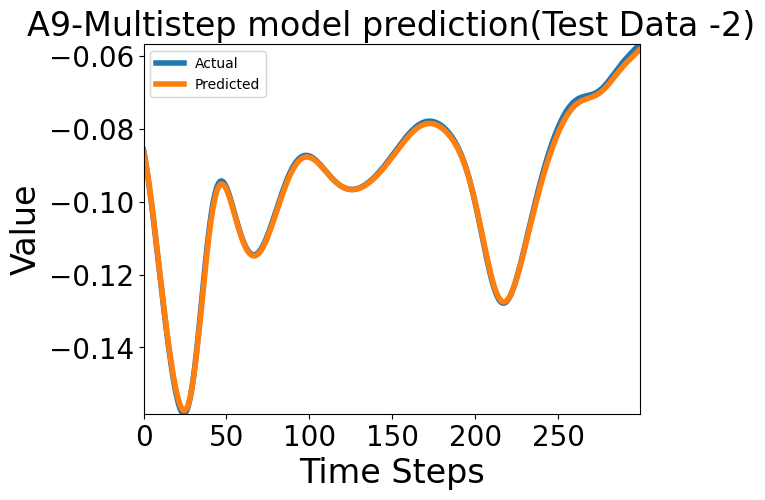

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
for r in range(2):
  print(f'Predictions for Test Data - {r+1}')
  for j in range(9):
    predicted_values = ensemble_pred[r][:,j]
    feature_values = []
    for i in range(len(test_generator_[r])):
      _,batch_data = test_generator_[r][i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Multistep model prediction(Test Data -{r+1})',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'50-ensembledpred_Testdata-{r+1}_A{j+1}_multistep_LSTM.png', bbox_inches='tight')
    plt.show()
    files.download(f'50-ensembledpred_Testdata-{r+1}_A{j+1}_multistep_LSTM.png')

##Single step model training for 100 datasets

In [ ]:
for i in range(53,100):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
 # print(df_.head())

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=1
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model.save(f'singlestep{i}.h5')

#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_single{i}.png', bbox_inches='tight')
  plt.show()


###100 Singlestep models ensembled predictions

In [ ]:
#Load models
singlestep=[]
for j in range(100):
  singlestep.append(tf.keras.models.load_model(f'singlestep{j}.h5'))

In [ ]:
test_data_ss=[]
test_generator_ss=[]
for i in range(100):
  df_=pd.read_csv(f"/content/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)
  test_data_ss.append(y_test[-300:])
  window_length=500
  batch_size=1
  num_features=9
  test_generator_s=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator_ss.append(test_generator_s)


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
ensemble_pred_ss=[]
for a in range(5):
  print(f'Evaluation with respect to Test data - {a+1}')
  #Evaluate the predictions
  pred_ss=[]
  for k in range(100):
    pred_ss.append(singlestep[k].predict_generator(test_generator_ss[a]))

    print(f'Evaluation of Singlestep Model-{k+1} , MSE : {singlestep[k].evaluate_generator(test_generator_ss[a])[0]}, MAE : {singlestep[k].evaluate_generator(test_generator_ss[a])[1]} ')




  ensemble_prediction_ss=np.mean(pred_ss, axis=0)
  ensemble_pred_ss.append( ensemble_prediction_ss)

  mse = mean_squared_error(test_data_ss[a], ensemble_prediction_ss)
  mae = mean_absolute_error(test_data_ss[a], ensemble_prediction_ss)

  print(f"Ensembled predictions evaluation for TestData-{a+1} - MSE: {mse}, MAE: {mae}")

Evaluation with respect to Test data - 1
Evaluation of Singlestep Model-1 , MSE : 0.005848250817507505, MAE : 0.061909232288599014 
Evaluation of Singlestep Model-2 , MSE : 0.011460093781352043, MAE : 0.08433925360441208 
Evaluation of Singlestep Model-3 , MSE : 0.004319688305258751, MAE : 0.049567777663469315 
Evaluation of Singlestep Model-4 , MSE : 0.01190208550542593, MAE : 0.08752181380987167 
Evaluation of Singlestep Model-5 , MSE : 0.006754360161721706, MAE : 0.06563413888216019 
Evaluation of Singlestep Model-6 , MSE : 0.01930992491543293, MAE : 0.10577703267335892 
Evaluation of Singlestep Model-7 , MSE : 0.001566538237966597, MAE : 0.029543785378336906 
Evaluation of Singlestep Model-8 , MSE : 0.0076025440357625484, MAE : 0.06388217210769653 
Evaluation of Singlestep Model-9 , MSE : 0.004518099129199982, MAE : 0.04838279262185097 
Evaluation of Singlestep Model-10 , MSE : 0.004487478639930487, MAE : 0.05095299333333969 
Evaluation of Singlestep Model-11 , MSE : 0.005669473204

Predictions for Test Data - 1


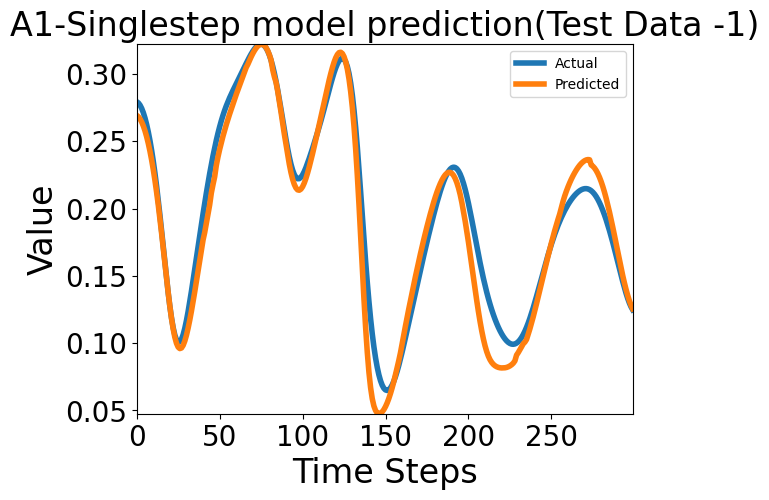

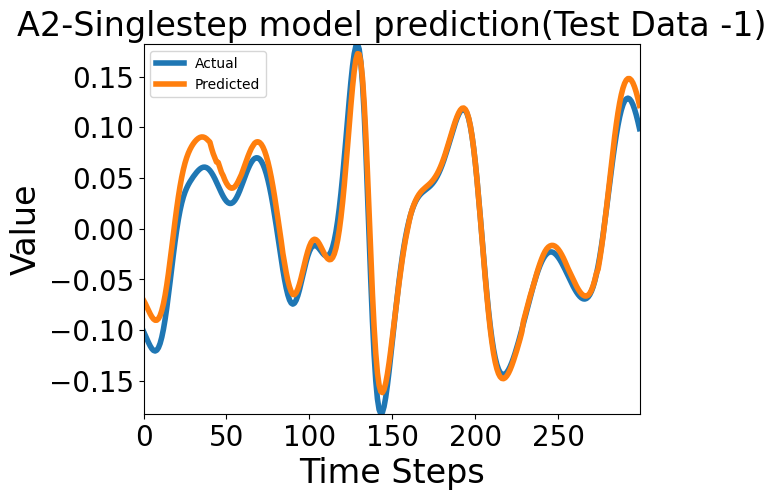

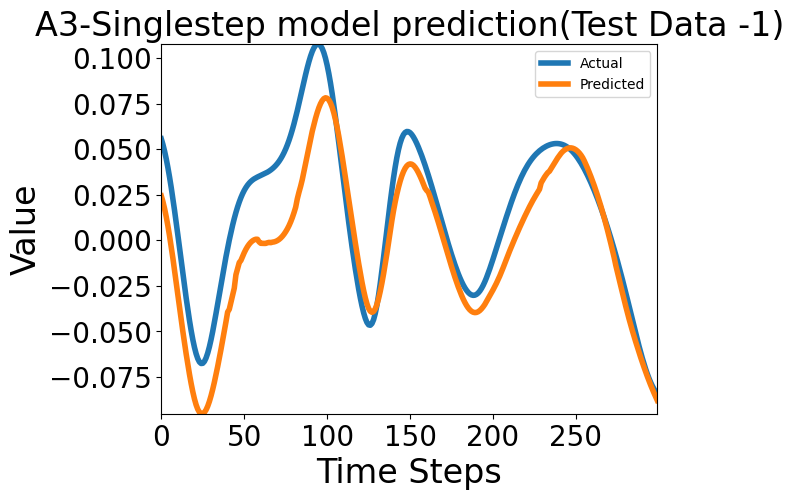

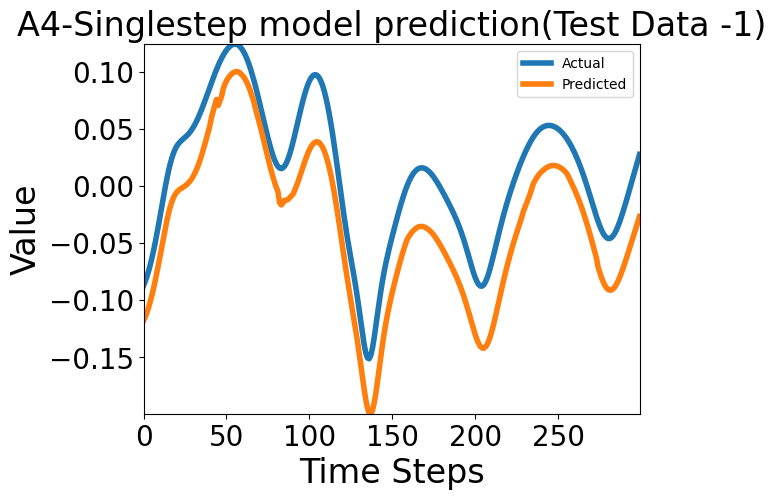

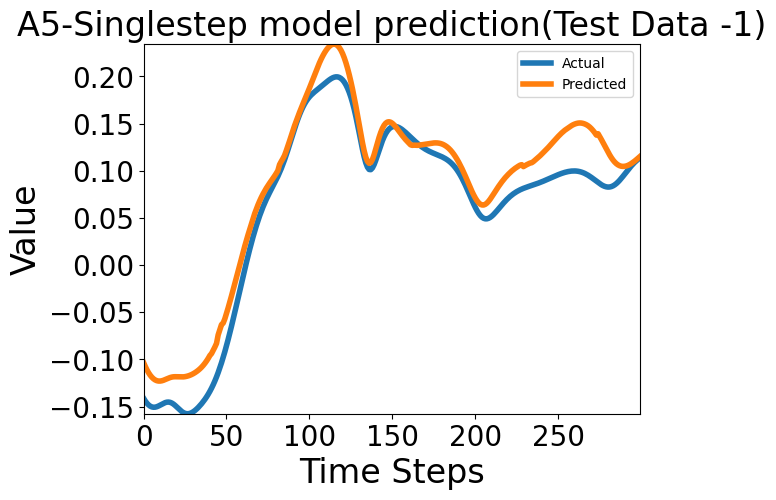

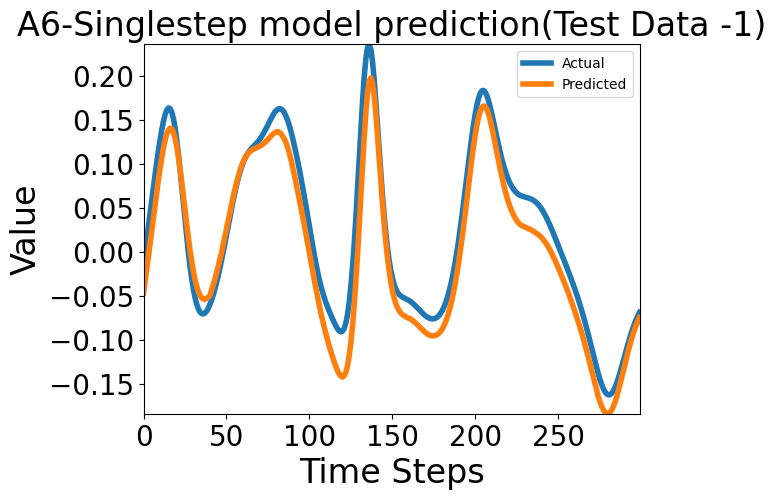

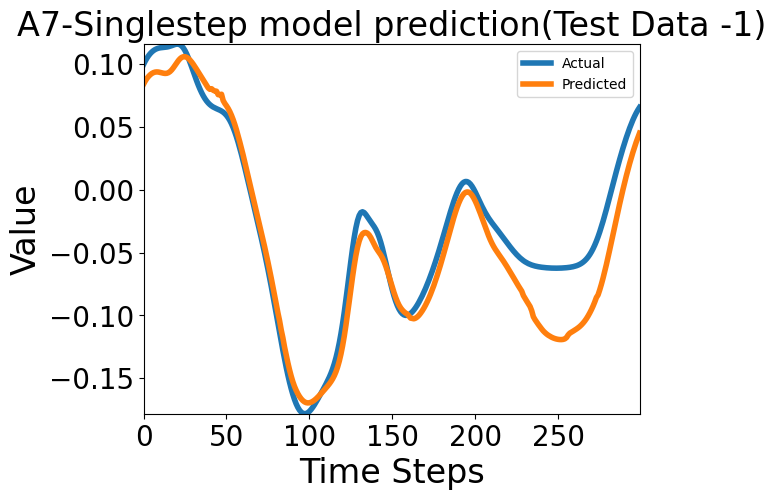

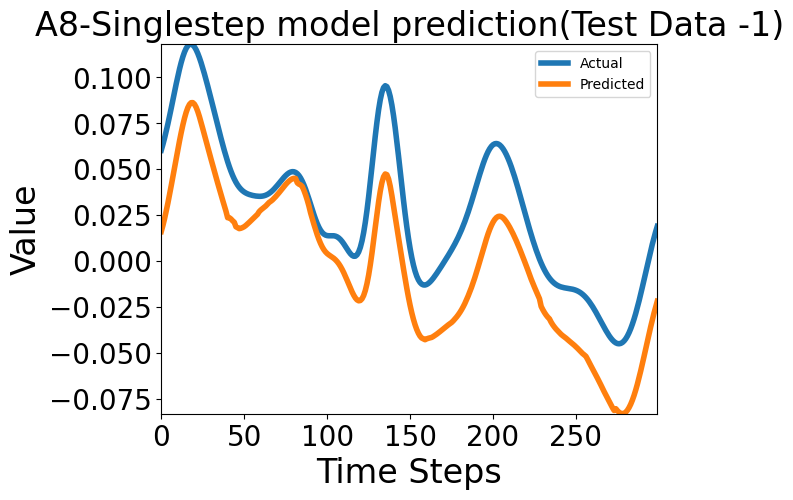

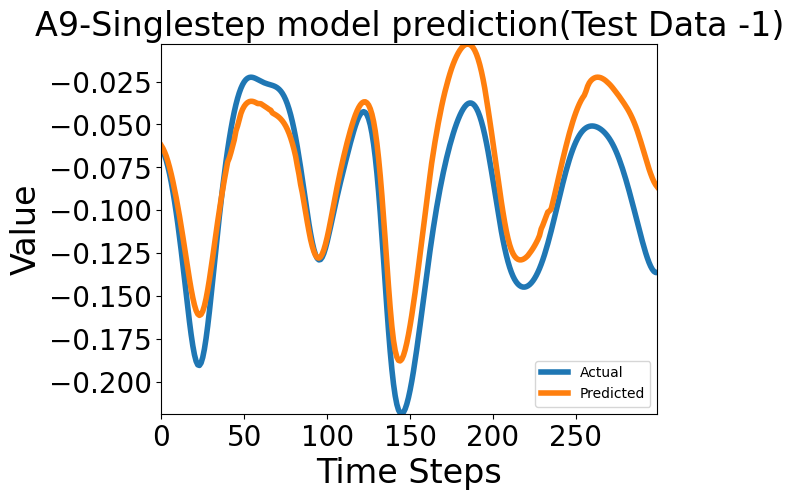

Predictions for Test Data - 2


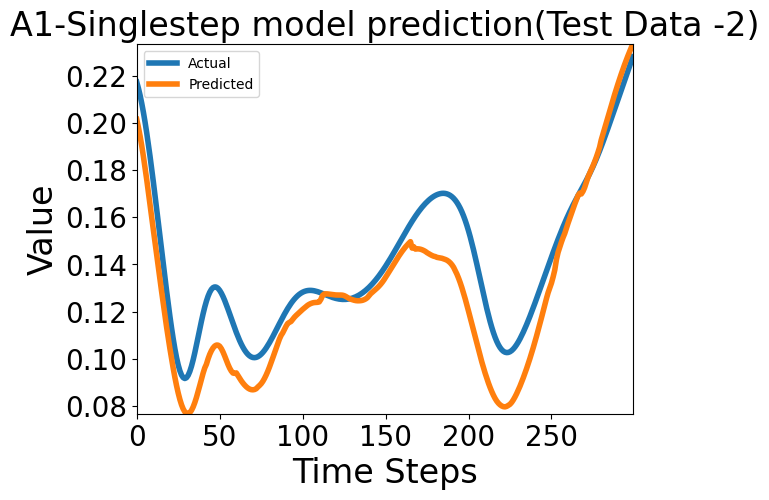

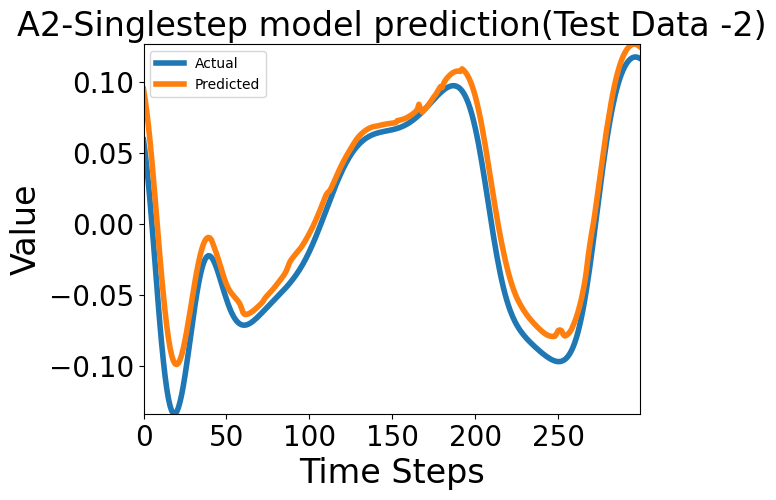

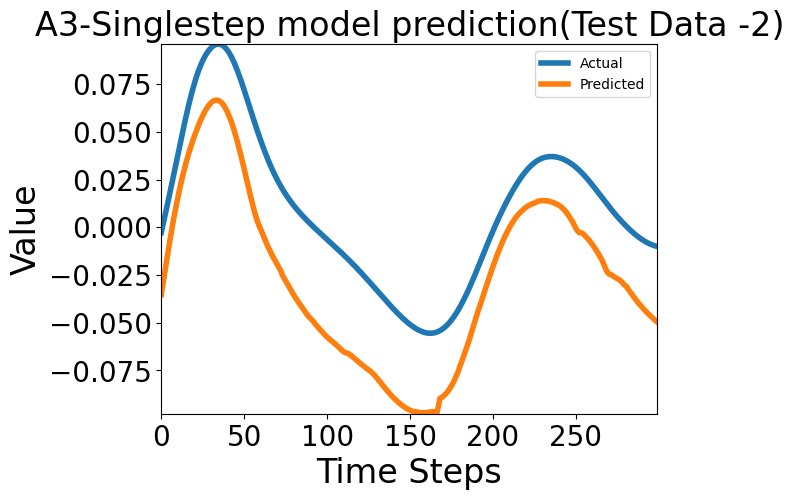

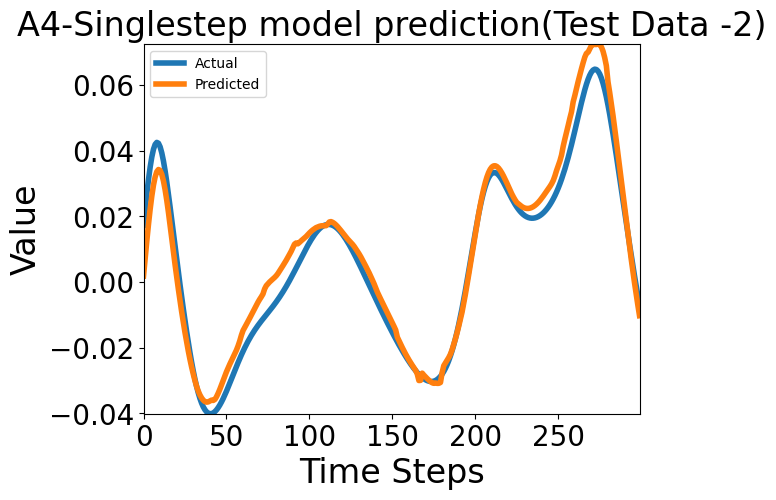

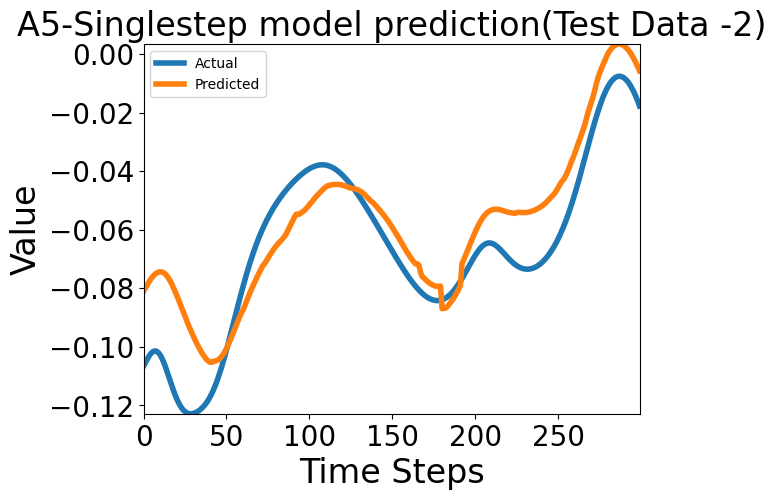

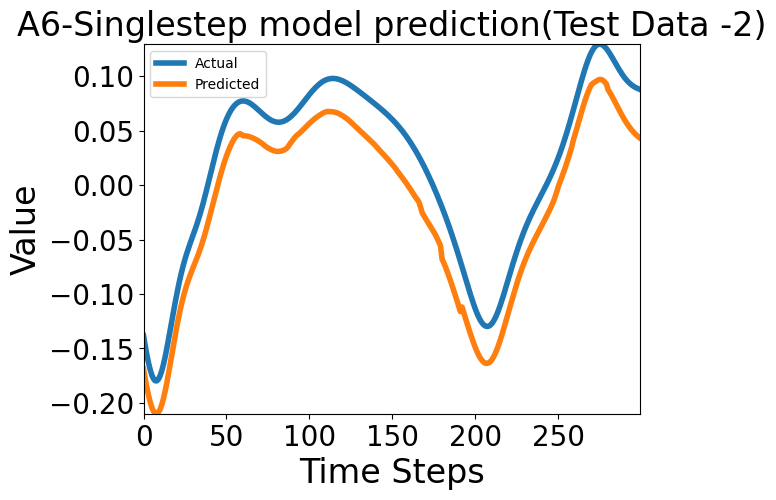

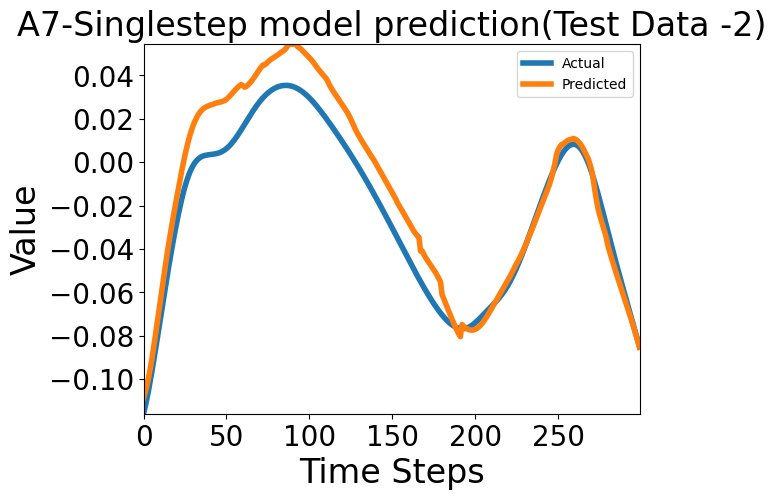

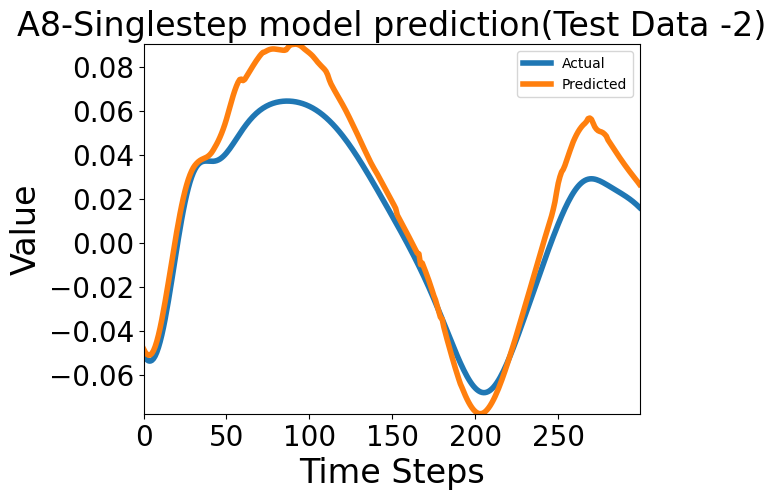

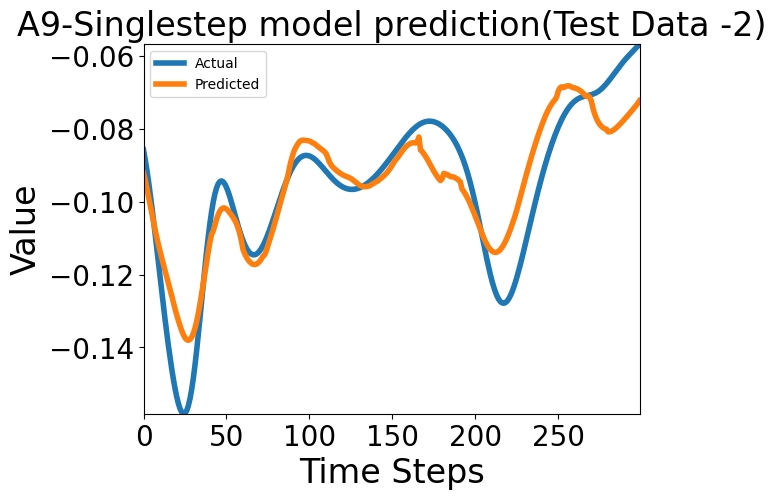

In [ ]:
for r in range(2):
  print(f'Predictions for Test Data - {r+1}')
  for j in range(9):
    predicted_values = ensemble_pred_ss[r][:,j]
    feature_values = []
    for i in range(len(test_generator_ss[r])):
      _,batch_data = test_generator_ss[r][i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Singlestep model prediction(Test Data -{r+1})',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'Testdata-{r+1}_A{j+1}_Single.png', bbox_inches='tight')
    plt.show()

###50 Singlestep models ensembled predictions

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
ensemble_pred_ss=[]
for a in range(2):
  print(f'Evaluation with respect to Test data - {a+1}')
  #Evaluate the predictions
  pred_ss=[]
  for k in range(50):
    pred_ss.append(singlestep[k].predict_generator(test_generator_ss[a]))

    print(f'Evaluation of Singlestep Model-{k+1} , MSE : {singlestep[k].evaluate_generator(test_generator_ss[a])[0]}, MAE : {singlestep[k].evaluate_generator(test_generator_ss[a])[1]} ')




  ensemble_prediction_ss=np.mean(pred_ss, axis=0)
  ensemble_pred_ss.append( ensemble_prediction_ss)

  mse = mean_squared_error(test_data_ss[a], ensemble_prediction_ss)
  mae = mean_absolute_error(test_data_ss[a], ensemble_prediction_ss)

  print(f"Ensembled predictions evaluation for TestData-{a+1} - MSE: {mse}, MAE: {mae}")

Evaluation with respect to Test data - 1
Evaluation of Singlestep Model-1 , MSE : 0.005848250817507505, MAE : 0.061909232288599014 
Evaluation of Singlestep Model-2 , MSE : 0.011460093781352043, MAE : 0.08433925360441208 
Evaluation of Singlestep Model-3 , MSE : 0.004319688305258751, MAE : 0.049567777663469315 
Evaluation of Singlestep Model-4 , MSE : 0.01190208550542593, MAE : 0.08752181380987167 
Evaluation of Singlestep Model-5 , MSE : 0.006754360161721706, MAE : 0.06563413888216019 
Evaluation of Singlestep Model-6 , MSE : 0.01930992491543293, MAE : 0.10577703267335892 
Evaluation of Singlestep Model-7 , MSE : 0.001566538237966597, MAE : 0.029543785378336906 
Evaluation of Singlestep Model-8 , MSE : 0.0076025440357625484, MAE : 0.06388217210769653 
Evaluation of Singlestep Model-9 , MSE : 0.004518099129199982, MAE : 0.04838279262185097 
Evaluation of Singlestep Model-10 , MSE : 0.004487478639930487, MAE : 0.05095299333333969 
Evaluation of Singlestep Model-11 , MSE : 0.005669473204

Predictions for Test Data - 1


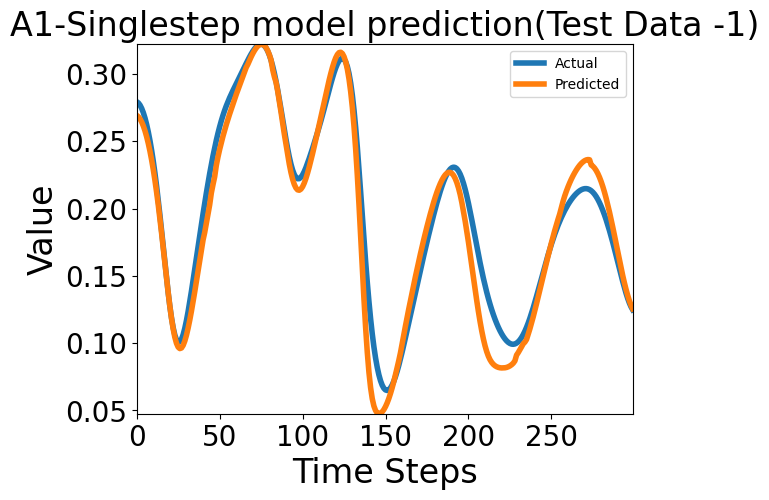

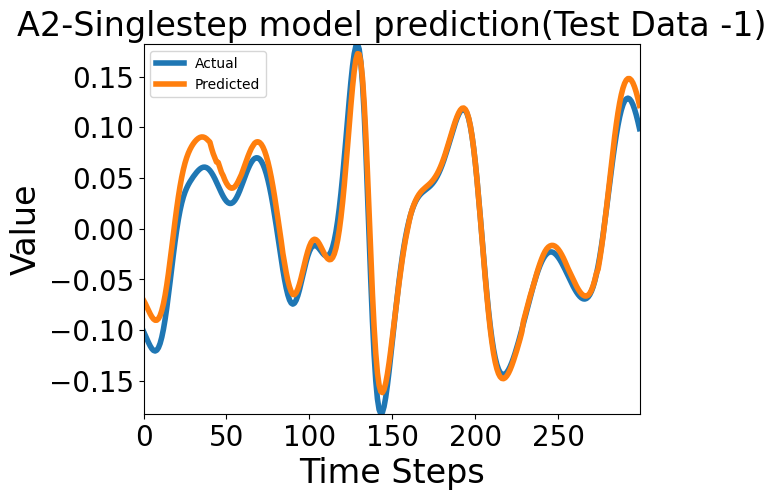

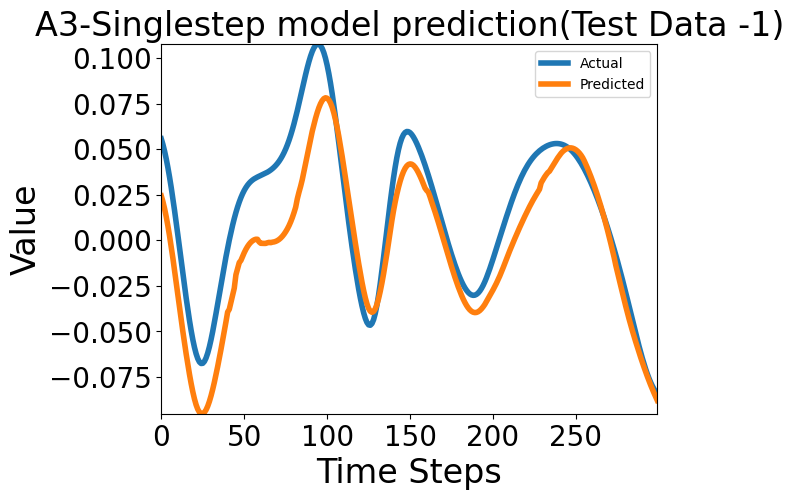

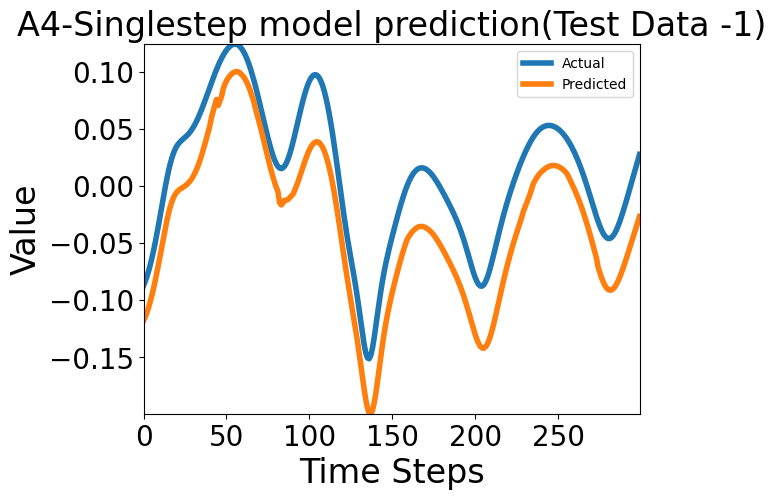

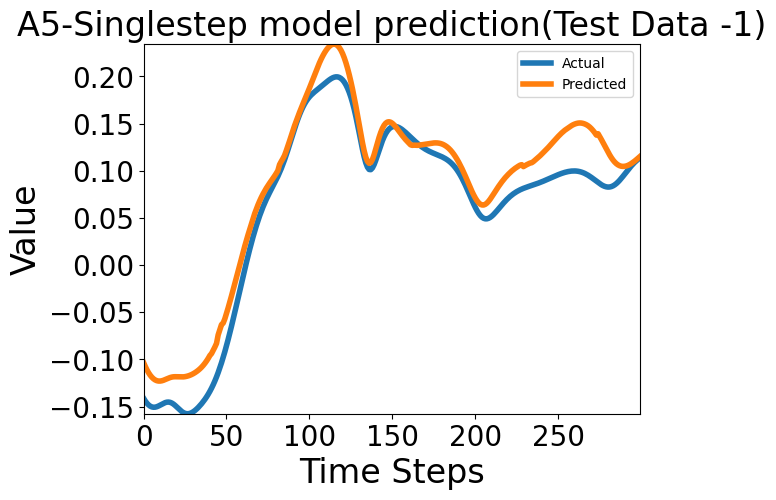

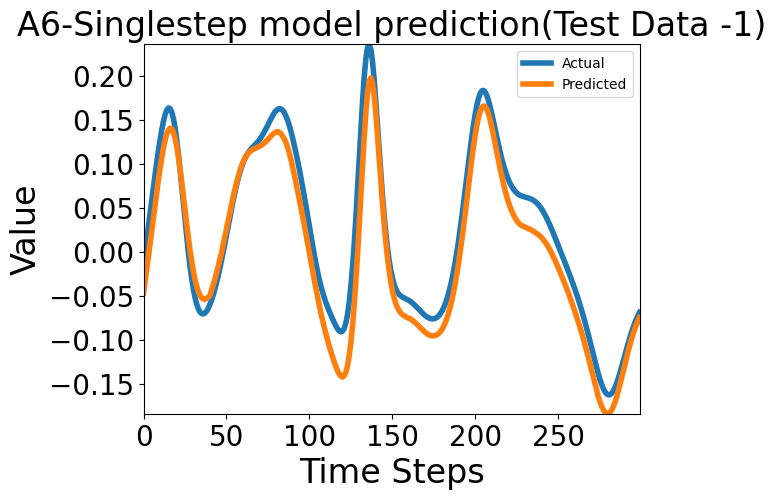

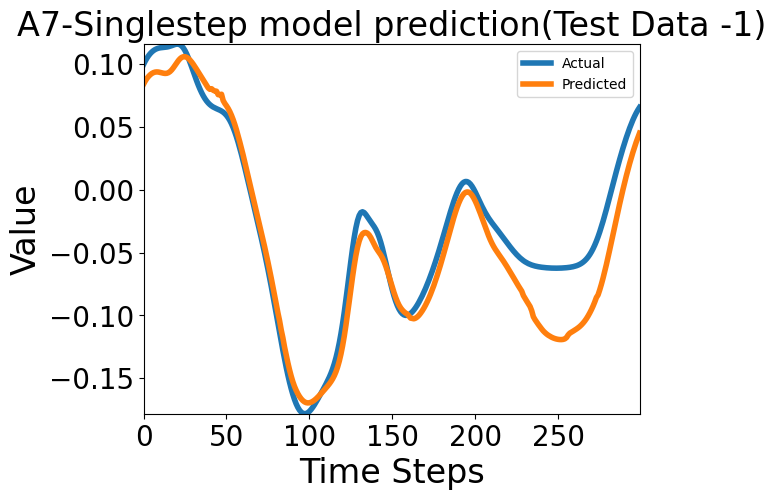

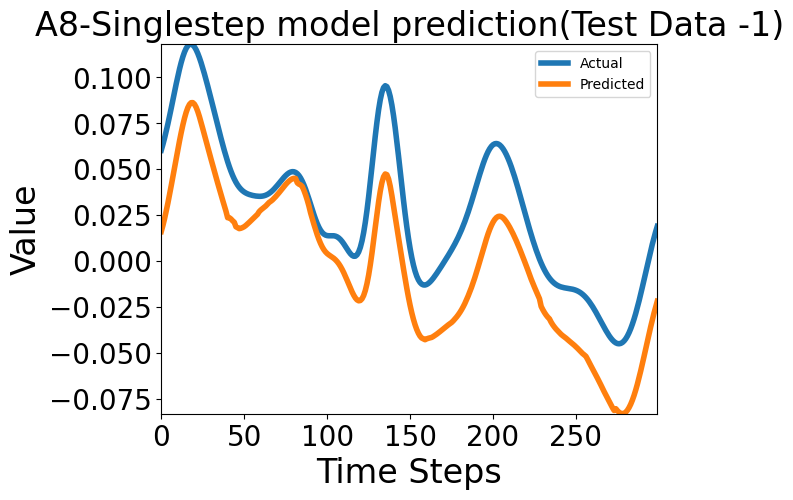

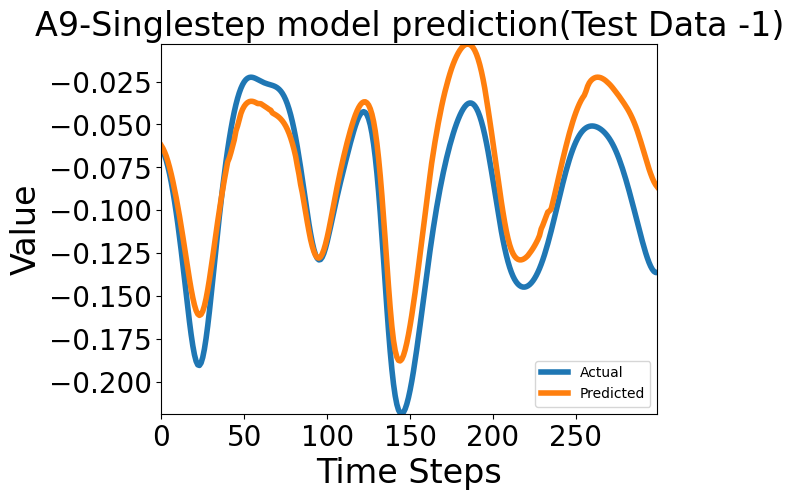

Predictions for Test Data - 2


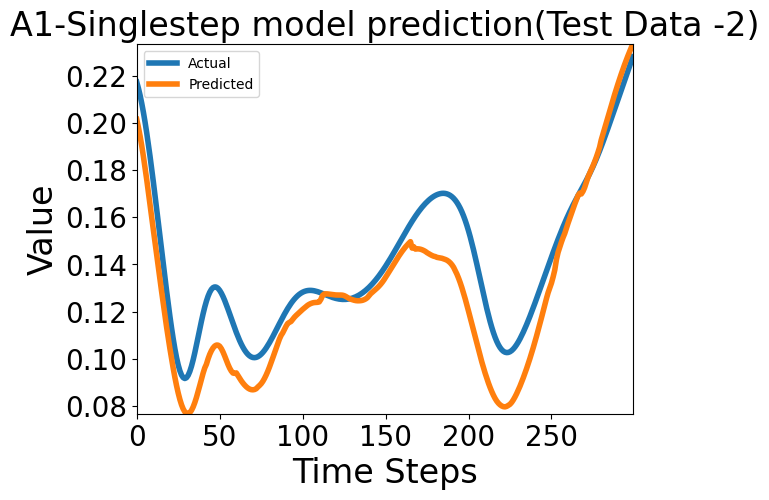

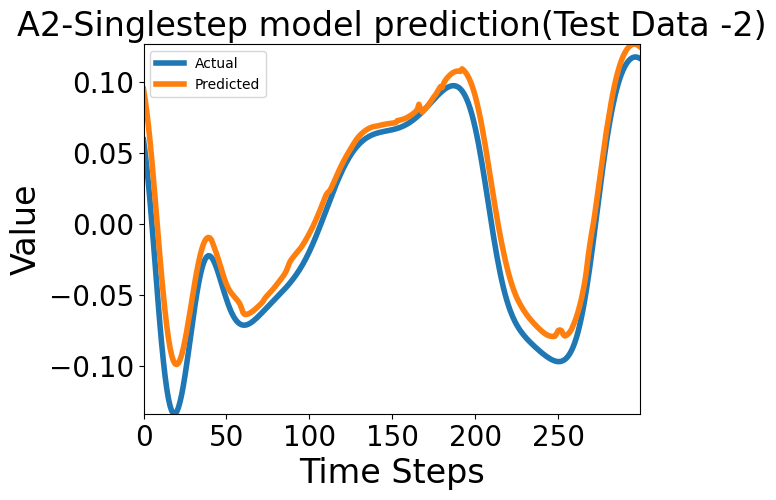

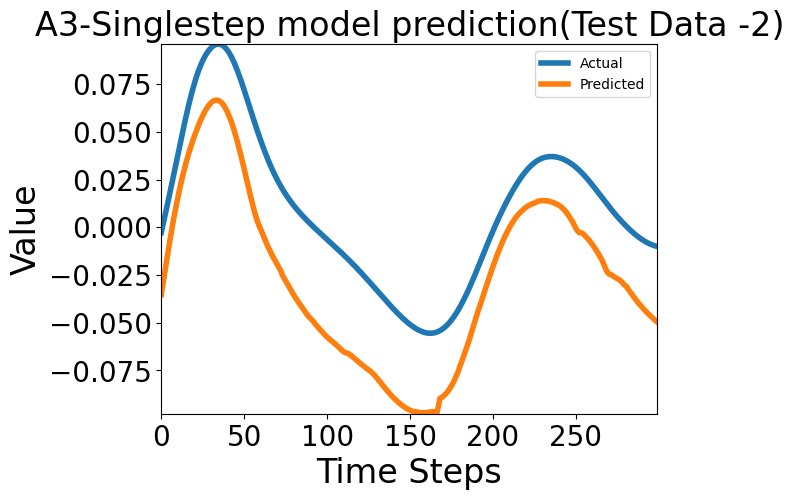

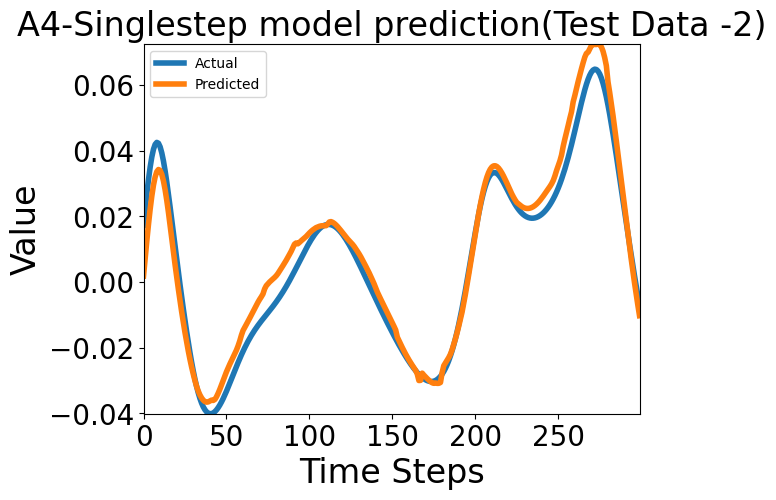

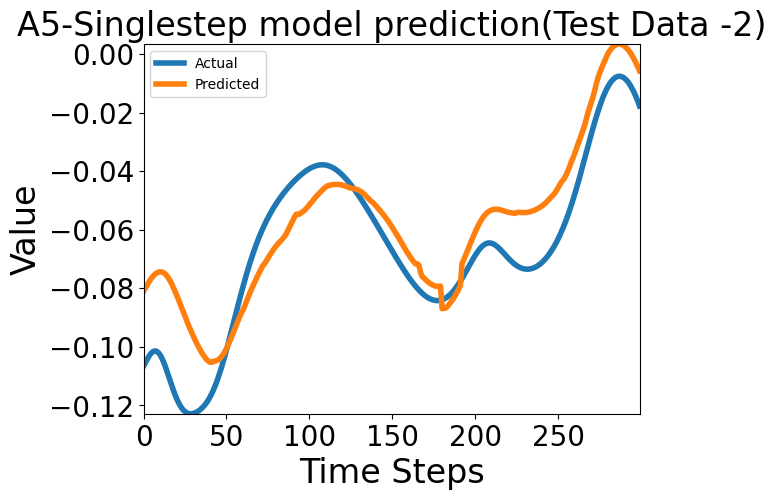

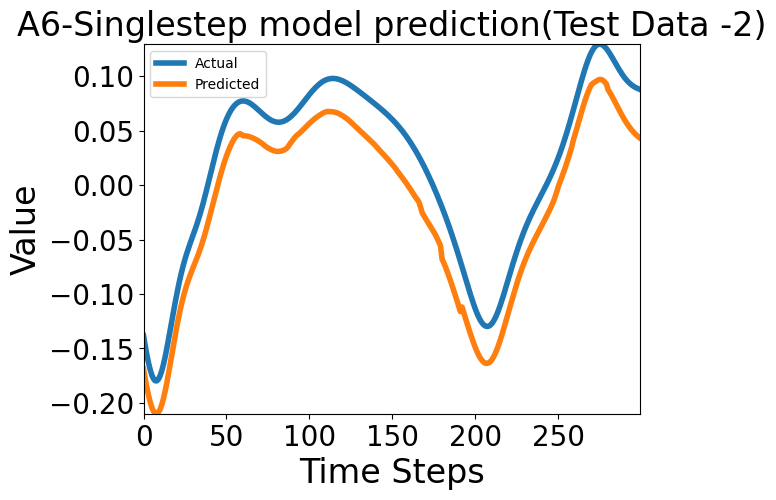

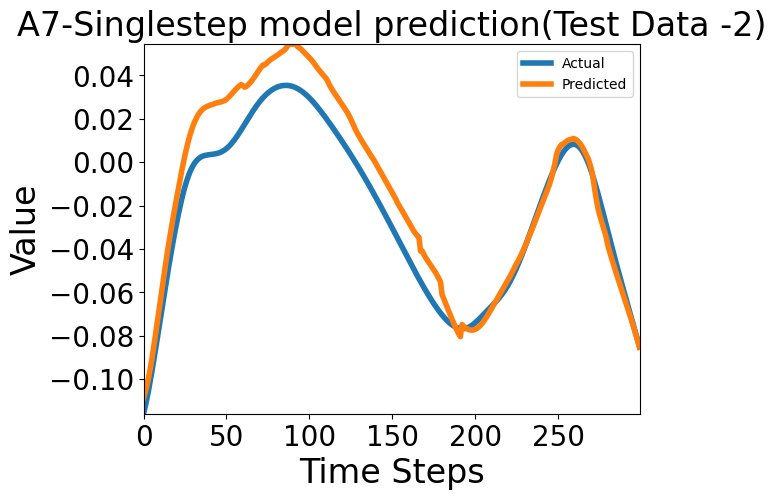

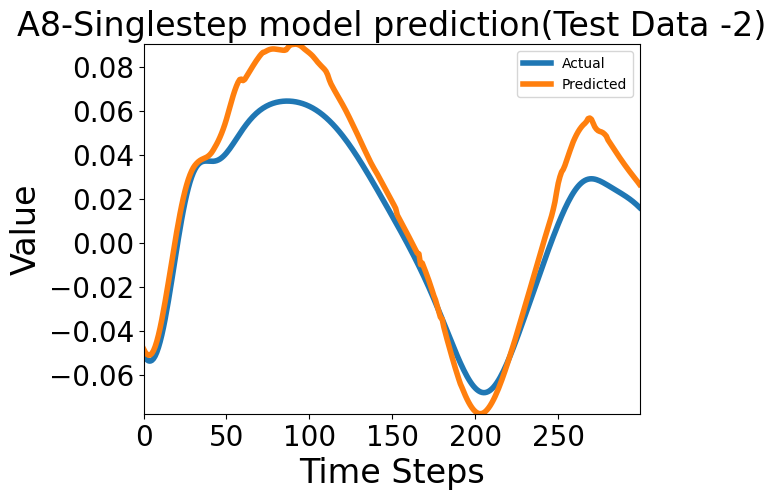

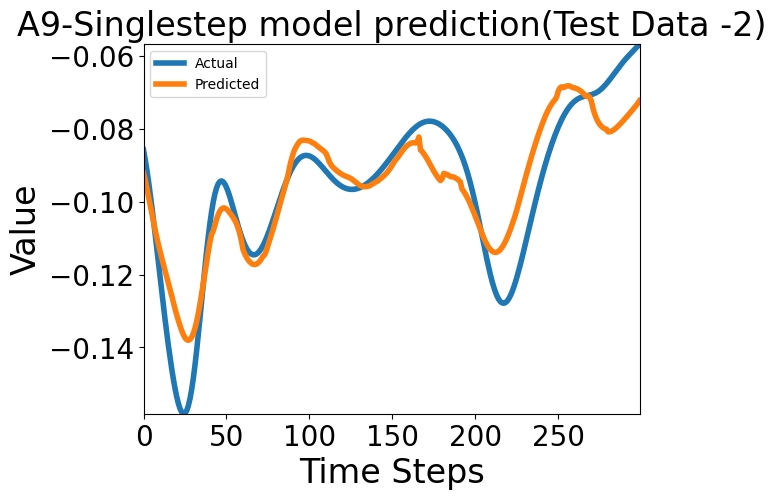

In [ ]:
for r in range(2):
  print(f'Predictions for Test Data - {r+1}')
  for j in range(9):
    predicted_values = ensemble_pred_ss[r][:,j]
    feature_values = []
    for i in range(len(test_generator_ss[r])):
      _,batch_data = test_generator_ss[r][i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Singlestep model prediction(Test Data -{r+1})',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'Testdata-{r+1}_A{j+1}_Single.png', bbox_inches='tight')
    plt.show()

##Multistep model training for 100 datasets GRU model

In [ ]:
from google.colab import files

In [ ]:
for i in range(100):
  df_=pd.read_csv(f"/content/100-Datasets/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
  #print(df_.head())

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=32
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model_gru.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model_gru.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model_gru.save(f'multistep{i}_gru.h5')
  files.download(f'multistep{i}_gru.h5')
#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_single{i}_gru.png', bbox_inches='tight')
  plt.show()

In [ ]:
#Load models
multistep_gru=[]
for j in range(100):
  multistep_gru.append(tf.keras.models.load_model(f'/content/GRU_models/multistep{j}_gru.h5'))

###100 Multistep models ensembled predictions with GRU

In [ ]:
test_data_ss=[]
test_generator_ss=[]
for i in range(100):
  df_=pd.read_csv(f"/content/100-Datasets/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)
  test_data_ss.append(y_test[-300:])
  window_length=500
  batch_size=32
  num_features=9
  test_generator_s=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator_ss.append(test_generator_s)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
ensemble_pred_ss=[]
for a in range(2,3):
  print(f'Evaluation with respect to Test data - {a+1}')
  #Evaluate the predictions
  pred_ss=[]
  for k in range(100):
    pred_ss.append(multistep_gru[k].predict_generator(test_generator_ss[a]))

    print(f'Evaluation of Multistep GRU Model-{k+1} , MSE : {multistep_gru[k].evaluate_generator(test_generator_ss[a])[0]}, MAE : {multistep_gru[k].evaluate_generator(test_generator_ss[a])[1]} ')




  ensemble_prediction_ss=np.mean(pred_ss, axis=0)
  ensemble_pred_ss.append( ensemble_prediction_ss)

  mse = mean_squared_error(test_data_ss[a], ensemble_prediction_ss)
  mae = mean_absolute_error(test_data_ss[a], ensemble_prediction_ss)

  print(f"Ensembled predictions evaluation for TestData-{a+1} - MSE: {mse}, MAE: {mae}")

Evaluation with respect to Test data - 3
Evaluation of Multistep GRU Model-1 , MSE : 4.0528717363486066e-05, MAE : 0.004948134999722242 
Evaluation of Multistep GRU Model-2 , MSE : 0.00010169661254622042, MAE : 0.00781091907992959 
Evaluation of Multistep GRU Model-3 , MSE : 0.00025352791999466717, MAE : 0.013264680281281471 
Evaluation of Multistep GRU Model-4 , MSE : 0.0001360837632091716, MAE : 0.008995610289275646 
Evaluation of Multistep GRU Model-5 , MSE : 3.187342736055143e-05, MAE : 0.004344168584793806 
Evaluation of Multistep GRU Model-6 , MSE : 5.117919863550924e-05, MAE : 0.005588184576481581 
Evaluation of Multistep GRU Model-7 , MSE : 0.00014006612764205784, MAE : 0.008931565098464489 
Evaluation of Multistep GRU Model-8 , MSE : 2.1592582925222814e-05, MAE : 0.0038301937747746706 
Evaluation of Multistep GRU Model-9 , MSE : 7.153135084081441e-05, MAE : 0.006474729161709547 
Evaluation of Multistep GRU Model-10 , MSE : 0.0001258707488887012, MAE : 0.007647982332855463 
Eva

Predictions for Test Data - 1


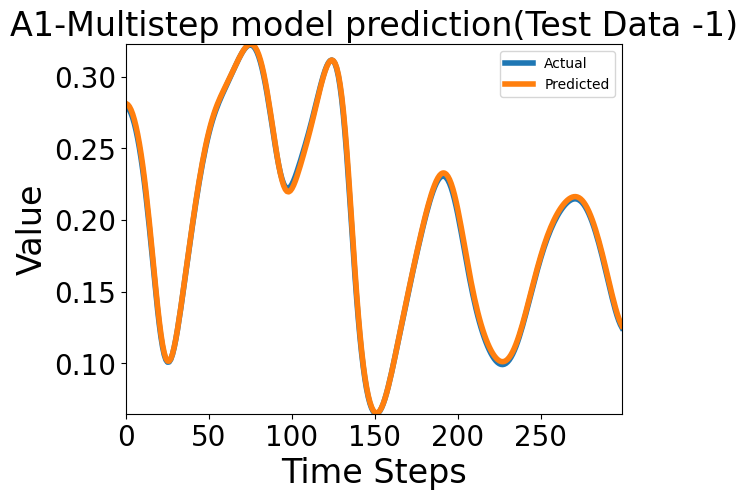

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

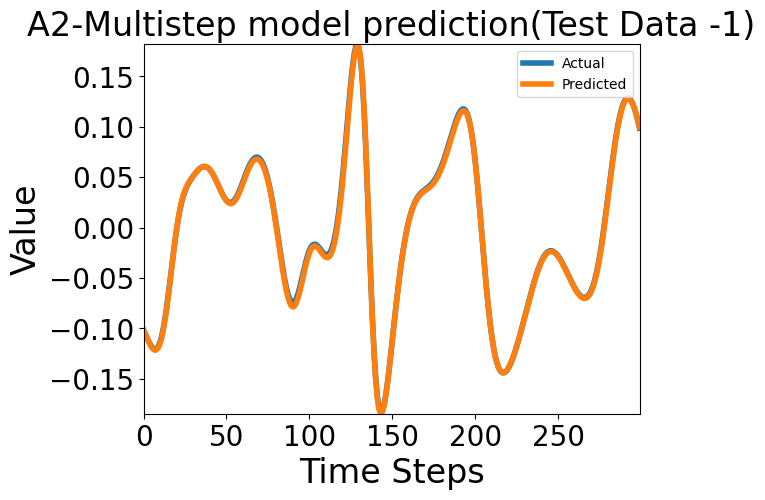

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

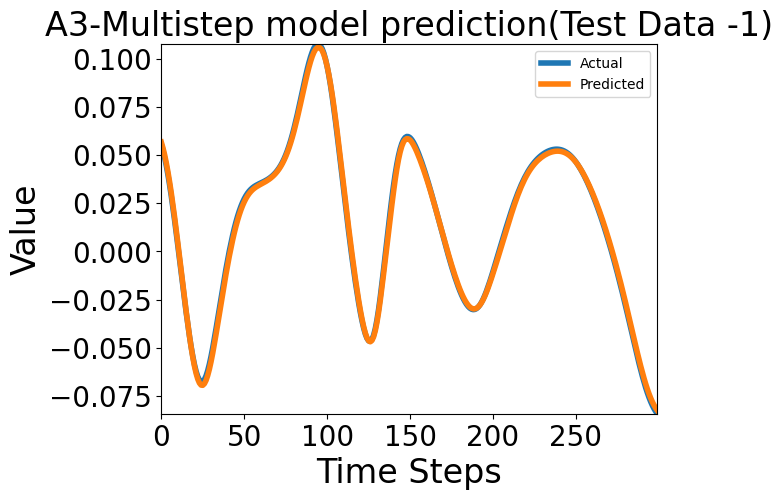

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

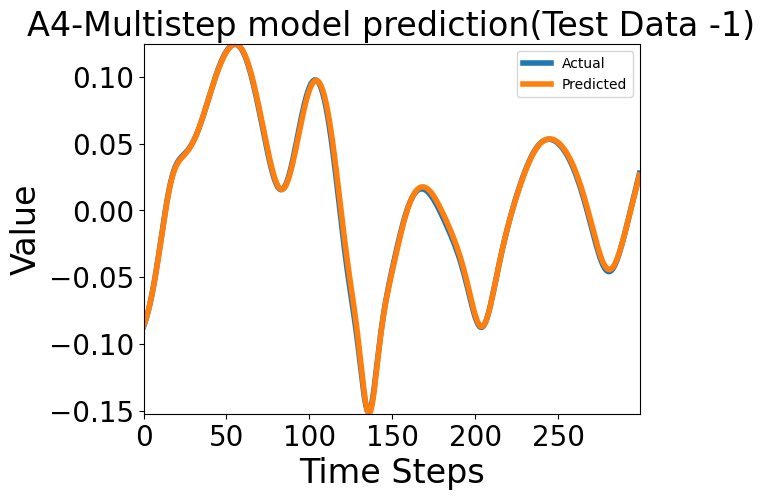

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

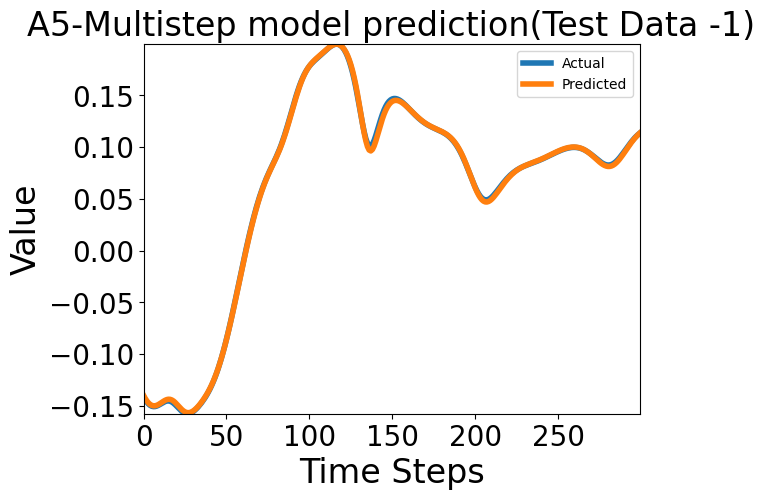

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

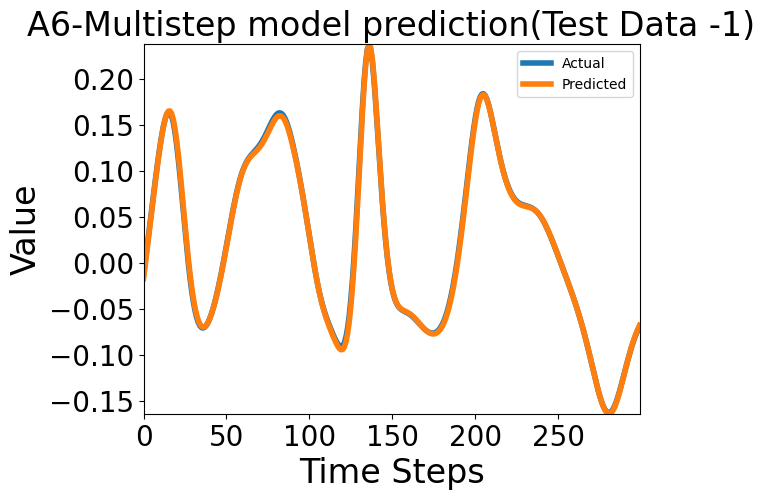

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

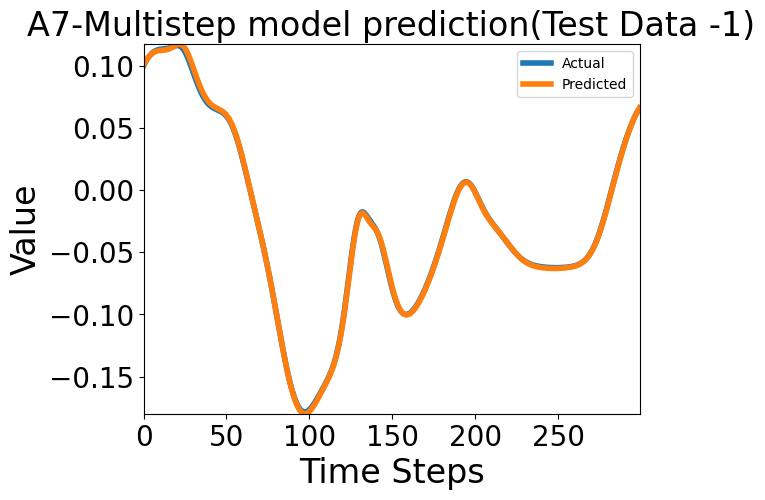

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

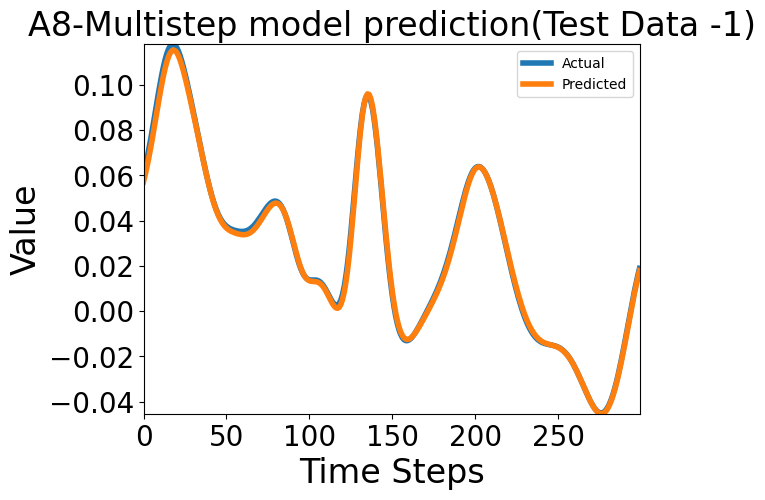

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

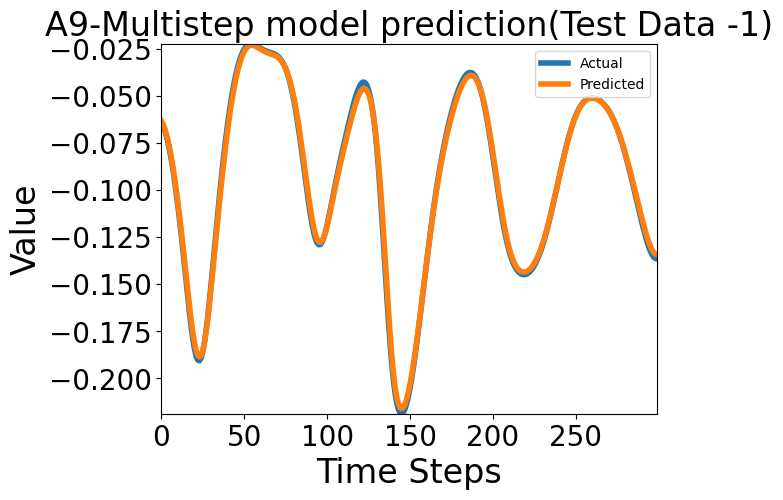

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Predictions for Test Data - 2


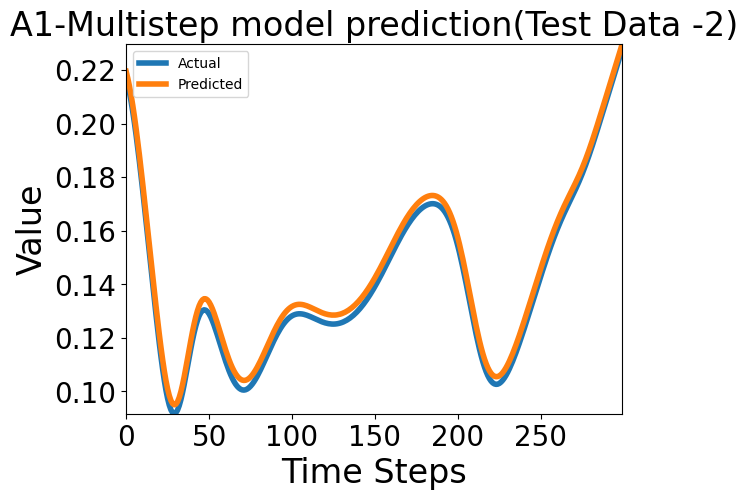

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

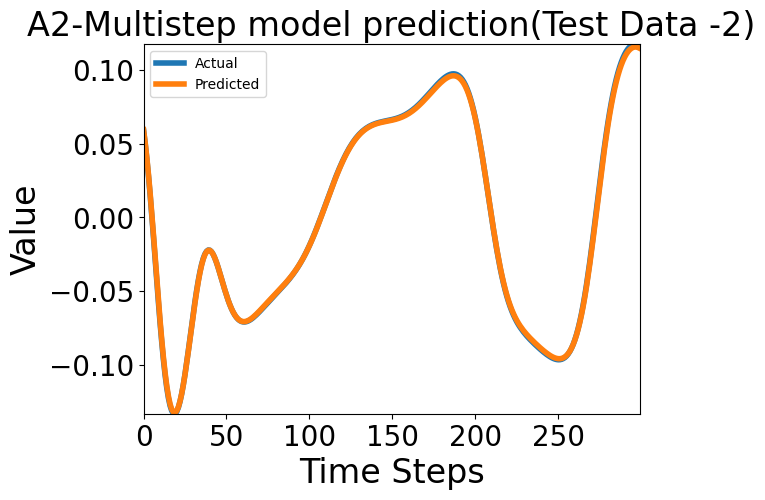

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

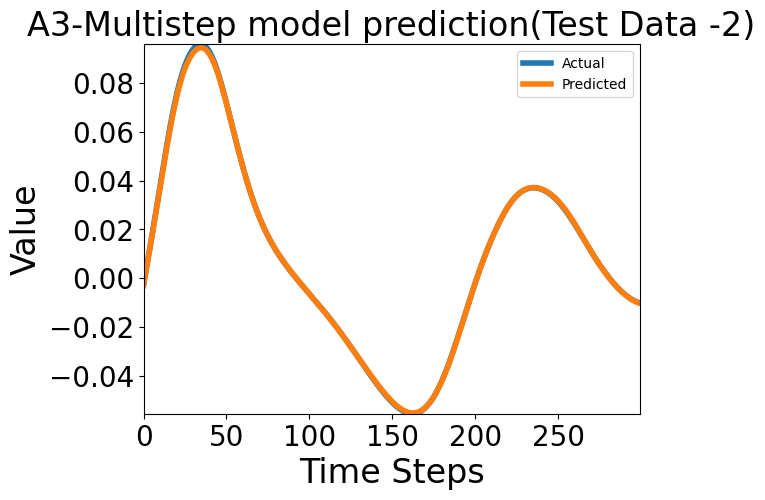

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

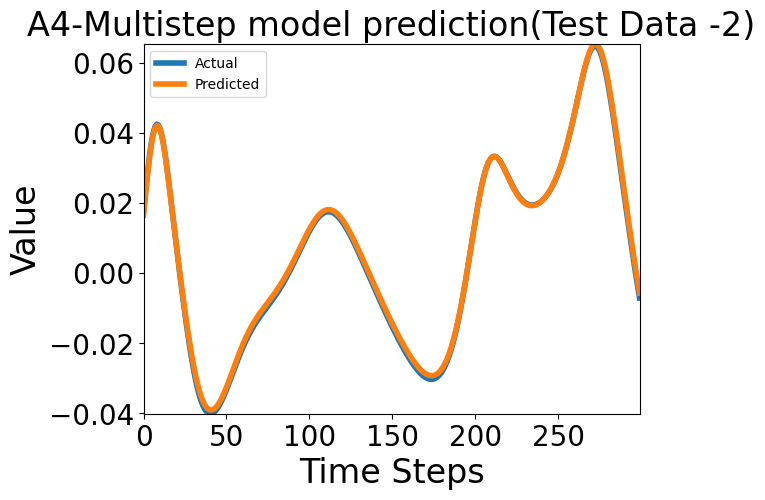

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

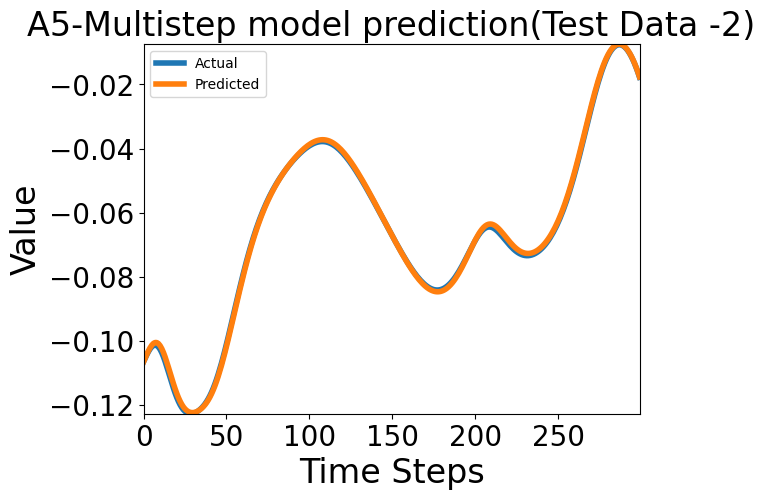

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

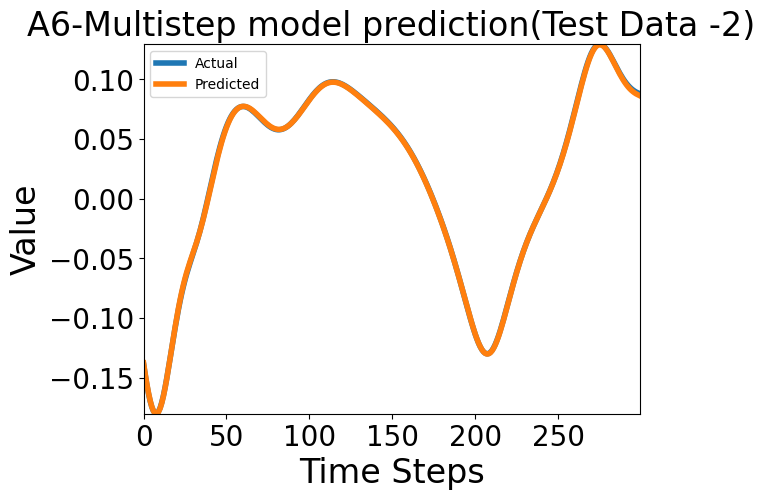

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

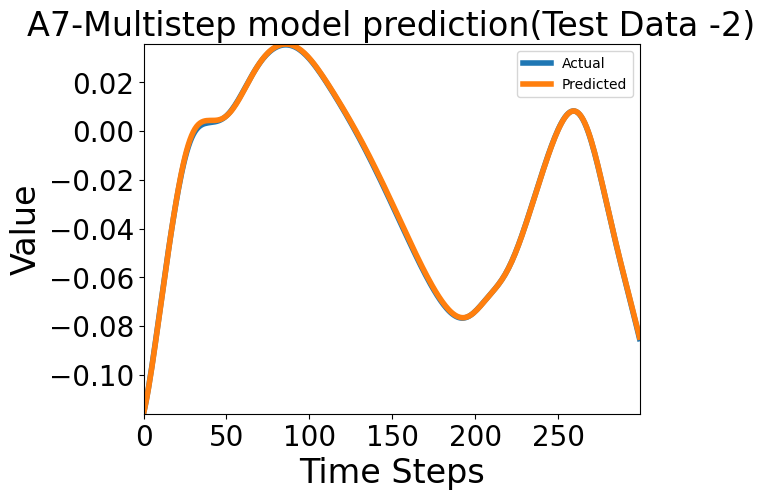

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

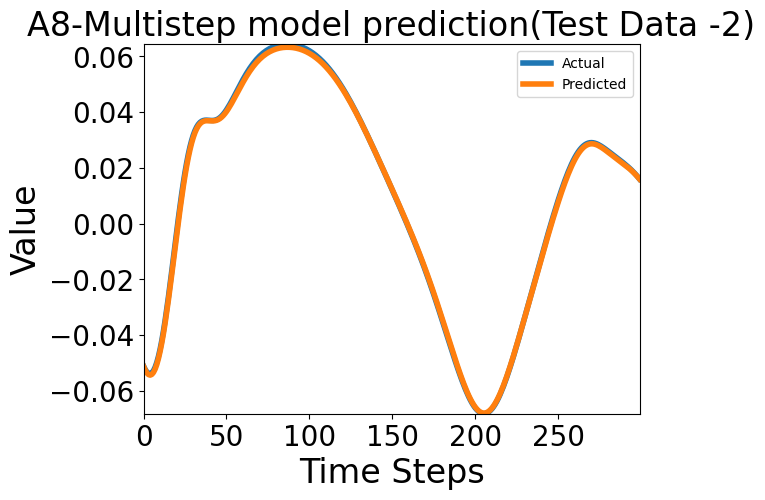

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

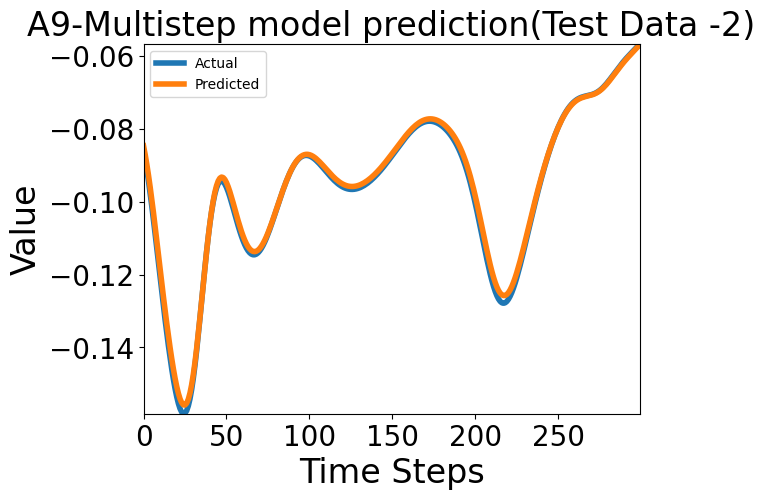

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
for r in range(2):
  print(f'Predictions for Test Data - {r+1}')
  for j in range(9):
    predicted_values = ensemble_pred_ss[r][:,j]
    feature_values = []
    for i in range(len(test_generator_ss[r])):
      _,batch_data = test_generator_ss[r][i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Multistep model prediction(Test Data -{r+1})',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'100_dataset_ensembledpred_Testdata-{r+1}_A{j+1}_Mutistep.png', bbox_inches='tight')
    plt.show()
    files.download(f'100_dataset_ensembledpred_Testdata-{r+1}_A{j+1}_Mutistep.png')

###50 Multistep models ensembled predictions with GRU


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
ensemble_pred_ss=[]
for a in range(2):
  print(f'Evaluation with respect to Test data - {a+1}')
  #Evaluate the predictions
  pred_ss=[]
  for k in range(50):
    pred_ss.append(multistep_gru[k].predict_generator(test_generator_ss[a]))

    print(f'Evaluation of Multistep GRU Model-{k+1} , MSE : {multistep_gru[k].evaluate_generator(test_generator_ss[a])[0]}, MAE : {multistep_gru[k].evaluate_generator(test_generator_ss[a])[1]} ')




  ensemble_prediction_ss=np.mean(pred_ss, axis=0)
  ensemble_pred_ss.append( ensemble_prediction_ss)

  mse = mean_squared_error(test_data_ss[a], ensemble_prediction_ss)
  mae = mean_absolute_error(test_data_ss[a], ensemble_prediction_ss)

  print(f"Ensembled predictions evaluation for TestData-{a+1} - MSE: {mse}, MAE: {mae}")

Evaluation with respect to Test data - 1
Evaluation of Multistep GRU Model-1 , MSE : 6.774948997190222e-05, MAE : 0.0062868851236999035 
Evaluation of Multistep GRU Model-2 , MSE : 0.00033517213887535036, MAE : 0.013243993744254112 
Evaluation of Multistep GRU Model-3 , MSE : 0.0003719703818205744, MAE : 0.015619322657585144 
Evaluation of Multistep GRU Model-4 , MSE : 0.00015189734403975308, MAE : 0.008588648401200771 
Evaluation of Multistep GRU Model-5 , MSE : 2.958069853775669e-05, MAE : 0.0042599765583872795 
Evaluation of Multistep GRU Model-6 , MSE : 8.481243276037276e-05, MAE : 0.007224859204143286 
Evaluation of Multistep GRU Model-7 , MSE : 0.00012567082012537867, MAE : 0.008286104537546635 
Evaluation of Multistep GRU Model-8 , MSE : 2.8910568289575167e-05, MAE : 0.0041854348964989185 
Evaluation of Multistep GRU Model-9 , MSE : 9.571998089086264e-05, MAE : 0.007486052345484495 
Evaluation of Multistep GRU Model-10 , MSE : 5.686083750333637e-05, MAE : 0.005240284837782383 
E

Predictions for Test Data - 1


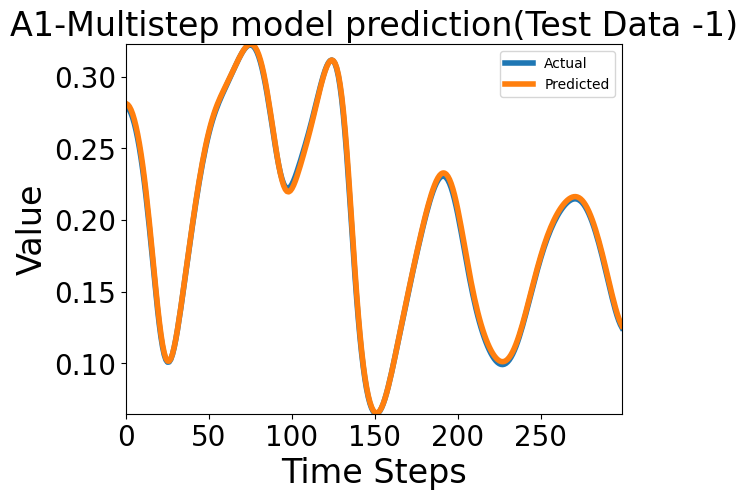

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

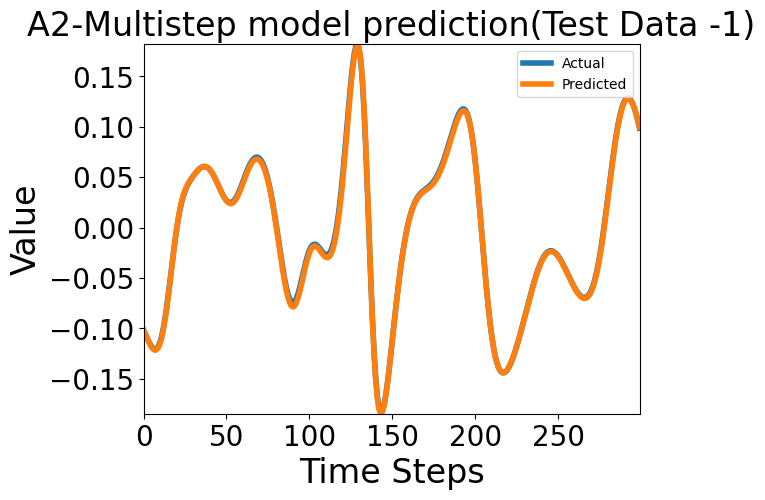

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

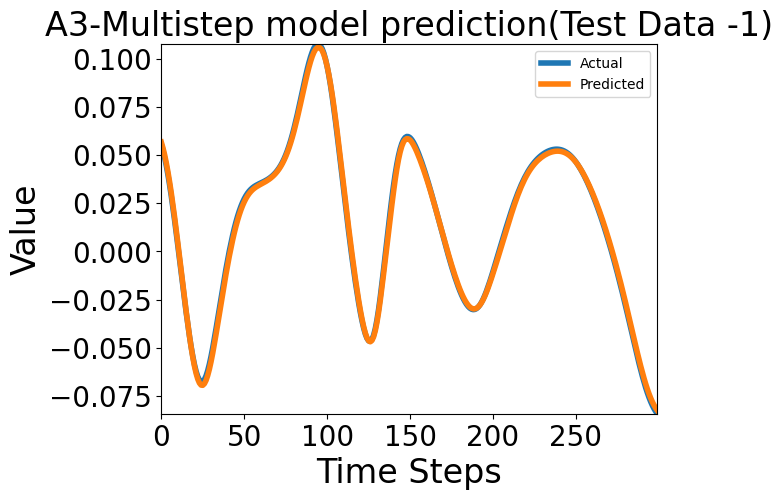

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

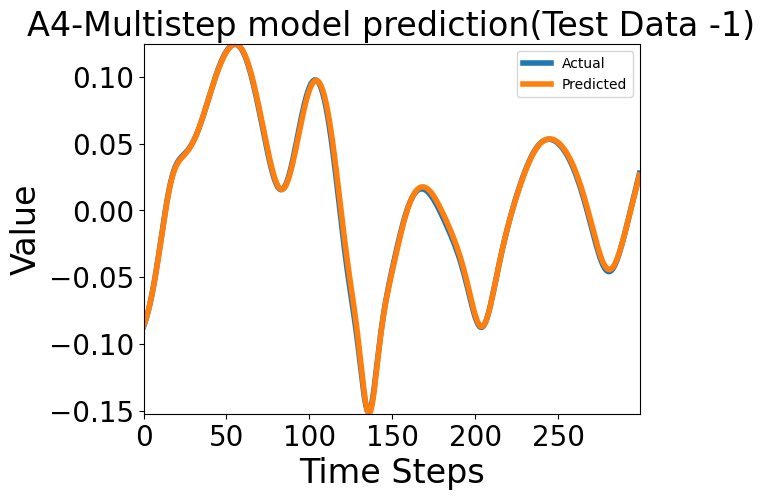

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

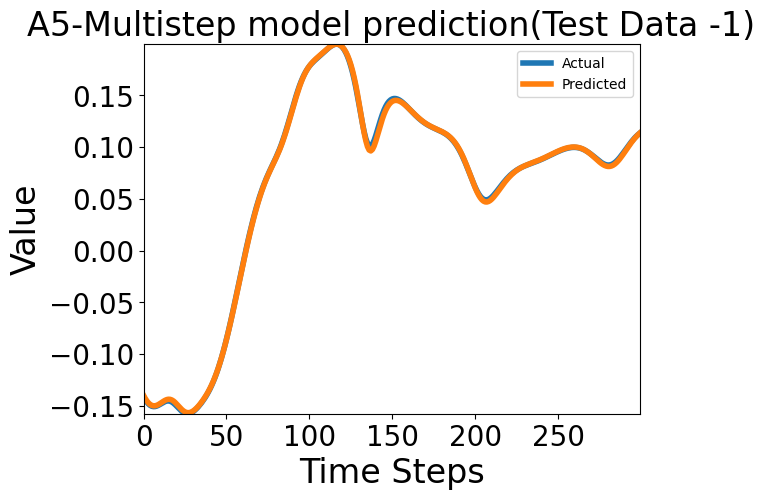

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

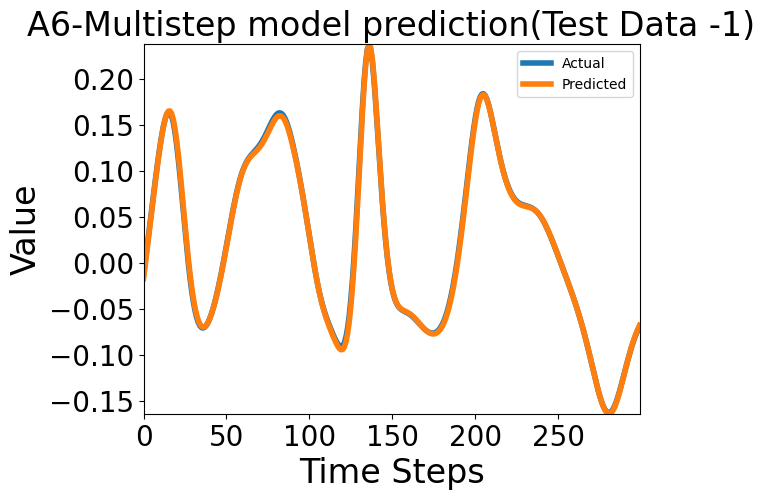

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

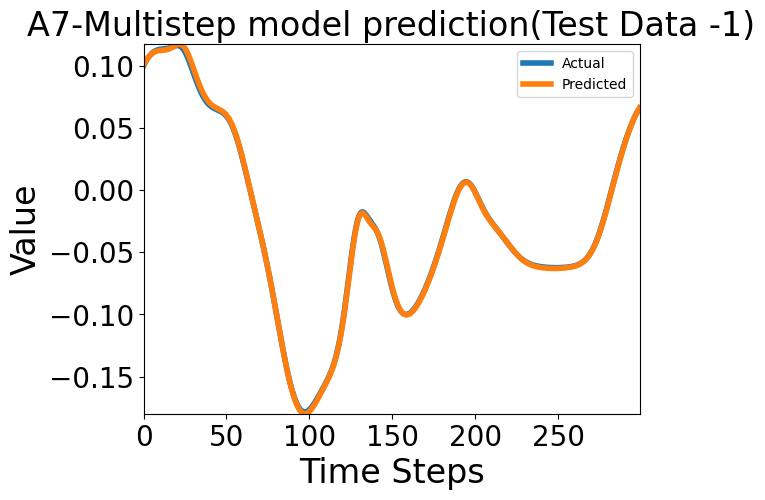

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

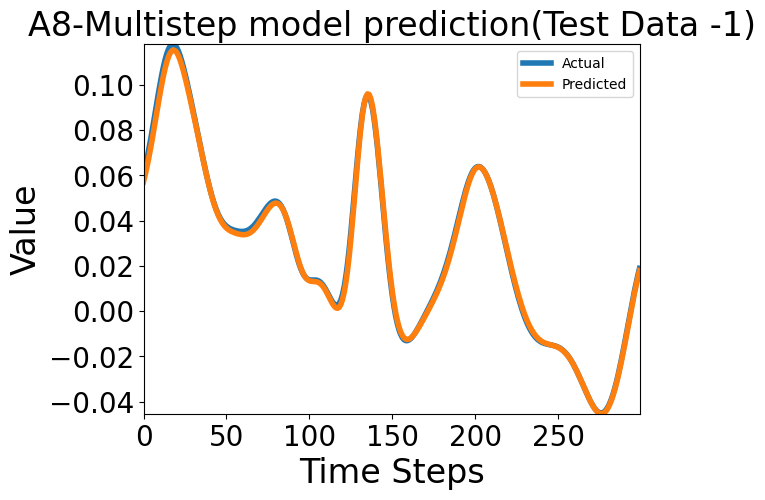

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

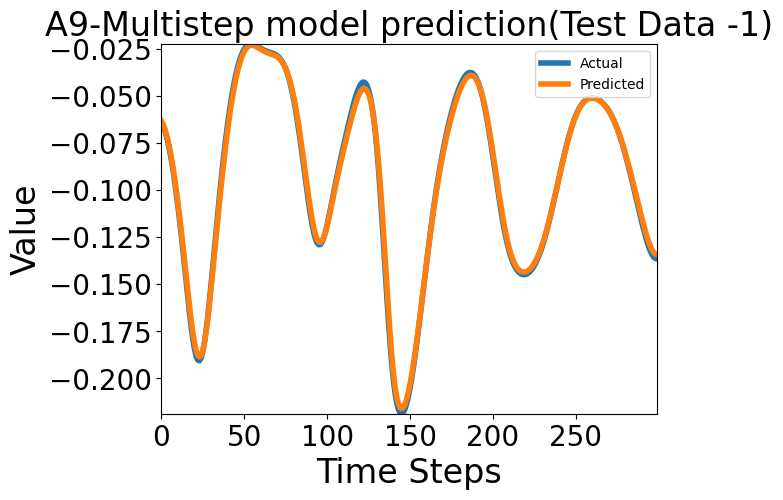

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Predictions for Test Data - 2


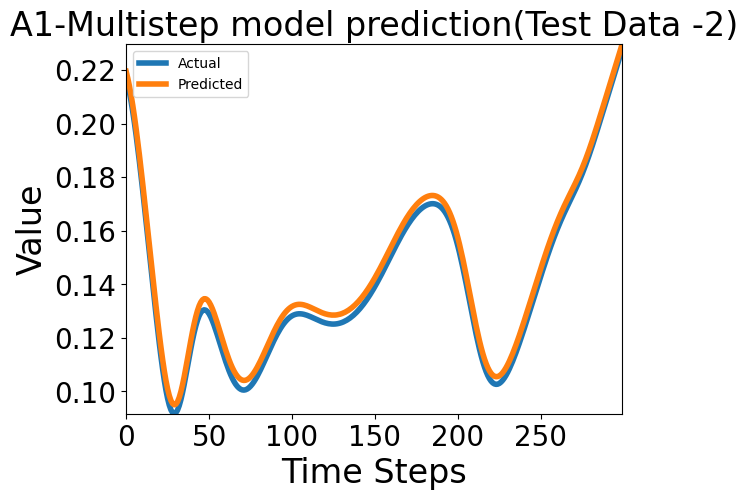

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

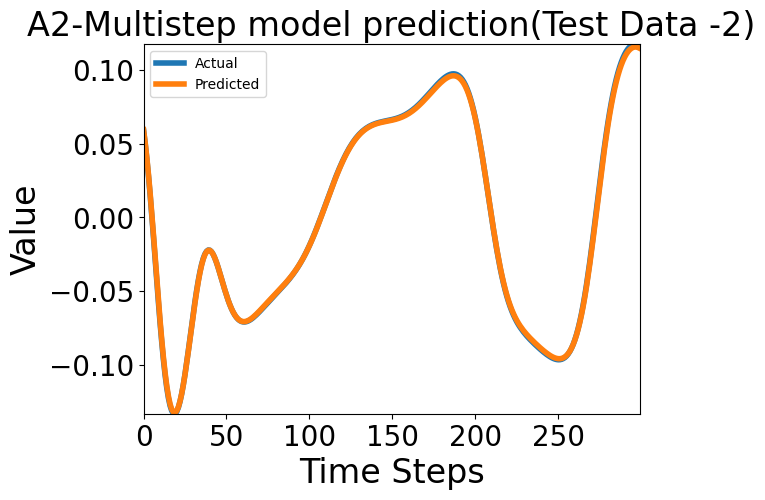

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

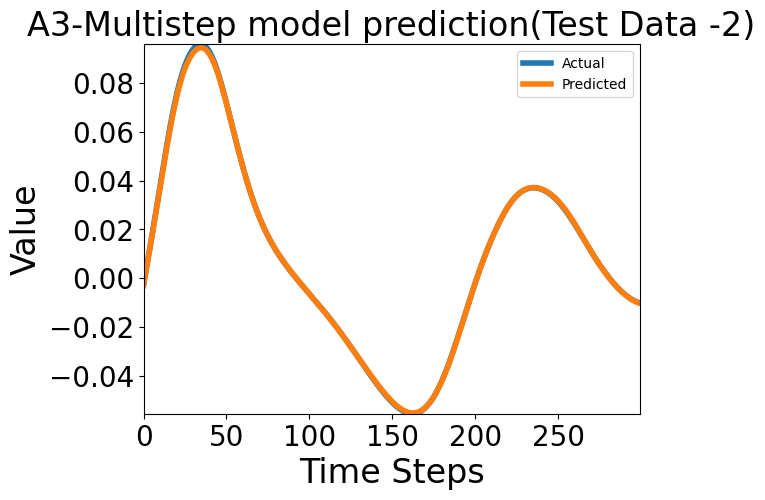

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

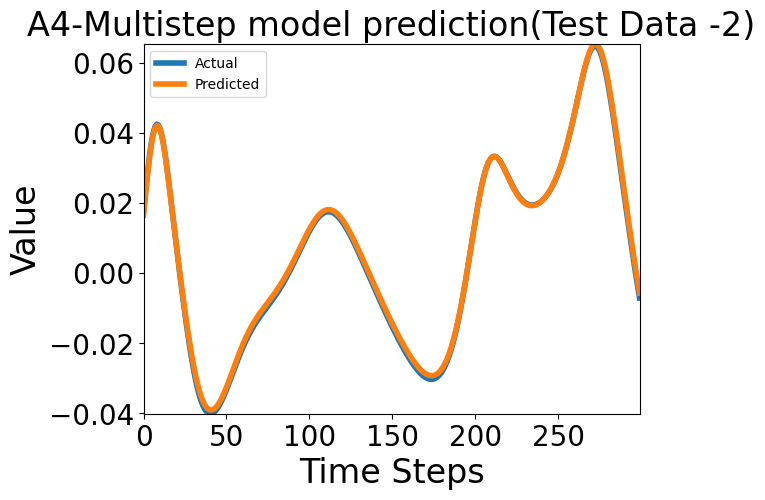

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

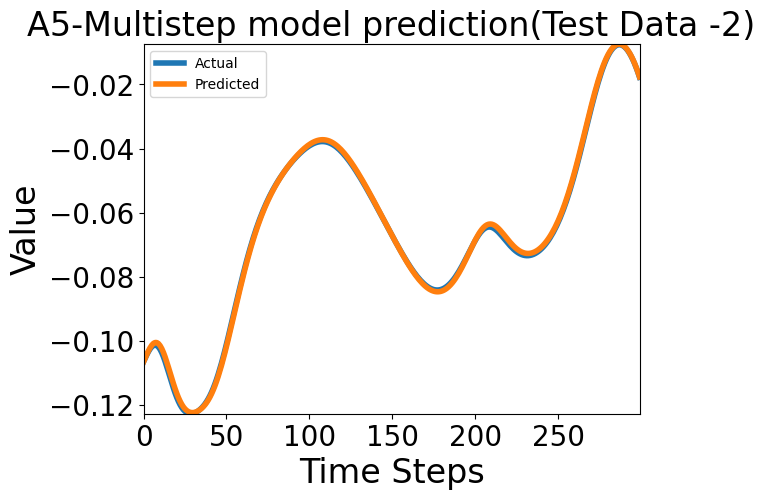

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

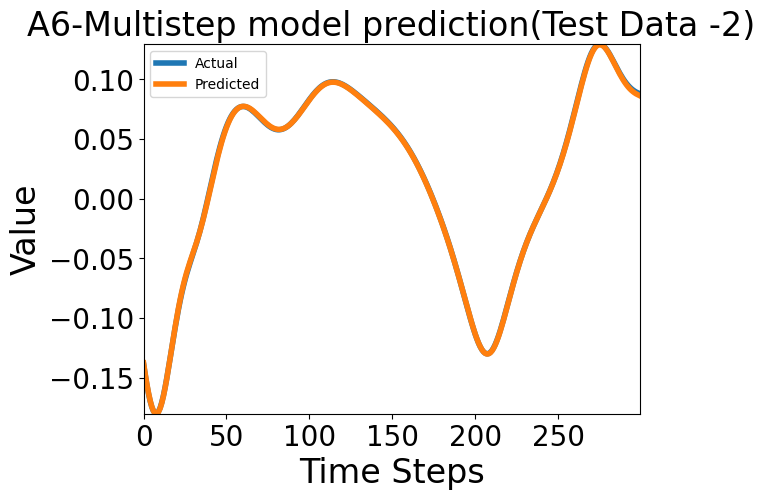

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

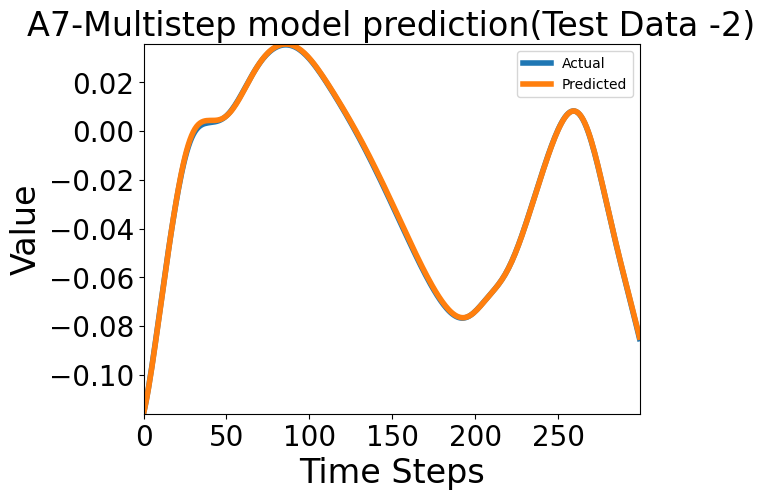

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

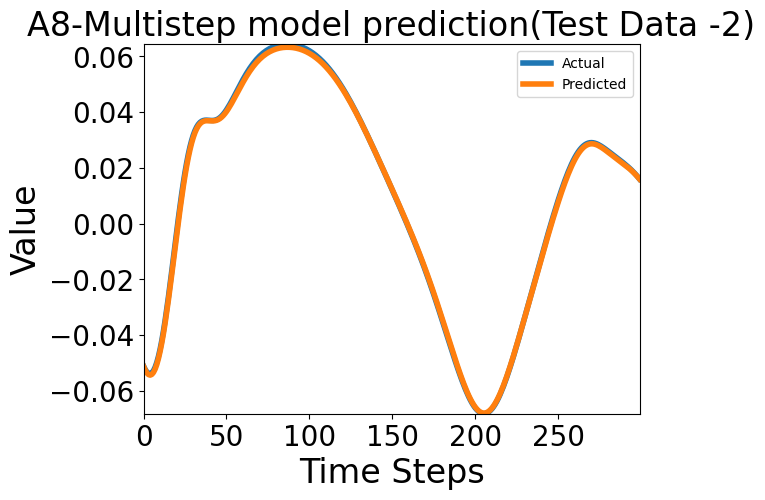

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

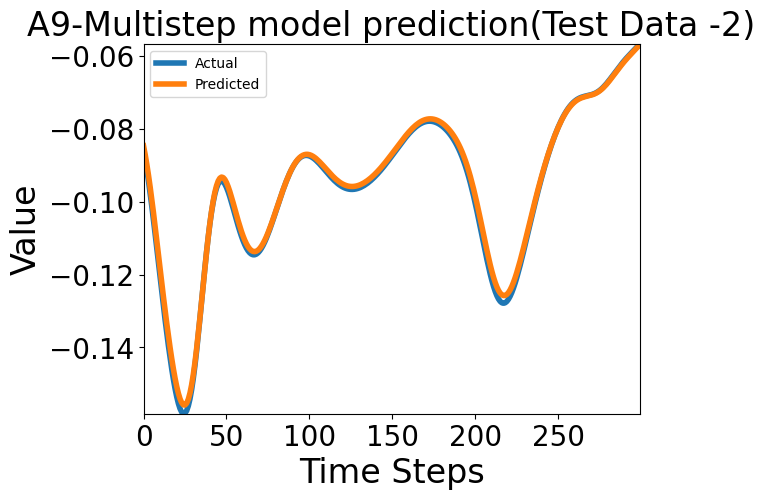

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
for r in range(2):
  print(f'Predictions for Test Data - {r+1}')
  for j in range(9):
    predicted_values = ensemble_pred_ss[r][:,j]
    feature_values = []
    for i in range(len(test_generator_ss[r])):
      _,batch_data = test_generator_ss[r][i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Multistep model prediction(Test Data -{r+1})',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'Testdata-{r+1}_A{j+1}_Mutistep.png', bbox_inches='tight')
    plt.show()
    files.download(f'Testdata-{r+1}_A{j+1}_Mutistep.png')

##Singlestep model training for 100 datasets GRU model

In [ ]:
from google.colab import files

In [ ]:
for i in range(100):
  df_=pd.read_csv(f"/content/100-Datasets/Time_evolution_of_Moehlis_coefficients_a4_0p{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)
  #print(df_.head())

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)

  window_length=500
  batch_size=1
  num_features=9
  train_generator=TimeseriesGenerator(x_train,y_train,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)

  early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2,mode='min')
  model_gru.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history_= model_gru.fit(train_generator, epochs=50,
                      validation_data=test_generator,shuffle=False,
                      callbacks=[early_stopping])

  model_gru.save(f'singlestep{i}_gru.h5')
  files.download(f'singlestep{i}_gru.h5')
#Plot the loss curve
  plt.plot(history_.history['loss'],linewidth=4,label='Training loss')
  plt.plot(history_.history['val_loss'],linewidth=4,label='Validation loss')
  plt.title('Loss vs Epochs',fontsize=16)
  plt.xlabel('Epochs',fontsize=16)
  plt.ylabel('Loss',fontsize=16)
  plt.xticks(fontsize=16)
  plt.yticks(fontsize=16)
  plt.legend()
  plt.savefig(f'loss_vs_epoch_single{i}_gru.png', bbox_inches='tight')
  plt.show()

###100 singlestep models ensembled predictions

In [ ]:
#Load models
singlestep_gru=[]
for j in range(100):
  singlestep_gru.append(tf.keras.models.load_model(f'singlestep{j}_gru.h5'))

In [ ]:
test_data_ss=[]
test_generator_ss=[]
for i in range(100):
  df_=pd.read_csv(f"/content/100-Datasets/Time_evolution_of_Moehlis_coefficients_a4_0p0{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)
  test_data_ss.append(y_test[-300:])
  window_length=500
  batch_size=32
  num_features=9
  test_generator_s=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator_ss.append(test_generator_s)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
ensemble_pred_ss=[]
for a in range(2):
  print(f'Evaluation with respect to Test data - {a+1}')
  #Evaluate the predictions
  pred_ss=[]
  for k in range(100):
    pred_ss.append(singlestep_gru[k].predict_generator(test_generator_ss[a]))

    print(f'Evaluation of Singlestep GRU Model-{k+1} , MSE : {singlestep_gru[k].evaluate_generator(test_generator_ss[a])[0]}, MAE : {singlestep_gru[k].evaluate_generator(test_generator_ss[a])[1]} ')




  ensemble_prediction_ss=np.mean(pred_ss, axis=0)
  ensemble_pred_ss.append( ensemble_prediction_ss)

  mse = mean_squared_error(test_data_ss[a], ensemble_prediction_ss)
  mae = mean_absolute_error(test_data_ss[a], ensemble_prediction_ss)

  print(f"Ensembled predictions evaluation for TestData-{a+1} - MSE: {mse}, MAE: {mae}")

In [ ]:
for r in range(2):
  print(f'Predictions for Test Data - {r+1}')
  for j in range(9):
    predicted_values = ensemble_pred_ss[r][:,j]
    feature_values = []
    for i in range(len(test_generator_ss[r])):
      _,batch_data = test_generator_ss[r][i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Singlestepstep model prediction(Test Data -{r+1})',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'100_dataset_ensembledpred_Testdata-{r+1}_A{j+1}_Mutistep.png', bbox_inches='tight')
    plt.show()
    files.download(f'100_dataset_ensembledpred_Testdata-{r+1}_A{j+1}_Mutistep.png')

###50 singlestep models ensembled predictions

In [ ]:
test_data_ss=[]
test_generator_ss=[]
for i in range(100):
  df_=pd.read_csv(f"/content/100-Datasets/Time_evolution_of_Moehlis_coefficients_a4_0p0{i}_PA_Srinivasan.data",names=columts,sep = '\t' ,encoding='utf-8',header=None)

  df_=df_[1::]
  data=df_.iloc[:,1:].values

  x_train,x_test,y_train,y_test=train_test_split(data,data,shuffle=False,test_size=0.2,random_state=123)
  test_data_ss.append(y_test[-300:])
  window_length=500
  batch_size=1
  num_features=9
  test_generator_s=TimeseriesGenerator(x_test,y_test,length=window_length, sampling_rate=1, batch_size=batch_size)
  test_generator_ss.append(test_generator_s)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
ensemble_pred_ss=[]
for a in range(2):
  print(f'Evaluation with respect to Test data - {a+1}')
  #Evaluate the predictions
  pred_ss=[]
  for k in range(50):
    pred_ss.append(singlestep_gru[k].predict_generator(test_generator_ss[a]))

    print(f'Evaluation of Singlestep GRU Model-{k+1} , MSE : {singlestep_gru[k].evaluate_generator(test_generator_ss[a])[0]}, MAE : {singlestep_gru[k].evaluate_generator(test_generator_ss[a])[1]} ')




  ensemble_prediction_ss=np.mean(pred_ss, axis=0)
  ensemble_pred_ss.append( ensemble_prediction_ss)

  mse = mean_squared_error(test_data_ss[a], ensemble_prediction_ss)
  mae = mean_absolute_error(test_data_ss[a], ensemble_prediction_ss)

  print(f"Ensembled predictions evaluation for TestData-{a+1} - MSE: {mse}, MAE: {mae}")

In [ ]:
for r in range(2):
  print(f'Predictions for Test Data - {r+1}')
  for j in range(9):
    predicted_values = ensemble_pred_ss[r][:,j]
    feature_values = []
    for i in range(len(test_generator_ss[r])):
      _,batch_data = test_generator_ss[r][i] # Get the input sequence batch
      feature_values.extend(batch_data[:, j])  # Extract the first feature values from the batch

# Get the time steps
    time_steps = range(len(feature_values))

# Plot the first feature values
    plt.plot(time_steps, feature_values,label='Actual',linewidth=4)
    plt.plot(time_steps, predicted_values, label='Predicted',linewidth=4)
    plt.xlabel('Time Steps',fontsize=24)
    plt.ylabel('Value',fontsize=24)
    plt.margins(0, 0)
    plt.title(f'A{j+1}-Singlestep model prediction(Test Data -{r+1})',fontsize=24)
    plt.legend()
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'50_dataset_ensembledpred_Testdata-{r+1}_A{j+1}_Singlestep.png', bbox_inches='tight')
    plt.show()
    files.download(f'50_dataset_ensembledpred_Testdata-{r+1}_A{j+1}_Singlestep.png')

In [ ]:
#sol=ensemble_pred
sol=ensemble_pred_ss

In [ ]:
sol = np.array(sol)
sol = sol.reshape((-1, sol.shape[-1]))
# Now you can check the shape of 'sol' as follows:
print(sol.shape)

(300, 9)


##Velocity reconstruct


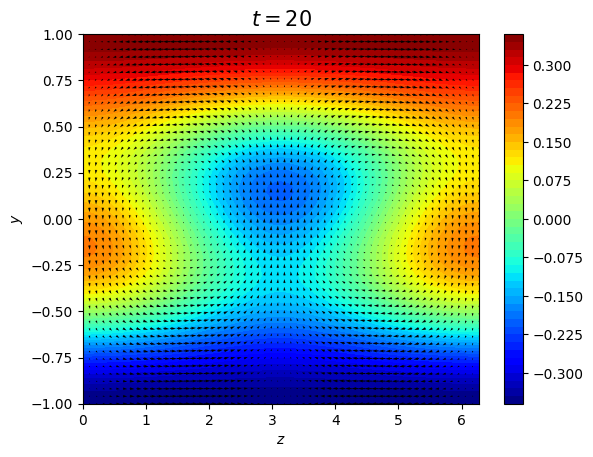

In [ ]:
Re = 400
Lx =4*np.pi
Ly = 2
Lz = 2*np.pi
a = 2*np.pi/Lx #alpha
b = np.pi/2.	#beta
g = 2*np.pi/Lz #gamma
p = [a, b, g, Re]


time = np.linspace(0, 300, 301)
y = np.linspace(-1, 1, 50)
x = np.linspace(0, Lx, 60)
z = np.linspace(0, Lz, 60)


u1x = np.zeros((len(y),len(z)))
u2x = np.zeros((len(y),len(z)))
u3y = np.zeros((len(y),len(z)))
u3z = np.zeros((len(y),len(z)))
u4z = np.zeros((len(y),len(z)))
u5z = np.zeros((len(y),len(z)))
u6x = np.zeros((len(y),len(z)))
u6z = np.zeros((len(y),len(z)))
u7x = np.zeros((len(y),len(z)))
u7z = np.zeros((len(y),len(z)))
u8x = np.zeros((len(y),len(z)))
u8y = np.zeros((len(y),len(z)))
u8z = np.zeros((len(y),len(z)))
u9x = np.zeros((len(y),len(z)))


#The following part of code stores x, y and z components of velocities ( U_X(time, y, z), U_Y(time, y, z), Y_Z(time, y, z) ) averaged over x
for k in range(len(z)):
	for j in range(len(y)):
		#n = j + len(y)*k
		for i in range(len(x)):
			u1x[j,k] += (np.sqrt(2)*np.sin(np.pi*y[j]/2.))
			u2x[j,k] += (4/np.sqrt(3))*(np.cos(np.pi*y[j]/2))**2*np.cos(g*z[k])
			u3y[j,k] += (2./np.sqrt(4*g**2+np.pi**2))*2*g*np.cos(np.pi*y[j]/2)*np.cos(g*z[k])
			u3z[j,k] += (2./np.sqrt(4*g**2+np.pi**2))*np.pi*np.sin(np.pi*y[j]/2)*np.sin(g*z[k])
			u4z[j,k] += (4/np.sqrt(3))*np.cos(a*x[i])*(np.cos(np.pi*y[j]/2))**2
			u5z[j,k] += 2*np.sin(a*x[i])*np.sin(np.pi*y[j]/2)
			u6x[j,k] += (4*np.sqrt(2)/np.sqrt(3*(a**2+g**2)))*(-g)*np.cos(a*x[i])*(np.cos(np.pi*y[j]/2))**2*np.sin(g*z[k])
			u6z[j,k] += (4*np.sqrt(2)/np.sqrt(3*(a**2+g**2)))*a*np.sin(a*x[i])*(np.cos(np.pi*y[j]/2))**2*np.cos(g*z[k])
			u7x[j,k] += (2*np.sqrt(2)/np.sqrt(a**2+g**2))*g*np.sin(a*x[i])*np.sin(np.pi*y[j]/2)*np.sin(g*z[k])
			u7z[j,k] += (2*np.sqrt(2)/np.sqrt(a**2+g**2))*a*np.cos(a*x[i])*np.sin(np.pi*y[j]/2)*np.cos(g*z[k])
			u8x[j,k] += ( 2*np.sqrt(2)/(np.sqrt((a**2+g**2)*(4*a**2+4*g**2+np.pi**2))) )*np.pi*a*np.sin(a*x[i])*np.sin(np.pi*y[j]/2)*np.sin(g*z[k])
			u8y[j,k] += ( 2*np.sqrt(2)/(np.sqrt((a**2+g**2)*(4*a**2+4*g**2+np.pi**2))) )*2*(a**2+g**2)*np.cos(a*x[i])*np.cos(np.pi*y[j]/2)*np.sin(g*z[k])
			u8z[j,k] += ( 2*np.sqrt(2)/(np.sqrt((a**2+g**2)*(4*a**2+4*g**2+np.pi**2))) )*(-np.pi*g)*np.cos(a*x[i])*np.sin(np.pi*y[j]/2)*np.cos(g*z[k])
			u9x[j,k] += np.sqrt(2)*np.sin(3*np.pi*y[j]/2)
		u1x[j,k] /= len(x)
		u2x[j,k] /= len(x)
		u3y[j,k] /= len(x)
		u3z[j,k] /= len(x)
		u4z[j,k] /= len(x)
		u5z[j,k] /= len(x)
		u6x[j,k] /= len(x)
		u6z[j,k] /= len(x)
		u7x[j,k] /= len(x)
		u7z[j,k] /= len(x)
		u8x[j,k] /= len(x)
		u8y[j,k] /= len(x)
		u8z[j,k] /= len(x)
		u9x[j,k] /= len(x)

dimV = (len(time), len(y), len(z))
U_X = np.zeros(dimV)
U_Y = np.zeros(dimV)
U_Z = np.zeros(dimV)

#print(np.shape(U_X))
#print(np.shape(U_Y))
#print(np.shape(U_Z))


for i in range(300):
	#print(time[i])
	for k in range(len(z)):
		for j in range(len(y)):
			t1 = time[i]
			U_X[i, j, k] = sol[i,0]*u1x[j,k] + sol[i,1]*u2x[j,k] + sol[i,5]*u6x[j,k] + sol[i,6]*u7x[j,k] + sol[i,7]*u8x[j,k] + sol[i,8]*u9x[j,k]
			U_Y[i, j, k] = sol[i,2]*u3y[j,k] + sol[i,7]*u8y[j,k]
			U_Z[i, j, k] = sol[i,2]*u3z[j,k] + sol[i,3]*u4z[j,k] + sol[i,4]*u5z[j,k] + sol[i,5]*u6z[j,k] + sol[i,6]*u7z[j,k] + sol[i,7]*u8z[j,k]

t = 20 #time at which instantaneous plots will be obtained
#Uncomment the following to plot instantaneous in-plane velocity quiver plot and out-of-plane contour plot at particular time value
fig2, ax = plt.subplots()
Y, Z = np.meshgrid(y, z)
plt.xlabel("$z$")
plt.ylabel("$y$")

plt.contourf(Z, Y, np.transpose(U_X[t, :, :]), levels = 50, cmap = 'jet')
plt.colorbar()
plt.quiver(Z, Y, np.transpose(U_Z[t, :, :]), np.transpose(U_Y[t, :, :]), color = 'k')
plt.title(r"$t = {0}$".format(t), fontsize = 15)
#plt.savefig("Instantaneous_velocities_t_{0}_Moehlis_Lx_4pi_Lz_2pi_Re_400_a1_1000.png".format(t))
plt.show()


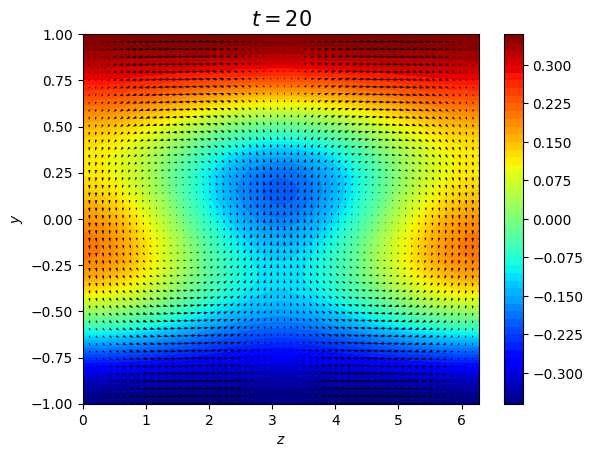

In [ ]:
t = 20 #time at which instantaneous plots will be obtained
#Uncomment the following to plot instantaneous in-plane velocity quiver plot and out-of-plane contour plot at particular time value
fig2, ax = plt.subplots()
Y, Z = np.meshgrid(y, z)
plt.xlabel("$z$")
plt.ylabel("$y$")

plt.contourf(Z, Y, np.transpose(U_X[t, :, :]), levels = 50, cmap = 'jet')
plt.colorbar()
plt.quiver(Z, Y, np.transpose(U_Z[t, :, :]), np.transpose(U_Y[t, :, :]), color = 'k')
plt.title(r"$t = {0}$".format(t), fontsize = 15)
plt.savefig("Instantaneous_velocities_t_{0}_LSTM.png".format(t))
plt.show()


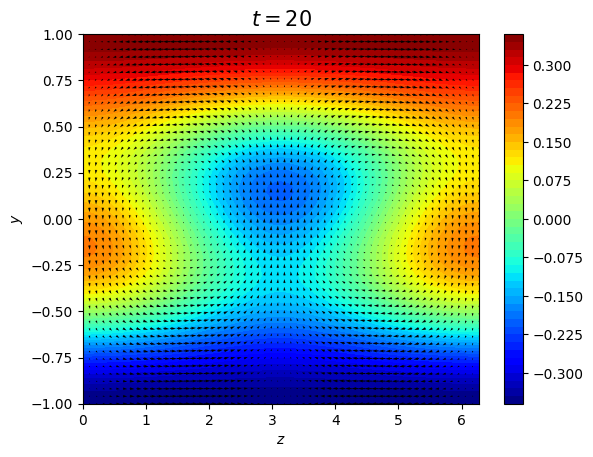

In [ ]:
t = 20 #time at which instantaneous plots will be obtained
#Uncomment the following to plot instantaneous in-plane velocity quiver plot and out-of-plane contour plot at particular time value
fig2, ax = plt.subplots()
Y, Z = np.meshgrid(y, z)
plt.xlabel("$z$")
plt.ylabel("$y$")

plt.contourf(Z, Y, np.transpose(U_X[t, :, :]), levels = 50, cmap = 'jet')
plt.colorbar()
plt.quiver(Z, Y, np.transpose(U_Z[t, :, :]), np.transpose(U_Y[t, :, :]), color = 'k')
plt.title(r"$t = {0}$".format(t), fontsize = 15)
plt.savefig("Instantaneous_velocities_t_{0}_GRU.png".format(t))
plt.show()
